In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import pickle
import sys

# show all columns and all column content
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

In [2]:
def hued_lineplot(df: pd.DataFrame, column_1: str, column_2: str, hued_column: str,
                  labels: list, xlabel: str, ylabel: str, title: str, 
                  color_set: str='Set1', xsize: int=30, ysize: int=15,
                  is_grid_required: bool=False):
    """Hued lineplot

    Args:
        df (pd.DataFrame): data to plot
        column_1 (str): x axis column
        column_2 (str): y axis column
        hued_column (str): column based on which hue will be performed
        labels (list): categories based on which hue will be done
        xlabel (str): x axis name
        ylabel (str): y axis name
        title (str): name of the chart
        color_set (str, optional): color set chosen for plotting lines. Defaults to 'Set1'.
        xsize (int, optional): x size of chart. Defaults to 30.
        ysize (int, optional): y size of chart. Defaults to 15.
        is_grid_required (bool, optional): is grid of the chart required. Defaults to False
    """
    fig, ax = plt.subplots(figsize=(xsize, ysize))
    rgb_values = sns.color_palette(color_set, len(labels))
    color_map = dict(zip(labels, rgb_values))
    
    for label in labels:
        ax.plot(df[df[hued_column] == label][column_1], df[df[hued_column] == label][column_2],
                color=color_map[label], label=label)
    
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_title(title)
    
    fig.legend()
    ax.grid(is_grid_required)
    plt.show()

# Loading data

In [3]:
pool_names = ['BTC/USDC', 'ETH/USDC', 'YFI/USDC', 'DOT/USDC', 'SNX/USDC',
            'LINK/USDC', 'AAVE/USDC', 'SUSHI/USDC', 'COMP/USDC', 'REN/USDC',
            'PERP/USDC', 'UNI/USDC', 'CRV/USDC', 'MKR/USDC', 'CREAM/USDC',
            'GRT/USDC', 'ALPHA/USDC', 'FTT/USDC']

big_pools = ['BTC/USDC', 'YFI/USDC']
medium_pools = ['ETH/USDC', 'MKR/USDC', 'COMP/USDC', 'AAVE/USDC']
small_pools = ['DOT/USDC', 'SNX/USDC', 'LINK/USDC',  'SUSHI/USDC', 
               'REN/USDC', 'PERP/USDC', 'UNI/USDC', 'CRV/USDC', 
               'GRT/USDC', 'ALPHA/USDC', 'unknown', 'FTT/USDC', 'CREAM/USDC']

In [4]:
overall_history_list = []
for amm_name in pool_names:
    amm_history = pd.read_csv('' + amm_name.split('/')[0].lower() + '_usdc_indexed_position.csv')
    print('amm ' + amm_name + ' has ' + str(len(amm_history[(amm_history['position_size_after'] == 0) &
                                                           (amm_history['exchanged_position_size'] != 0)])) + 
                                                ' closes')
    
    overall_history_list.append(amm_history)
    
opens_closes_positions_df = pd.concat(overall_history_list)

amm BTC/USDC has 34253 closes
amm ETH/USDC has 44866 closes
amm YFI/USDC has 64003 closes
amm DOT/USDC has 82901 closes
amm SNX/USDC has 94867 closes
amm LINK/USDC has 65534 closes
amm AAVE/USDC has 78000 closes
amm SUSHI/USDC has 94437 closes
amm COMP/USDC has 72679 closes
amm REN/USDC has 89550 closes
amm PERP/USDC has 83685 closes
amm UNI/USDC has 55174 closes
amm CRV/USDC has 93346 closes
amm MKR/USDC has 47335 closes
amm CREAM/USDC has 61454 closes
amm GRT/USDC has 72325 closes
amm ALPHA/USDC has 56656 closes
amm FTT/USDC has 39502 closes


In [5]:
closes_stats_df = pd.DataFrame()
for amm in opens_closes_positions_df['amm_name'].unique():
    amm_history = opens_closes_positions_df[opens_closes_positions_df['amm_name'] == amm]
    new_record = {'amm': amm, 'closes_count': len(amm_history[(amm_history['position_size_after'] == 0) &
                                                           (amm_history['exchanged_position_size'] != 0)])}
    closes_stats_df = closes_stats_df.append(new_record, ignore_index=True)
    
closes_stats_df

,amm,closes_count
0,BTC/USDC,34253.0
1,ETH/USDC,44866.0
2,YFI/USDC,64003.0
3,DOT/USDC,82901.0
4,SNX/USDC,94867.0
5,LINK/USDC,65534.0
6,AAVE/USDC,78000.0
7,SUSHI/USDC,94437.0
8,COMP/USDC,72679.0
9,REN/USDC,89550.0


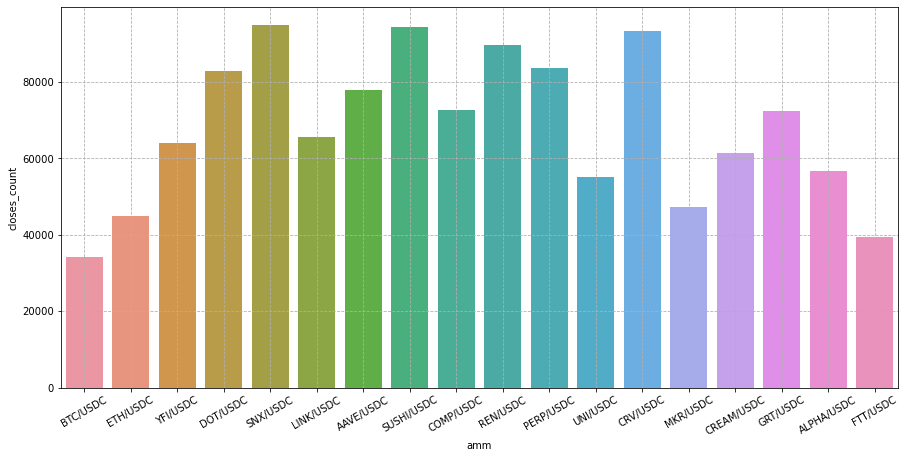

In [6]:
ax = plt.figure(figsize=(15, 7))
sns.barplot(data=closes_stats_df, x='amm', y='closes_count')
plt.xticks(rotation=30)
plt.grid(True, linestyle='--')
plt.show()

In [7]:
opens_closes_positions_df = opens_closes_positions_df.astype({'open_id': int})
opens_closes_positions_df['timestamp'] = pd.to_datetime(opens_closes_positions_df['timestamp'])
opens_closes_positions_df

,Unnamed: 0,id,trader,amm,margin,position_notional,exchanged_position_size,fee,position_size_after,realized_pnl,unrealized_pnl_after,bad_debt,liquidation_penalty,spot_price,funding_payment,block_number,timestamp,amm_name,open_close_id,open_id
0,0,0x06d54c4ad4bfff493051ef548557f4fa0c76fb2dd6787fd665f3b9bf001ad88e-20,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0x0f346e19f01471c02485df1758cfd3d624e399b4,5.552446e+03,1.665734e+04,8.727098e-01,16.657338,8.727098e-01,0.000000e+00,0.000000,0.0,0.0,19120.287600,0.000000,13508290,2020-12-14 03:16:05,BTC/USDC,0.0,1
1,3,0xe9d804889de5a27a356777a588d6c018e55fa1cae61c6265f11595c4c293a697-6,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0x0f346e19f01471c02485df1758cfd3d624e399b4,1.111460e+04,1.668646e+04,8.711866e-01,16.686462,1.743896e+00,0.000000e+00,58.249669,0.0,0.0,19187.208607,0.000000,13508954,2020-12-14 04:11:45,BTC/USDC,0.0,1
2,4,0xea81e16520eae51395b4627365487daa2013df876ef3e38254579d1d149b17fd-6,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0x0f346e19f01471c02485df1758cfd3d624e399b4,0.000000e+00,3.334380e+04,-1.743896e+00,33.343800,0.000000e+00,-1.782200e-14,0.000000,0.0,0.0,19053.600000,0.000000,13509011,2020-12-14 04:16:30,BTC/USDC,0.0,1
3,34,0xcbc30cda2cff5814702d67c67530f6598a670ad990f3875e8e314c564279df13-6,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0x0f346e19f01471c02485df1758cfd3d624e399b4,5.555467e+03,1.666640e+04,8.722351e-01,16.666402,8.722351e-01,0.000000e+00,0.000000,0.0,0.0,19141.103310,0.000000,13511238,2020-12-14 07:23:25,BTC/USDC,16.0,2
4,51,0xb7f635c0407feb60d7386e18b0d102503e5c9f034be9791bd961f75d22aceb69-6,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0x0f346e19f01471c02485df1758cfd3d624e399b4,1.112383e+04,1.670391e+04,8.702764e-01,16.703914,1.742512e+00,0.000000e+00,75.042344,0.0,0.0,19227.363807,-0.395807,13512310,2020-12-14 08:53:25,BTC/USDC,0.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
301908,9271512,0x46558498bb5962a524f0b63d724d92777bb17b504e44441415f66ecdd6b4fa3f-12,0xb39885f302643a5f96f743c3621d628dc3f72ce6,0x838b322610bd99a449091d3bf3fba60d794909a9,3.690119e+03,2.154072e+03,5.000000e+01,2.154072,3.000000e+02,0.000000e+00,-0.785120,0.0,0.0,43.091241,0.000000,21019327,2022-03-09 11:41:00,FTT/USDC,0.0,1
301909,9274150,0x3ddf503cacc2125a68cc17a9b84e2971d6242423eea0175b6a7a93bd2bd82b80-13,0xb39885f302643a5f96f743c3621d628dc3f72ce6,0x838b322610bd99a449091d3bf3fba60d794909a9,1.100000e-17,1.286891e+04,-3.000000e+02,12.868911,-1.000000e-18,-4.650566e+01,0.000000,0.0,0.0,42.837940,-1.905190,21021513,2022-03-09 14:54:15,FTT/USDC,0.0,1
301910,9274155,0x4215d5f56936f1604171ada50922c0e5af609369ea109981b0f9cd8d925662bc-25,0xb39885f302643a5f96f743c3621d628dc3f72ce6,0x838b322610bd99a449091d3bf3fba60d794909a9,0.000000e+00,4.300000e-17,1.000000e-18,0.000000,0.000000e+00,-2.000000e-18,0.000000,0.0,0.0,42.869642,0.000000,21021523,2022-03-09 14:55:10,FTT/USDC,0.0,1
301911,9318436,0x507dae82675d33cc29766b5792ef6c527149ac4ddae469e5a9ead2e606ec9c80-8,0xa84daa76815f6d2cf99e406bd693e8588bc36dbe,0x838b322610bd99a449091d3bf3fba60d794909a9,1.000000e+00,1.500000e+00,3.664475e-02,0.001500,3.664475e-02,0.000000e+00,0.000000,0.0,0.0,40.933570,0.000000,21061399,2022-03-12 00:22:55,FTT/USDC,1231736.0,1


In [8]:
opens_closes_positions_df.sort_values(by=['Unnamed: 0'], inplace=True)

# Check opened positions ID

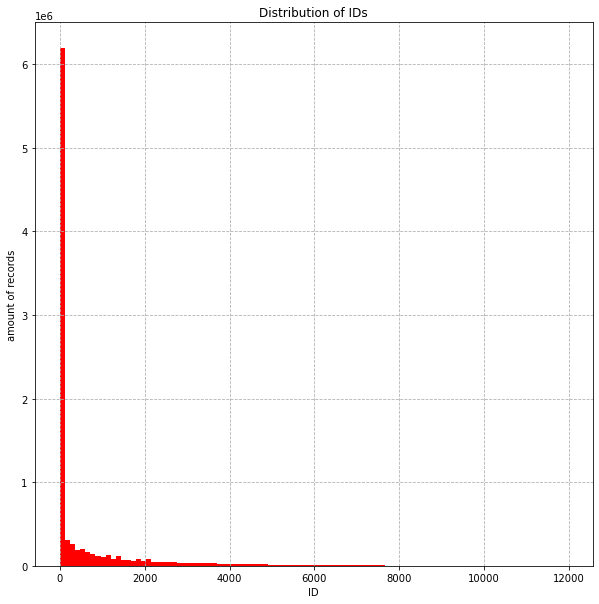

In [9]:
fig, ax = plt.subplots(figsize=(10, 10))
ax.hist(opens_closes_positions_df['open_id'], bins=100, color='r')
ax.set_xlabel('ID')
ax.set_ylabel('amount of records')
ax.grid(True, linestyle='--')
ax.set_title('Distribution of IDs')
plt.show()

In [10]:
opens_closes_positions_df

,Unnamed: 0,id,trader,amm,margin,position_notional,exchanged_position_size,fee,position_size_after,realized_pnl,unrealized_pnl_after,bad_debt,liquidation_penalty,spot_price,funding_payment,block_number,timestamp,amm_name,open_close_id,open_id
0,0,0x06d54c4ad4bfff493051ef548557f4fa0c76fb2dd6787fd665f3b9bf001ad88e-20,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0x0f346e19f01471c02485df1758cfd3d624e399b4,5552.445854,16657.337561,0.872710,16.657338,0.872710,0.000000e+00,0.000000e+00,0.0,0.0,19120.287600,0.000000,13508290,2020-12-14 03:16:05,BTC/USDC,0.0,1
0,1,0x0e824c5f4e27ba5f29b8791e25e76e732783b25bba4498c380a37efc42478077-6,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0x8d22f1a9dce724d8c1b4c688d75f17a2fe2d32df,6816.007869,20448.023608,34.908392,20.448024,34.908392,0.000000e+00,0.000000e+00,0.0,0.0,586.786590,0.000000,13508290,2020-12-14 03:16:05,ETH/USDC,1.0,1
1,2,0xeebbca404104c295253184426d13273fcafcb78867736833c355a2db2eebc747-13,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0x8d22f1a9dce724d8c1b4c688d75f17a2fe2d32df,13632.015738,20448.023608,34.786745,20.448024,69.695137,0.000000e+00,7.138055e+01,0.0,0.0,588.836755,0.000000,13508290,2020-12-14 03:16:05,ETH/USDC,0.0,1
1,3,0xe9d804889de5a27a356777a588d6c018e55fa1cae61c6265f11595c4c293a697-6,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0x0f346e19f01471c02485df1758cfd3d624e399b4,11114.600000,16686.462439,0.871187,16.686462,1.743896,0.000000e+00,5.824967e+01,0.0,0.0,19187.208607,0.000000,13508954,2020-12-14 04:11:45,BTC/USDC,0.0,1
2,4,0xea81e16520eae51395b4627365487daa2013df876ef3e38254579d1d149b17fd-6,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0x0f346e19f01471c02485df1758cfd3d624e399b4,0.000000,33343.800000,-1.743896,33.343800,0.000000,-1.782200e-14,0.000000e+00,0.0,0.0,19053.600000,0.000000,13509011,2020-12-14 04:16:30,BTC/USDC,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
394768,9341964,0xd6b80d8c63a2e68138c6b7f7373dcdc279d7b977b3662cd603a8246d051360bc-4,0xce7e86725fa9ef1f5cd0f266bf5d48af1686f445,0x8d22f1a9dce724d8c1b4c688d75f17a2fe2d32df,3978.375077,1557.933590,-0.599936,1.557934,1.500108,2.365634e+00,5.915138e+00,0.0,0.0,2596.667440,0.000000,21102610,2022-03-14 09:46:50,ETH/USDC,0.0,4
750675,9341965,0xfcbb8bd63053c16269c4a1557a6fd42e3ddd92998c6b32f8657873417a5993ff-4,0x9d9250586e0443b49cbc975aa51dfb739c8ec50d,0xab08ff2c726f2f333802630ee19f4146385cc343,25461.339595,2314.200313,1171.740513,2.314200,-11576.634820,-1.305977e+01,-1.290287e+02,0.0,0.0,1.975700,1.483261,21102627,2022-03-14 09:48:15,CRV/USDC,0.0,85
213215,9341966,0x3430325ddfd0ae52500a6c7c6c36cfd8193f81a76aa53fa5e64e25afcd9b305e-4,0x72dd2ce1b88f2cbcee606ec2ede14cf03563e08d,0x26789518695b56e16f14008c35dc1b281bd5fc0e,18127.454018,613.110965,2350.725652,0.613111,-92971.274248,4.709797e+00,1.862726e+02,0.0,0.0,0.260852,0.000000,21102629,2022-03-14 09:48:25,ALPHA/USDC,0.0,1
474406,9341967,0x26460150a641bcc3ddba218653448d0e0d05968049b82556afa9e7a938eac68c-5,0xc701072cd7396622fac184aa778d549a34b1545c,0xd41025350582674144102b74b8248550580bb869,0.000000,4002.836312,0.215159,4.002836,0.000000,-2.836312e+00,0.000000e+00,0.0,0.0,18621.705633,0.000000,21102631,2022-03-14 09:48:35,YFI/USDC,0.0,3505


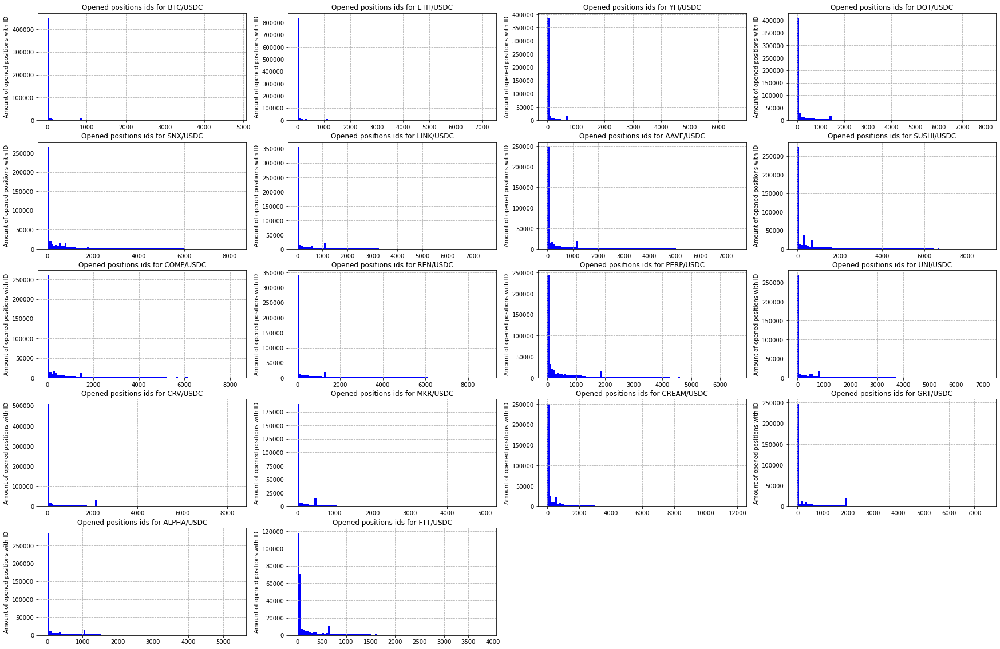

In [11]:
plt.figure(figsize=(30, 20))
index = 0

for amm_name in opens_closes_positions_df['amm_name'].unique():
    ax = plt.subplot(5, 4, index+1)
    ax.hist(opens_closes_positions_df[opens_closes_positions_df['amm_name'] == amm_name]['open_id'], bins=100, color='b')
    ax.set_title('Opened positions ids for ' + amm_name)
    ax.set_ylabel('Amount of opened positions with ID')
    ax.grid(True, linestyle='--')
    index += 1
    
plt.show()

In [12]:
print(
    "value of traders with more than 20 opens in any of the pools = " + 
    str(len(opens_closes_positions_df[opens_closes_positions_df['open_id'] > 20]['trader'].unique()))
)

value of traders with more than 20 opens in any of the pools = 432


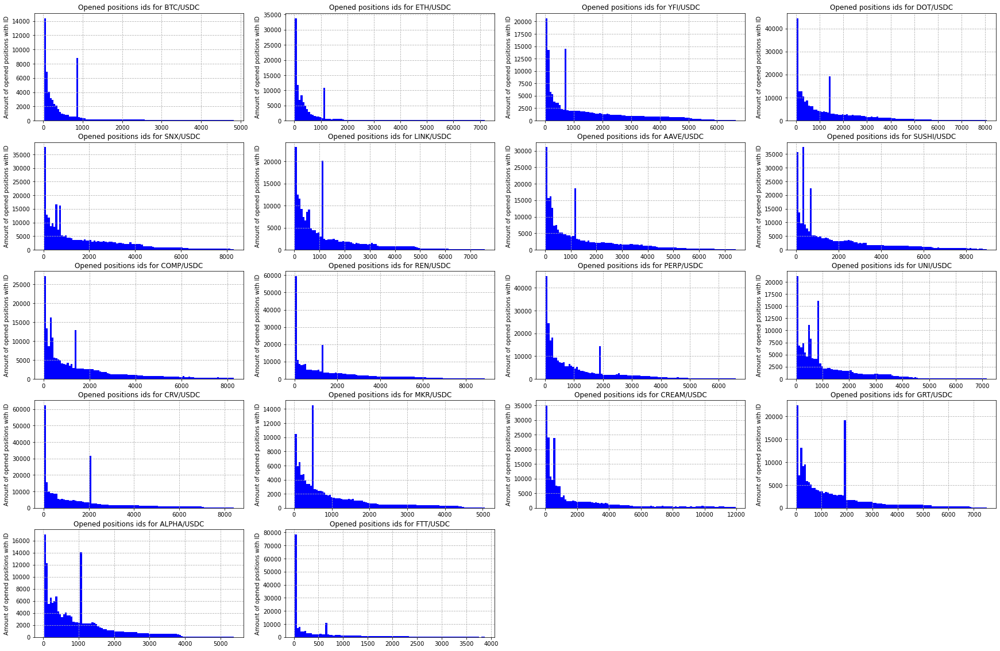

In [13]:
plt.figure(figsize=(30, 20))
index = 0

for amm_name in opens_closes_positions_df['amm_name'].unique():
    ax = plt.subplot(5, 4, index+1)
    ax.hist(opens_closes_positions_df[(opens_closes_positions_df['amm_name'] == amm_name) &
                                      (opens_closes_positions_df['open_id'] > 20)]['open_id'], bins=100, color='b')
    ax.set_title('Opened positions ids for ' + amm_name)
    ax.set_ylabel('Amount of opened positions with ID')
    ax.grid(True, linestyle='--')
    index += 1
    
plt.show()

In [14]:
for amm in opens_closes_positions_df['amm_name'].unique():
    print("for " + amm + " there are " + str(len(opens_closes_positions_df[(opens_closes_positions_df['open_id'] > 20) &
                                                                            (opens_closes_positions_df['amm_name'] == amm)])))

for BTC/USDC there are 65118
for ETH/USDC there are 115473
for YFI/USDC there are 159906
for DOT/USDC there are 253422
for SNX/USDC there are 291953
for LINK/USDC there are 205656
for AAVE/USDC there are 248685
for SUSHI/USDC there are 309483
for COMP/USDC there are 220081
for REN/USDC there are 276877
for PERP/USDC there are 299804
for UNI/USDC there are 166733
for CRV/USDC there are 322607
for MKR/USDC there are 126836
for CREAM/USDC there are 222919
for GRT/USDC there are 207064
for ALPHA/USDC there are 170199
for FTT/USDC there are 195352


In [15]:
opens_closes_positions_df

,Unnamed: 0,id,trader,amm,margin,position_notional,exchanged_position_size,fee,position_size_after,realized_pnl,unrealized_pnl_after,bad_debt,liquidation_penalty,spot_price,funding_payment,block_number,timestamp,amm_name,open_close_id,open_id
0,0,0x06d54c4ad4bfff493051ef548557f4fa0c76fb2dd6787fd665f3b9bf001ad88e-20,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0x0f346e19f01471c02485df1758cfd3d624e399b4,5552.445854,16657.337561,0.872710,16.657338,0.872710,0.000000e+00,0.000000e+00,0.0,0.0,19120.287600,0.000000,13508290,2020-12-14 03:16:05,BTC/USDC,0.0,1
0,1,0x0e824c5f4e27ba5f29b8791e25e76e732783b25bba4498c380a37efc42478077-6,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0x8d22f1a9dce724d8c1b4c688d75f17a2fe2d32df,6816.007869,20448.023608,34.908392,20.448024,34.908392,0.000000e+00,0.000000e+00,0.0,0.0,586.786590,0.000000,13508290,2020-12-14 03:16:05,ETH/USDC,1.0,1
1,2,0xeebbca404104c295253184426d13273fcafcb78867736833c355a2db2eebc747-13,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0x8d22f1a9dce724d8c1b4c688d75f17a2fe2d32df,13632.015738,20448.023608,34.786745,20.448024,69.695137,0.000000e+00,7.138055e+01,0.0,0.0,588.836755,0.000000,13508290,2020-12-14 03:16:05,ETH/USDC,0.0,1
1,3,0xe9d804889de5a27a356777a588d6c018e55fa1cae61c6265f11595c4c293a697-6,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0x0f346e19f01471c02485df1758cfd3d624e399b4,11114.600000,16686.462439,0.871187,16.686462,1.743896,0.000000e+00,5.824967e+01,0.0,0.0,19187.208607,0.000000,13508954,2020-12-14 04:11:45,BTC/USDC,0.0,1
2,4,0xea81e16520eae51395b4627365487daa2013df876ef3e38254579d1d149b17fd-6,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0x0f346e19f01471c02485df1758cfd3d624e399b4,0.000000,33343.800000,-1.743896,33.343800,0.000000,-1.782200e-14,0.000000e+00,0.0,0.0,19053.600000,0.000000,13509011,2020-12-14 04:16:30,BTC/USDC,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
394768,9341964,0xd6b80d8c63a2e68138c6b7f7373dcdc279d7b977b3662cd603a8246d051360bc-4,0xce7e86725fa9ef1f5cd0f266bf5d48af1686f445,0x8d22f1a9dce724d8c1b4c688d75f17a2fe2d32df,3978.375077,1557.933590,-0.599936,1.557934,1.500108,2.365634e+00,5.915138e+00,0.0,0.0,2596.667440,0.000000,21102610,2022-03-14 09:46:50,ETH/USDC,0.0,4
750675,9341965,0xfcbb8bd63053c16269c4a1557a6fd42e3ddd92998c6b32f8657873417a5993ff-4,0x9d9250586e0443b49cbc975aa51dfb739c8ec50d,0xab08ff2c726f2f333802630ee19f4146385cc343,25461.339595,2314.200313,1171.740513,2.314200,-11576.634820,-1.305977e+01,-1.290287e+02,0.0,0.0,1.975700,1.483261,21102627,2022-03-14 09:48:15,CRV/USDC,0.0,85
213215,9341966,0x3430325ddfd0ae52500a6c7c6c36cfd8193f81a76aa53fa5e64e25afcd9b305e-4,0x72dd2ce1b88f2cbcee606ec2ede14cf03563e08d,0x26789518695b56e16f14008c35dc1b281bd5fc0e,18127.454018,613.110965,2350.725652,0.613111,-92971.274248,4.709797e+00,1.862726e+02,0.0,0.0,0.260852,0.000000,21102629,2022-03-14 09:48:25,ALPHA/USDC,0.0,1
474406,9341967,0x26460150a641bcc3ddba218653448d0e0d05968049b82556afa9e7a938eac68c-5,0xc701072cd7396622fac184aa778d549a34b1545c,0xd41025350582674144102b74b8248550580bb869,0.000000,4002.836312,0.215159,4.002836,0.000000,-2.836312e+00,0.000000e+00,0.0,0.0,18621.705633,0.000000,21102631,2022-03-14 09:48:35,YFI/USDC,0.0,3505


In [16]:
opens_closes_positions_df[opens_closes_positions_df.position_size_after == 0]

,Unnamed: 0,id,trader,amm,margin,position_notional,exchanged_position_size,fee,position_size_after,realized_pnl,unrealized_pnl_after,bad_debt,liquidation_penalty,spot_price,funding_payment,block_number,timestamp,amm_name,open_close_id,open_id
2,4,0xea81e16520eae51395b4627365487daa2013df876ef3e38254579d1d149b17fd-6,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0x0f346e19f01471c02485df1758cfd3d624e399b4,0.0,33343.800000,-1.743896,33.343800,0.0,-1.782200e-14,0.0,0.0,0.0,19053.600000,0.000000,13509011,2020-12-14 04:16:30,BTC/USDC,0.0,1
2,5,0xacc1edbc8c6244635a5e6f7a67e99d6f9f567fa47bf24d4ea61d1d920de0f95d-8,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0x8d22f1a9dce724d8c1b4c688d75f17a2fe2d32df,0.0,40896.047215,-69.695137,40.896047,0.0,-4.520000e-16,0.0,0.0,0.0,584.740000,0.000000,13509018,2020-12-14 04:17:05,ETH/USDC,0.0,1
113711,14,0x6bb1ea8933e35f4dd5a89ecd80503e2edfaab34ff76536a78ba1110895738829-8,0x3f84e391ea8dc12946e17d1d85cdf0b35d4fe650,0x8d22f1a9dce724d8c1b4c688d75f17a2fe2d32df,0.0,585.191388,1.000000,0.585191,0.0,-5.853733e-02,0.0,0.0,0.0,585.220660,0.000000,13510820,2020-12-14 06:48:10,ETH/USDC,0.0,1
113659,17,0x3eacb25a075452d4d0eecdeeaf4c9aca626fd5d7dbdc235cfa990efad42559fc-13,0x9602686bf53a17baed60c48ba34ed4219a532381,0x8d22f1a9dce724d8c1b4c688d75f17a2fe2d32df,0.0,3052.503690,-5.215000,3.052504,0.0,2.289247e+00,0.0,0.0,0.0,585.178802,-0.215984,13510977,2020-12-14 07:01:30,ETH/USDC,0.0,1
98881,21,0x8b45f59f61496a1af80cf76f1c19464d7501516b8eeb0195b120c0f4991a757e-8,0x5bea7caa02142ba59885466757e1112819731f09,0x0f346e19f01471c02485df1758cfd3d624e399b4,0.0,1907.704625,-0.100000,1.907705,0.0,1.206095e+00,0.0,0.0,0.0,19073.228880,-0.125905,13511028,2020-12-14 07:05:45,BTC/USDC,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
331741,9341918,0xa3818e92d9a46e150c9502d868e69b2f65a0e24d0deb284420d9b65ae1b3c851-5,0x4700381c4ee01d026dc91a6d4549b77036e5ea9b,0x187c938543f2bde09fe39034fe3ff797a3d35ca0,0.0,4509.670374,12768.660040,4.509670,0.0,-9.670374e+00,0.0,0.0,0.0,0.353481,0.000000,21102548,2022-03-14 09:41:40,GRT/USDC,0.0,5025
356773,9341925,0x4a075fc7ea21e1d0971517fcf20b8b4686d0cc32f423ee8fc7c1239da7b771e3-10,0xa46261c04043ff0cd57c7f9dda3db9f353d2d6f2,0x187c938543f2bde09fe39034fe3ff797a3d35ca0,0.0,2500.000000,-7069.222561,2.500000,0.0,-1.000000e-18,0.0,0.0,0.0,0.353481,0.000000,21102563,2022-03-14 09:42:55,GRT/USDC,0.0,7498
388168,9341948,0x161ea22008ae0843a9da2ec461aa5d6e07a7f4346f80f5049a339e76beebc69c-13,0xb35ba7ddb1f5b09bffb2955fe843b5d15b8d7a25,0x187c938543f2bde09fe39034fe3ff797a3d35ca0,0.0,3500.000000,9908.013334,3.500000,0.0,-1.000000e-18,0.0,0.0,0.0,0.353481,0.000000,21102578,2022-03-14 09:44:10,GRT/USDC,0.0,6869
381330,9341950,0x4f2727e066a35c052efb1f890695703ea04a882acf3349c567e744a507ecb07d-7,0x1b11659201f2b339b14acbdf975719b2c677fc2d,0x7b479a0a816ca33f8eb5a3312d1705a34d2d4c82,0.0,2491.368778,58.373783,2.491369,0.0,8.631222e+00,0.0,0.0,0.0,42.703063,-0.095260,21102579,2022-03-14 09:44:15,CREAM/USDC,0.0,3905


In [17]:
len(opens_closes_positions_df[opens_closes_positions_df['position_size_after'] == 0])

1230582

# Dynamics of the 1-st, 10-th, 50-th and 100-th opened position token trend

In [18]:
for amm_name in opens_closes_positions_df['amm_name'].unique():
    current_amm = opens_closes_positions_df[opens_closes_positions_df['amm_name'] == amm_name]
    positive_sum = current_amm[current_amm['exchanged_position_size'] > 0]['exchanged_position_size'].sum()
    negative_sum = current_amm[current_amm['exchanged_position_size'] < 0]['exchanged_position_size'].sum()
    print('amm ' + amm_name + ' has positive position changes sum = ' + 
          str(positive_sum) +
          '; has negative position changes sum = ' + 
          str(negative_sum) +
          '; balance = ' + str(positive_sum + negative_sum) + ' (' + amm_name.split('/')[0] + ')')

amm BTC/USDC has positive position changes sum = 36972.875931211456; has negative position changes sum = -36810.8462445257; balance = 162.0296866857534 (BTC)
amm ETH/USDC has positive position changes sum = 1579438.5726033505; has negative position changes sum = -1568928.713537723; balance = 10509.859065627446 (ETH)
amm YFI/USDC has positive position changes sum = 30069.797958232026; has negative position changes sum = -30086.016681015346; balance = -16.218722783320118 (YFI)
amm DOT/USDC has positive position changes sum = 50673090.65209905; has negative position changes sum = -50660454.44606199; balance = 12636.206037059426 (DOT)
amm SNX/USDC has positive position changes sum = 71442589.85022214; has negative position changes sum = -71743150.95832498; balance = -300561.10810284317 (SNX)
amm LINK/USDC has positive position changes sum = 47997015.44834631; has negative position changes sum = -48124355.76084824; balance = -127340.3125019297 (LINK)
amm AAVE/USDC has positive position chan

In [19]:
for amm in opens_closes_positions_df['amm_name'].unique():
    print("amm " + amm + " has " + 
          str(len(opens_closes_positions_df[opens_closes_positions_df['amm_name'] == amm]['trader'].unique())) +
         " traders")

amm BTC/USDC has 5023 traders
amm ETH/USDC has 4154 traders
amm YFI/USDC has 531 traders
amm DOT/USDC has 769 traders
amm SNX/USDC has 531 traders
amm LINK/USDC has 842 traders
amm AAVE/USDC has 560 traders
amm SUSHI/USDC has 703 traders
amm COMP/USDC has 398 traders
amm REN/USDC has 396 traders
amm PERP/USDC has 959 traders
amm UNI/USDC has 491 traders
amm CRV/USDC has 717 traders
amm MKR/USDC has 327 traders
amm CREAM/USDC has 347 traders
amm GRT/USDC has 359 traders
amm ALPHA/USDC has 572 traders
amm FTT/USDC has 566 traders


In [20]:
users_count_df = pd.DataFrame()
for amm in opens_closes_positions_df['amm_name'].unique():
    amm_positions_df = opens_closes_positions_df[opens_closes_positions_df['amm_name'] == amm]
    new_record = {"amm": amm, "users count": len(amm_positions_df['trader'].unique())}
    users_count_df = users_count_df.append(new_record, ignore_index=True)
    
users_count_df

,amm,users count
0,BTC/USDC,5023.0
1,ETH/USDC,4154.0
2,YFI/USDC,531.0
3,DOT/USDC,769.0
4,SNX/USDC,531.0
5,LINK/USDC,842.0
6,AAVE/USDC,560.0
7,SUSHI/USDC,703.0
8,COMP/USDC,398.0
9,REN/USDC,396.0


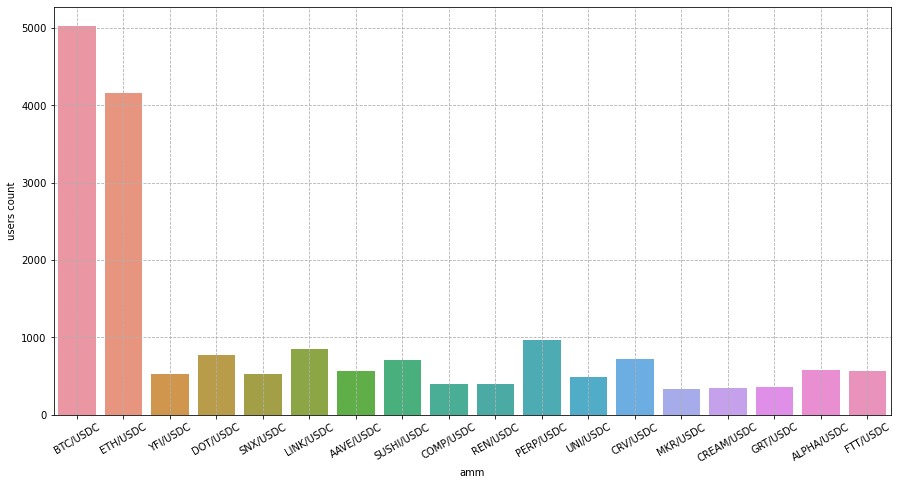

In [21]:
plt.figure(figsize=(15, 7.5))
sns.barplot(data=users_count_df, x='amm', y='users count')
plt.grid(True, linestyle='--')
plt.xticks(rotation=30)
plt.show()

In [22]:
opens_closes_positions_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9341950 entries, 0 to 419599
Data columns (total 20 columns):
 #   Column                   Dtype         
---  ------                   -----         
 0   Unnamed: 0               int64         
 1   id                       object        
 2   trader                   object        
 3   amm                      object        
 4   margin                   float64       
 5   position_notional        float64       
 6   exchanged_position_size  float64       
 7   fee                      float64       
 8   position_size_after      float64       
 9   realized_pnl             float64       
 10  unrealized_pnl_after     float64       
 11  bad_debt                 float64       
 12  liquidation_penalty      float64       
 13  spot_price               float64       
 14  funding_payment          float64       
 15  block_number             int64         
 16  timestamp                datetime64[ns]
 17  amm_name                 obj

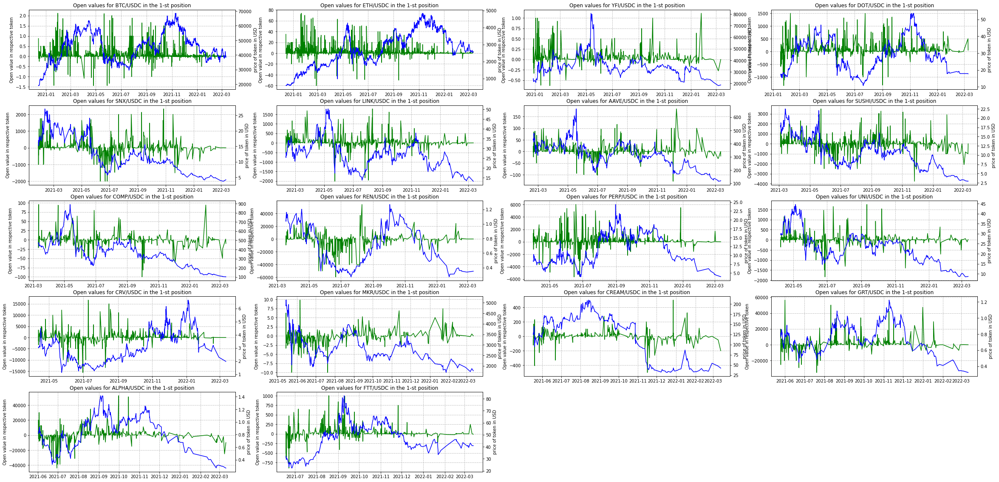

In [23]:
plt.figure(figsize=(40, 20))
index = 0

for amm_name in opens_closes_positions_df['amm_name'].unique():
    ax = plt.subplot(5, 4, index+1)
    ax2 = ax.twinx()
    ax.plot(opens_closes_positions_df[(opens_closes_positions_df['amm_name'] == amm_name) &
                                      (opens_closes_positions_df['open_id'] == 1) &
                                      (opens_closes_positions_df['exchanged_position_size'] == 
                                                opens_closes_positions_df['position_size_after'])]['timestamp'], 
            opens_closes_positions_df[(opens_closes_positions_df['amm_name'] == amm_name) &
                                      (opens_closes_positions_df['open_id'] == 1) &
                                      (opens_closes_positions_df['exchanged_position_size'] == 
                                               opens_closes_positions_df['position_size_after'])]['exchanged_position_size'], 
            color='g')
    
    ax2.plot(opens_closes_positions_df[(opens_closes_positions_df['amm_name'] == amm_name) &
                                      (opens_closes_positions_df['open_id'] == 1) &
                                      (opens_closes_positions_df['exchanged_position_size'] == 
                                                       opens_closes_positions_df['position_size_after'])]['timestamp'], 
            opens_closes_positions_df[(opens_closes_positions_df['amm_name'] == amm_name) &
                                      (opens_closes_positions_df['open_id'] == 1) &
                                      (opens_closes_positions_df['exchanged_position_size'] == 
                                                       opens_closes_positions_df['position_size_after'])]['spot_price'], 
            color='b')
    
    ax.set_title('Open values for ' + amm_name + ' in the 1-st position')
    ax.set_ylabel('Open value in respective token')
    ax2.set_ylabel('price of token in USD')
    ax.grid(True, linestyle='--')
    index += 1
    
fig.tight_layout()
plt.show()

In [24]:
opens_closes_positions_df.sort_values(by=['block_number', 'timestamp'], inplace=True)

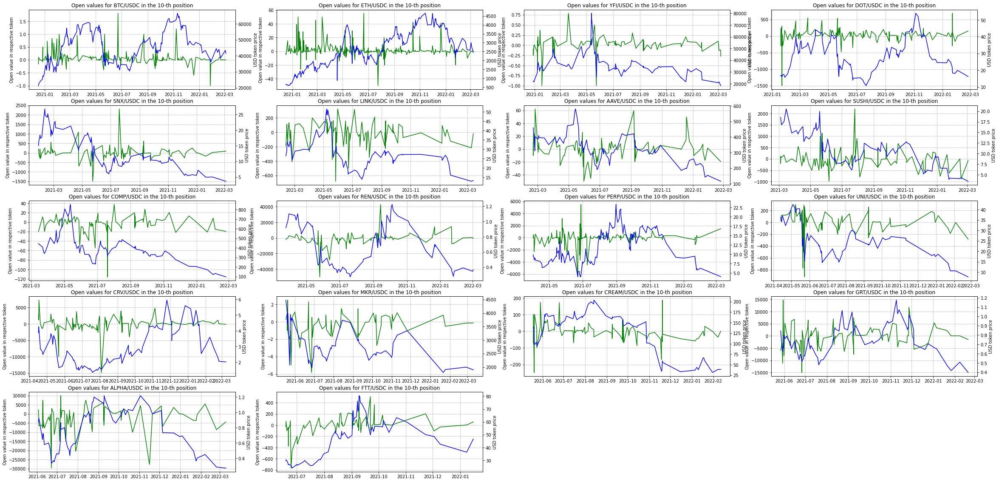

In [25]:
plt.figure(figsize=(40, 20))
index = 0

for amm_name in opens_closes_positions_df['amm_name'].unique():
    ax = plt.subplot(5, 4, index+1)
    ax2 = ax.twinx()
    
    ax.plot(opens_closes_positions_df[(opens_closes_positions_df['amm_name'] == amm_name) &
                                      (opens_closes_positions_df['open_id'] == 10) &
                                      (opens_closes_positions_df['exchanged_position_size'] == opens_closes_positions_df['position_size_after'])]['timestamp'], 
            opens_closes_positions_df[(opens_closes_positions_df['amm_name'] == amm_name) &
                                      (opens_closes_positions_df['open_id'] == 10) &
                                      (opens_closes_positions_df['exchanged_position_size'] == opens_closes_positions_df['position_size_after'])]['exchanged_position_size'], 
            color='g')
    ax2.plot(opens_closes_positions_df[(opens_closes_positions_df['amm_name'] == amm_name) &
                                      (opens_closes_positions_df['open_id'] == 10) &
                                      (opens_closes_positions_df['exchanged_position_size'] == opens_closes_positions_df['position_size_after'])]['timestamp'], 
            opens_closes_positions_df[(opens_closes_positions_df['amm_name'] == amm_name) &
                                      (opens_closes_positions_df['open_id'] == 10) &
                                      (opens_closes_positions_df['exchanged_position_size'] == opens_closes_positions_df['position_size_after'])]['spot_price'], 
            color='b')
    
    ax.set_title('Open values for ' + amm_name + ' in the 10-th position')
    ax.set_ylabel('Open value in respective token')
    ax2.set_ylabel("USD token price")
    ax.grid(True, linestyle='--')
    index += 1
    
plt.show()

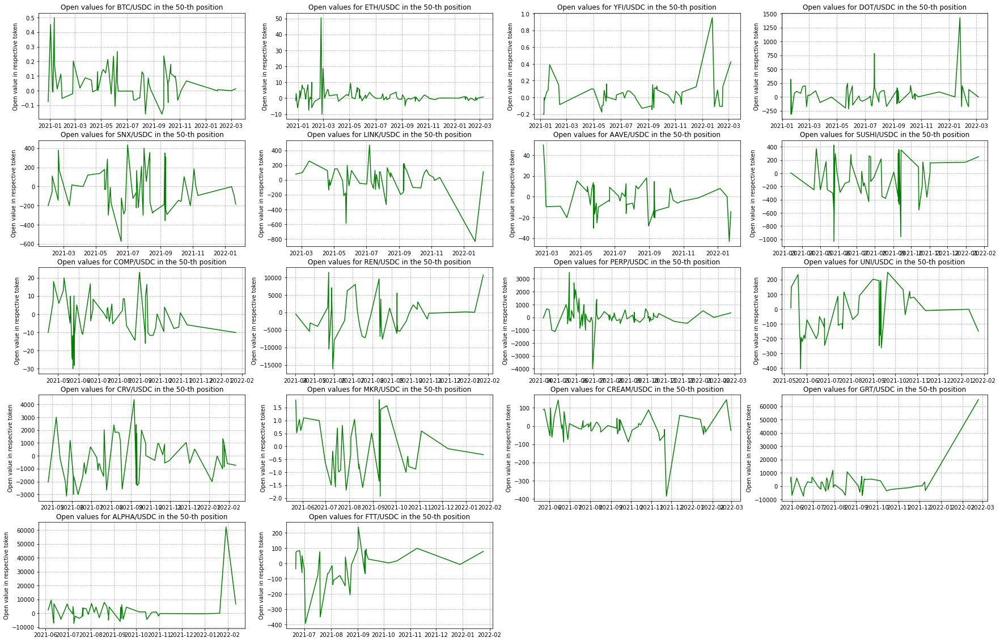

In [26]:
plt.figure(figsize=(30, 20))
index = 0

for amm_name in opens_closes_positions_df['amm_name'].unique():
    ax = plt.subplot(5, 4, index+1)
    ax.plot(opens_closes_positions_df[(opens_closes_positions_df['amm_name'] == amm_name) &
                                      (opens_closes_positions_df['open_id'] == 50) &
                                      (opens_closes_positions_df['exchanged_position_size'] == opens_closes_positions_df['position_size_after'])]['timestamp'], 
            opens_closes_positions_df[(opens_closes_positions_df['amm_name'] == amm_name) &
                                      (opens_closes_positions_df['open_id'] == 50) &
                                      (opens_closes_positions_df['exchanged_position_size'] == opens_closes_positions_df['position_size_after'])]['exchanged_position_size'], 
            color='g')
    ax.set_title('Open values for ' + amm_name + ' in the 50-th position')
    ax.set_ylabel('Open value in respective token')
    ax.grid(True, linestyle='--')
    index += 1
    
plt.show()

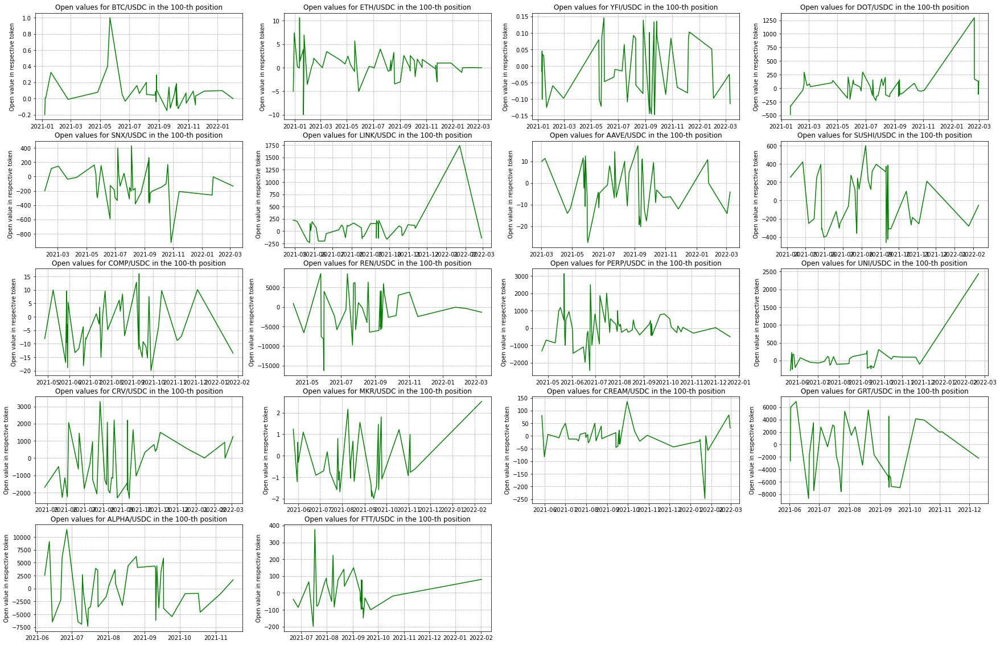

In [27]:
plt.figure(figsize=(30, 20))
index = 0

for amm_name in opens_closes_positions_df['amm_name'].unique():
    ax = plt.subplot(5, 4, index+1)
    ax.plot(opens_closes_positions_df[(opens_closes_positions_df['amm_name'] == amm_name) &
                                      (opens_closes_positions_df['open_id'] == 100) &
                                      (opens_closes_positions_df['exchanged_position_size'] == opens_closes_positions_df['position_size_after'])]['timestamp'], 
            opens_closes_positions_df[(opens_closes_positions_df['amm_name'] == amm_name) &
                                      (opens_closes_positions_df['open_id'] == 100) &
                                      (opens_closes_positions_df['exchanged_position_size'] == opens_closes_positions_df['position_size_after'])]['exchanged_position_size'], 
            color='g')
    ax.set_title('Open values for ' + amm_name + ' in the 100-th position')
    ax.set_ylabel('Open value in respective token')
    ax.grid(True, linestyle='--')
    index += 1
    
plt.show()

# Margin of 1-st, 10-th, 50-th and 100-th opens

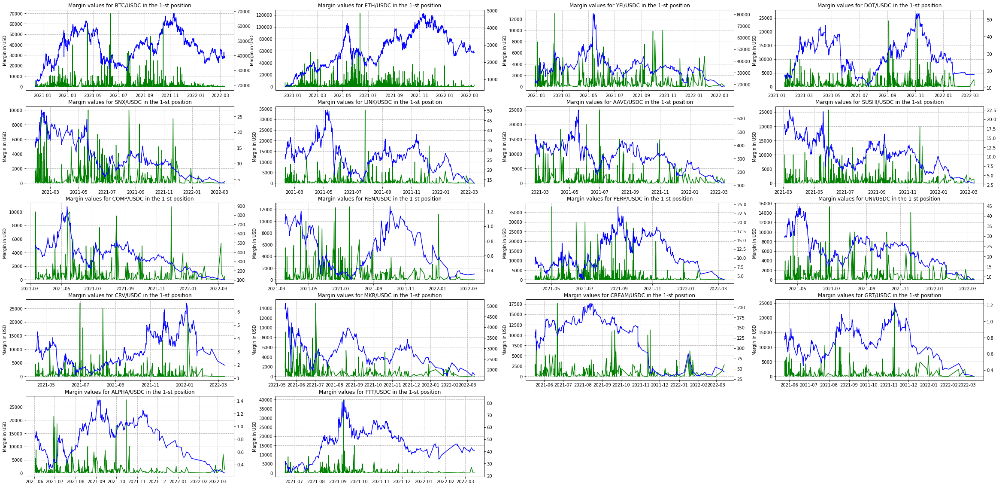

In [28]:
plt.figure(figsize=(40, 20))
index = 0

for amm_name in opens_closes_positions_df['amm_name'].unique():
    ax = plt.subplot(5, 4, index+1)
    ax2 = ax.twinx()
    
    ax.plot(opens_closes_positions_df[(opens_closes_positions_df['amm_name'] == amm_name) &
                                      (opens_closes_positions_df['open_id'] == 1) &
                                      (opens_closes_positions_df['exchanged_position_size'] == opens_closes_positions_df['position_size_after'])]['timestamp'], 
            opens_closes_positions_df[(opens_closes_positions_df['amm_name'] == amm_name) &
                                      (opens_closes_positions_df['open_id'] == 1) &
                                      (opens_closes_positions_df['exchanged_position_size'] == opens_closes_positions_df['position_size_after'])]['margin'], 
            color='g')
    ax2.plot(opens_closes_positions_df[(opens_closes_positions_df['amm_name'] == amm_name) &
                                      (opens_closes_positions_df['open_id'] == 1) &
                                      (opens_closes_positions_df['exchanged_position_size'] == opens_closes_positions_df['position_size_after'])]['timestamp'], 
            opens_closes_positions_df[(opens_closes_positions_df['amm_name'] == amm_name) &
                                      (opens_closes_positions_df['open_id'] == 1) &
                                      (opens_closes_positions_df['exchanged_position_size'] == opens_closes_positions_df['position_size_after'])]['spot_price'], 
            color='b')
    ax.set_title('Margin values for ' + amm_name + ' in the 1-st position')
    ax.set_ylabel('Margin in USD')
    ax.grid(True, linestyle='--')
    index += 1
    
plt.show()

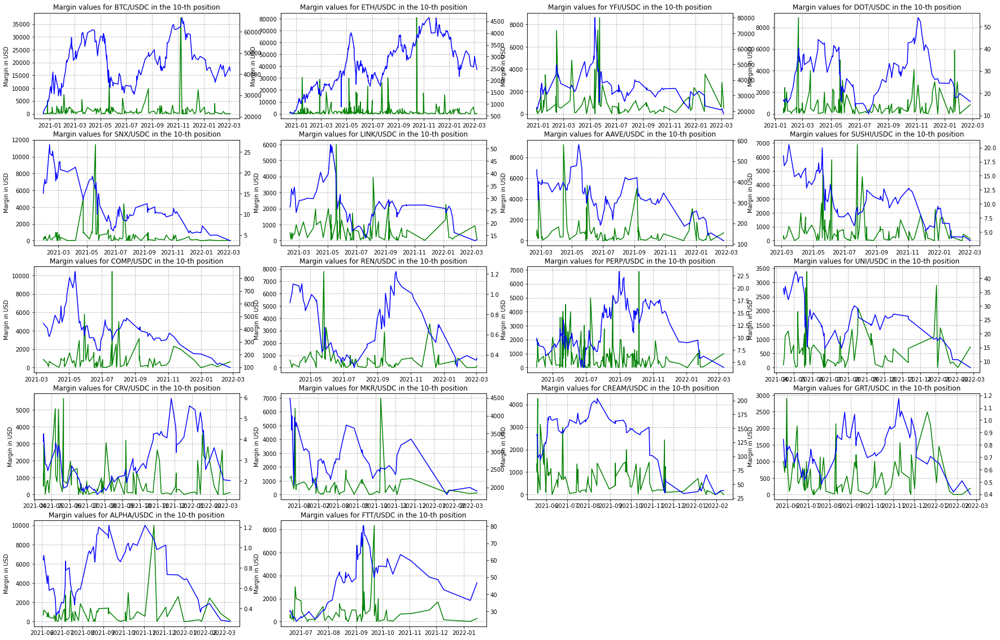

In [29]:
plt.figure(figsize=(30, 20))
index = 0

for amm_name in opens_closes_positions_df['amm_name'].unique():
    ax = plt.subplot(5, 4, index+1)
    ax2 = ax.twinx()
    
    ax.plot(opens_closes_positions_df[(opens_closes_positions_df['amm_name'] == amm_name) &
                                      (opens_closes_positions_df['open_id'] == 10) &
                                      (opens_closes_positions_df['exchanged_position_size'] == 
                                                           opens_closes_positions_df['position_size_after'])]['timestamp'], 
            opens_closes_positions_df[(opens_closes_positions_df['amm_name'] == amm_name) &
                                      (opens_closes_positions_df['open_id'] == 10) &
                                      (opens_closes_positions_df['exchanged_position_size'] == 
                                                           opens_closes_positions_df['position_size_after'])]['margin'], 
            color='g')
    ax2.plot(opens_closes_positions_df[(opens_closes_positions_df['amm_name'] == amm_name) &
                                      (opens_closes_positions_df['open_id'] == 10) &
                                      (opens_closes_positions_df['exchanged_position_size'] == 
                                                           opens_closes_positions_df['position_size_after'])]['timestamp'], 
            opens_closes_positions_df[(opens_closes_positions_df['amm_name'] == amm_name) &
                                      (opens_closes_positions_df['open_id'] == 10) &
                                      (opens_closes_positions_df['exchanged_position_size'] == 
                                                           opens_closes_positions_df['position_size_after'])]['spot_price'], 
            color='b')
    ax.set_title('Margin values for ' + amm_name + ' in the 10-th position')
    ax.set_ylabel('Margin in USD')
    ax.grid(True, linestyle='--')
    index += 1
    
plt.show()

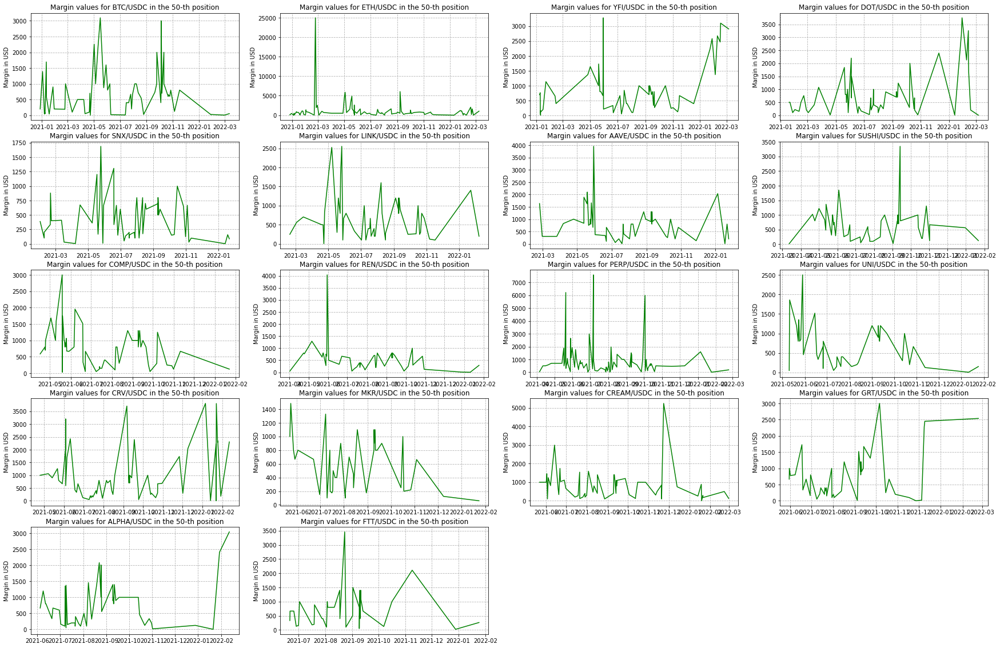

In [30]:
plt.figure(figsize=(30, 20))
index = 0

for amm_name in opens_closes_positions_df['amm_name'].unique():
    ax = plt.subplot(5, 4, index+1)
    ax.plot(opens_closes_positions_df[(opens_closes_positions_df['amm_name'] == amm_name) &
                                      (opens_closes_positions_df['open_id'] == 50) &
                                      (opens_closes_positions_df['exchanged_position_size'] == 
                                                           opens_closes_positions_df['position_size_after'])]['timestamp'], 
            opens_closes_positions_df[(opens_closes_positions_df['amm_name'] == amm_name) &
                                      (opens_closes_positions_df['open_id'] == 50) &
                                      (opens_closes_positions_df['exchanged_position_size'] == 
                                                           opens_closes_positions_df['position_size_after'])]['margin'], 
            color='g')
    ax.set_title('Margin values for ' + amm_name + ' in the 50-th position')
    ax.set_ylabel('Margin in USD')
    ax.grid(True, linestyle='--')
    index += 1
    
plt.show()

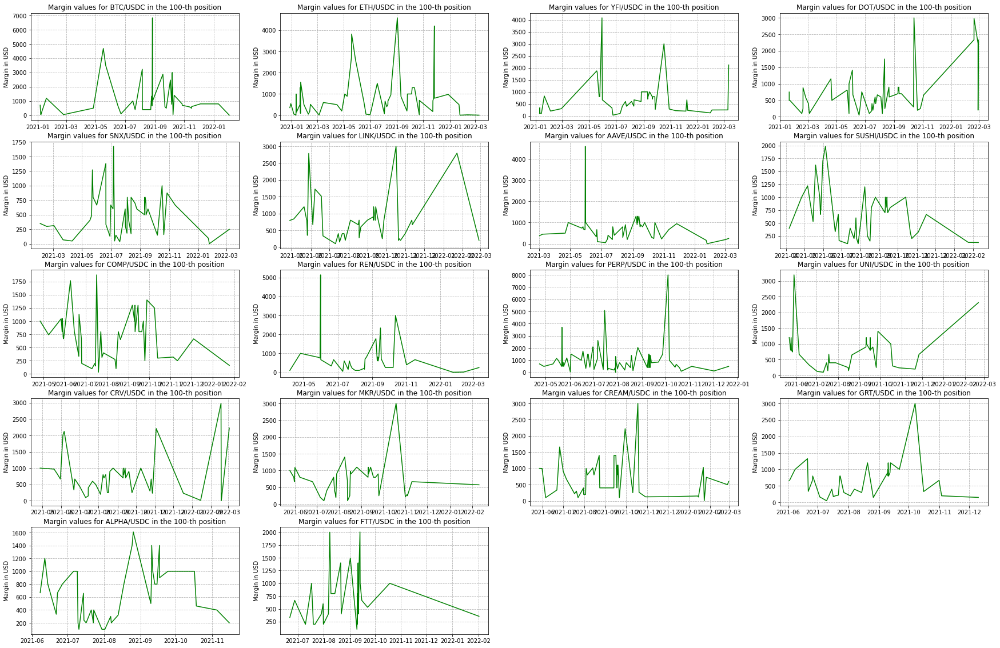

In [31]:
plt.figure(figsize=(30, 20))
index = 0

for amm_name in opens_closes_positions_df['amm_name'].unique():
    ax = plt.subplot(5, 4, index+1)
    ax.plot(opens_closes_positions_df[(opens_closes_positions_df['amm_name'] == amm_name) &
                                      (opens_closes_positions_df['open_id'] == 100) &
                                      (opens_closes_positions_df['exchanged_position_size'] == 
                                                           opens_closes_positions_df['position_size_after'])]['timestamp'], 
            opens_closes_positions_df[(opens_closes_positions_df['amm_name'] == amm_name) &
                                      (opens_closes_positions_df['open_id'] == 100) &
                                      (opens_closes_positions_df['exchanged_position_size'] == 
                                                           opens_closes_positions_df['position_size_after'])]['margin'], 
            color='g')
    ax.set_title('Margin values for ' + amm_name + ' in the 100-th position')
    ax.set_ylabel('Margin in USD')
    ax.grid(True, linestyle='--')
    index += 1
    
plt.show()

# Position notional (capitalization) for opens

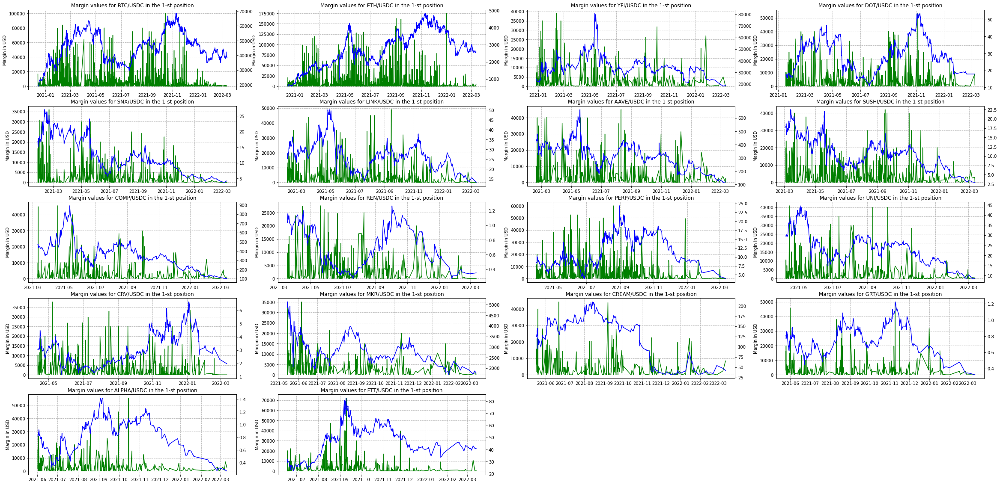

In [32]:
plt.figure(figsize=(40, 20))
index = 0

for amm_name in opens_closes_positions_df['amm_name'].unique():
    ax = plt.subplot(5, 4, index+1)
    ax2 = ax.twinx()
    
    ax.plot(opens_closes_positions_df[(opens_closes_positions_df['amm_name'] == amm_name) &
                                      (opens_closes_positions_df['open_id'] == 1) &
                                      (opens_closes_positions_df['exchanged_position_size'] == opens_closes_positions_df['position_size_after'])]['timestamp'], 
            opens_closes_positions_df[(opens_closes_positions_df['amm_name'] == amm_name) &
                                      (opens_closes_positions_df['open_id'] == 1) &
                                      (opens_closes_positions_df['exchanged_position_size'] == opens_closes_positions_df['position_size_after'])]['position_notional'], 
            color='g')
    ax2.plot(opens_closes_positions_df[(opens_closes_positions_df['amm_name'] == amm_name) &
                                      (opens_closes_positions_df['open_id'] == 1) &
                                      (opens_closes_positions_df['exchanged_position_size'] == opens_closes_positions_df['position_size_after'])]['timestamp'], 
            opens_closes_positions_df[(opens_closes_positions_df['amm_name'] == amm_name) &
                                      (opens_closes_positions_df['open_id'] == 1) &
                                      (opens_closes_positions_df['exchanged_position_size'] == opens_closes_positions_df['position_size_after'])]['spot_price'], 
            color='b')
    ax.set_title('Margin values for ' + amm_name + ' in the 1-st position')
    ax.set_ylabel('Margin in USD')
    ax.grid(True, linestyle='--')
    index += 1
    
plt.show()

# Experiments to get margin to position notional

In [33]:
opens_closes_positions_df.head(10)

,Unnamed: 0,id,trader,amm,margin,position_notional,exchanged_position_size,fee,position_size_after,realized_pnl,unrealized_pnl_after,bad_debt,liquidation_penalty,spot_price,funding_payment,block_number,timestamp,amm_name,open_close_id,open_id
0,0,0x06d54c4ad4bfff493051ef548557f4fa0c76fb2dd6787fd665f3b9bf001ad88e-20,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0x0f346e19f01471c02485df1758cfd3d624e399b4,5552.445854,16657.337561,0.872710,16.657338,0.872710,0.000000e+00,0.000000,0.0,0.0,19120.287600,0.0,13508290,2020-12-14 03:16:05,BTC/USDC,0.0,1
0,1,0x0e824c5f4e27ba5f29b8791e25e76e732783b25bba4498c380a37efc42478077-6,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0x8d22f1a9dce724d8c1b4c688d75f17a2fe2d32df,6816.007869,20448.023608,34.908392,20.448024,34.908392,0.000000e+00,0.000000,0.0,0.0,586.786590,0.0,13508290,2020-12-14 03:16:05,ETH/USDC,1.0,1
1,2,0xeebbca404104c295253184426d13273fcafcb78867736833c355a2db2eebc747-13,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0x8d22f1a9dce724d8c1b4c688d75f17a2fe2d32df,13632.015738,20448.023608,34.786745,20.448024,69.695137,0.000000e+00,71.380545,0.0,0.0,588.836755,0.0,13508290,2020-12-14 03:16:05,ETH/USDC,0.0,1
1,3,0xe9d804889de5a27a356777a588d6c018e55fa1cae61c6265f11595c4c293a697-6,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0x0f346e19f01471c02485df1758cfd3d624e399b4,11114.600000,16686.462439,0.871187,16.686462,1.743896,0.000000e+00,58.249669,0.0,0.0,19187.208607,0.0,13508954,2020-12-14 04:11:45,BTC/USDC,0.0,1
2,4,0xea81e16520eae51395b4627365487daa2013df876ef3e38254579d1d149b17fd-6,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0x0f346e19f01471c02485df1758cfd3d624e399b4,0.000000,33343.800000,-1.743896,33.343800,0.000000,-1.782200e-14,0.000000,0.0,0.0,19053.600000,0.0,13509011,2020-12-14 04:16:30,BTC/USDC,0.0,1
2,5,0xacc1edbc8c6244635a5e6f7a67e99d6f9f567fa47bf24d4ea61d1d920de0f95d-8,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0x8d22f1a9dce724d8c1b4c688d75f17a2fe2d32df,0.000000,40896.047215,-69.695137,40.896047,0.000000,-4.520000e-16,0.000000,0.0,0.0,584.740000,0.0,13509018,2020-12-14 04:17:05,ETH/USDC,0.0,1
113657,6,0x7a26308fc414ace63350fa320b61c6bfd1321a1cc64c9a653810b944b2a38c6c-6,0x9602686bf53a17baed60c48ba34ed4219a532381,0x8d22f1a9dce724d8c1b4c688d75f17a2fe2d32df,292.443111,2924.431108,5.000000,2.924431,5.000000,0.000000e+00,0.000000,0.0,0.0,585.032480,0.0,13510672,2020-12-14 06:35:40,ETH/USDC,2.0,1
113658,7,0x3073ca99194a8f16e4565aea94785bda61d368c90b7a3fc8ecec94bf6fa9a589-6,0x9602686bf53a17baed60c48ba34ed4219a532381,0x8d22f1a9dce724d8c1b4c688d75f17a2fe2d32df,305.021444,125.783336,0.215000,0.125783,5.215000,0.000000e+00,0.062884,0.0,0.0,585.045061,0.0,13510682,2020-12-14 06:36:30,ETH/USDC,0.0,1
98865,8,0x42afbde94de9d330f1aca627f58cb42be12b4c87a30f7d9a95b7030bff25000f-6,0x9602686bf53a17baed60c48ba34ed4219a532381,0x0f346e19f01471c02485df1758cfd3d624e399b4,170.209060,1702.090596,0.089316,1.702091,0.089316,0.000000e+00,0.000000,0.0,0.0,19060.408971,0.0,13510698,2020-12-14 06:37:55,BTC/USDC,3.0,1
113675,9,0xad4366897b9de6fddd1b415fb14c69f9533b58354f6716e6c07e8edcf5003d5f-6,0x5bea7caa02142ba59885466757e1112819731f09,0x8d22f1a9dce724d8c1b4c688d75f17a2fe2d32df,234.041435,1170.207174,2.000000,1.170207,2.000000,0.000000e+00,0.000000,0.0,0.0,585.162118,0.0,13510752,2020-12-14 06:42:25,ETH/USDC,4.0,1


In [34]:
opens_closes_positions_df[(opens_closes_positions_df["margin"] < 0.000005) &
                          (opens_closes_positions_df['margin'] > 0)]

,Unnamed: 0,id,trader,amm,margin,position_notional,exchanged_position_size,fee,position_size_after,realized_pnl,unrealized_pnl_after,bad_debt,liquidation_penalty,spot_price,funding_payment,block_number,timestamp,amm_name,open_close_id,open_id
99366,237,0x380f2be969aac92479a4f7915e5632ed81278346bdc37620ce9d44a53f8a8b6d-7,0x7a0cb9bb153a9891d1852875af9bcb65e716038e,0x0f346e19f01471c02485df1758cfd3d624e399b4,3.909000e-15,4.887175e+02,-0.025000,4.887175e-01,-1.000000e-18,3.877194e+00,0.0,0.0,0.0,19547.709967,0.032558,13536477,2020-12-15 19:51:30,BTC/USDC,0.0,1
116429,4986,0x5b4a9fc6d2db50476cd319a8cd4b970e42913f0b22a9007ab94c6f28580b71de-7,0x6b14d6ae8c2136ea2cdd44204e6689cbcc2d938e,0x8d22f1a9dce724d8c1b4c688d75f17a2fe2d32df,1.462000e-15,9.900000e+00,-0.017009,9.900000e-03,-3.000000e-18,-9.140000e-16,0.0,0.0,0.0,582.030253,0.000000,13680020,2020-12-24 11:29:45,ETH/USDC,0.0,24
103304,9506,0x22f11d61ed109bd24fdf7f63ad4de932f4734e0de0dc4cf2de0917fc8a815ff3-7,0xce7e86725fa9ef1f5cd0f266bf5d48af1686f445,0x0f346e19f01471c02485df1758cfd3d624e399b4,1.640400e-14,2.760000e+01,-0.000999,2.760000e-02,-1.000000e-18,-1.640400e-14,0.0,0.0,0.0,27636.742836,0.002007,13728023,2020-12-27 07:01:30,BTC/USDC,0.0,1
100292,23609,0xe7187d8eeec5fc33173156361d20be5785d25e083972c04ec44fd1382865a7d8-19,0xaa3893081e382258b9ffd8bdb2f67443c4f966bf,0x0f346e19f01471c02485df1758cfd3d624e399b4,2.812000e-15,3.000000e+03,-0.104456,3.000000e+00,-1.000000e-18,-8.438000e-15,0.0,0.0,0.0,28712.847469,0.000000,13792435,2020-12-31 02:27:25,BTC/USDC,0.0,2
318012,225851,0xfa59202017e74fff90d5fc9d6387fb898e93de65e7c0acd073de9dd2e5938c36-9,0xf1bf34e46ecf465591b7a7fa9635e4c583174fa3,0x0f346e19f01471c02485df1758cfd3d624e399b4,1.000000e-14,1.000000e-14,0.000000,1.000000e-17,0.000000e+00,0.000000e+00,0.0,0.0,0.0,36615.469122,0.000000,14114168,2021-01-19 19:14:50,BTC/USDC,11910.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284239,9175930,0x15e7dc51072e8fb39c8a25fb1a9883092591e87ad71e8c23e98ecc505ae3f06f-12,0x081380cfd42c99f581706c6b889631d3b56d3333,0x838b322610bd99a449091d3bf3fba60d794909a9,3.691379e-06,3.499990e+03,80.000003,3.499990e+00,8.434365e-08,-1.100000e-17,0.0,0.0,0.0,43.765935,0.000000,20926368,2022-03-04 01:02:55,FTT/USDC,0.0,47
290564,9179362,0xa775b1b9a53e1ad730394b350f14bcd63f7b6d68c342d06f4b7c74dc6fe30dff-31,0xf18a81675ada96852c1e58dd16452b52ff9d198b,0xab08ff2c726f2f333802630ee19f4146385cc343,3.421016e-06,4.499994e+03,1850.300003,4.499994e+00,1.405788e-06,-2.000000e-18,0.0,0.0,0.0,2.433521,0.000000,20930519,2022-03-04 07:08:35,CRV/USDC,0.0,4
636632,9239922,0xd65c681eb9465f184239e4d0b29b2d6dbb97f538b0974309f036e1f11e6c2253-19,0xfd4bd3416270f2a432797b82ca919e6fbc37ebc5,0x6de775aabeeede8efdb1a257198d56a3ac18c2fd,1.311535e-10,2.779816e+03,-172.776127,2.779816e+00,-8.156187e-12,-1.362415e+02,0.0,0.0,0.0,16.080253,0.000000,20990933,2022-03-07 19:51:25,DOT/USDC,0.0,89
923696,9266604,0x053f659b3fe935a7ae539e238333f5ebb06fd3fb0d2f4569ef8159d8606a7255-24,0x6ea70c3ee5d8a11c448df348fc15779b843b7d3d,0x8d22f1a9dce724d8c1b4c688d75f17a2fe2d32df,5.398000e-15,5.399502e+03,-2.000000,5.399502e+00,-5.000000e-18,1.340666e+02,0.0,0.0,0.0,2699.170867,0.000000,21014124,2022-03-09 04:08:55,ETH/USDC,0.0,1


Calculating ```margin to position capitalization``` coefficient, ```capitalization to margin``` coefficient and ```custom capitalization to margin``` coefficient

In [35]:
opens_closes_positions_df['margin_to_cap_coef'] = opens_closes_positions_df['margin'] / opens_closes_positions_df['position_notional']
opens_closes_positions_df['cap_to_margin_coef'] = opens_closes_positions_df['position_notional'] / opens_closes_positions_df['margin']
opens_closes_positions_df['recalc_cap_to_margin_coef'] = (opens_closes_positions_df['spot_price'] * opens_closes_positions_df['position_size_after'] /
                                                         opens_closes_positions_df['margin'])

There are some strange changes, where position capitalization is equal to 0

In [36]:
opens_closes_positions_df[opens_closes_positions_df['position_notional'] == 0]

,Unnamed: 0,id,trader,amm,margin,position_notional,exchanged_position_size,fee,position_size_after,realized_pnl,unrealized_pnl_after,bad_debt,liquidation_penalty,spot_price,funding_payment,block_number,timestamp,amm_name,open_close_id,open_id,margin_to_cap_coef,cap_to_margin_coef,recalc_cap_to_margin_coef
383710,756719,0x45a851df00422c9f68fff69f7b6110433f118b8012ba5d0e31f4d428e0dc72be-5,0xd31f3e0796572b6c164a24450388c652c0ad4d17,0x0f346e19f01471c02485df1758cfd3d624e399b4,1.000000e-01,0.0,0.0,0.0,4.312131e-06,0.0,-8.202845e-04,0.0,0.0,46190.555834,0.000000e+00,14768099,2021-02-28 01:39:25,BTC/USDC,0.0,1,inf,0.0,1.991797
383801,758945,0xa76f19db2b03b8d1f763216e3b54404cf27803362acc8fa7f2568fde45491101-5,0xde1294f153047ab7ae6ccd018f89500f1043991d,0x0f346e19f01471c02485df1758cfd3d624e399b4,1.000000e-02,0.0,0.0,0.0,4.462316e-07,0.0,-3.230100e-14,0.0,0.0,44819.770779,0.000000e+00,14770493,2021-02-28 05:15:30,BTC/USDC,0.0,1,inf,0.0,2.000000
383802,758969,0x896677022b3c16a32c008d0091a8f5688fbb1764b390d23580a116b151bd1cc9-51,0xde1294f153047ab7ae6ccd018f89500f1043991d,0x0f346e19f01471c02485df1758cfd3d624e399b4,1.000000e-02,0.0,0.0,0.0,4.462316e-07,0.0,1.344156e-04,0.0,0.0,45120.994675,0.000000e+00,14770505,2021-02-28 05:16:35,BTC/USDC,0.0,1,inf,0.0,2.013442
460735,6396479,0xe392620f84ddf640d7ee2cd653fb82de93b2dac9e731a490a28de942ea16bab6-13,0x529408a6962bae6ca5328874d633738116b89b05,0x0f346e19f01471c02485df1758cfd3d624e399b4,3.558300e-14,0.0,0.0,0.0,-1.000000e-18,0.0,-3.136700e-14,0.0,0.0,67783.170819,8.340000e-16,18974801,2021-11-09 02:32:30,BTC/USDC,0.0,1,inf,0.0,-1.904931
460736,6396486,0x8c10240b9f5fca6278203e21a2126ff6bbb188ce1a94fbe3783e57b49c93525b-8,0x529408a6962bae6ca5328874d633738116b89b05,0x0f346e19f01471c02485df1758cfd3d624e399b4,3.558300e-14,0.0,0.0,0.0,-1.000000e-18,0.0,-3.135500e-14,0.0,0.0,67771.015347,0.000000e+00,18974803,2021-11-09 02:32:40,BTC/USDC,0.0,1,inf,0.0,-1.904590
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
465489,6435323,0xd4d2fa2eb2bf633ad66f82de675b1a253582f7cb788126376df8e4dfddb2c329-3,0x529408a6962bae6ca5328874d633738116b89b05,0x0f346e19f01471c02485df1758cfd3d624e399b4,3.558600e-14,0.0,0.0,0.0,-1.000000e-18,0.0,-3.142800e-14,0.0,0.0,67844.905137,0.000000e+00,19003791,2021-11-10 19:24:20,BTC/USDC,0.0,1,inf,0.0,-1.906506
465490,6435329,0xcd392e36c79f295b675cfadc2db43f142fa4476c6b69db18c5a43cbfb8e025ae-18,0x529408a6962bae6ca5328874d633738116b89b05,0x0f346e19f01471c02485df1758cfd3d624e399b4,3.558600e-14,0.0,0.0,0.0,-1.000000e-18,0.0,-3.142800e-14,0.0,0.0,67844.905137,0.000000e+00,19003792,2021-11-10 19:24:25,BTC/USDC,0.0,1,inf,0.0,-1.906506
465491,6435340,0x8e0a109b1c0525e954681564cac6fef5bc94a0220efda352e5d1f09abfbbc24f-25,0x529408a6962bae6ca5328874d633738116b89b05,0x0f346e19f01471c02485df1758cfd3d624e399b4,3.558600e-14,0.0,0.0,0.0,-1.000000e-18,0.0,-3.142800e-14,0.0,0.0,67844.905137,0.000000e+00,19003794,2021-11-10 19:24:37,BTC/USDC,0.0,1,inf,0.0,-1.906506
465492,6435348,0x433dc5146ada4224d836a9758cd04ed6ec3709bad715c2e25bd17534978f4578-19,0x529408a6962bae6ca5328874d633738116b89b05,0x0f346e19f01471c02485df1758cfd3d624e399b4,3.558600e-14,0.0,0.0,0.0,-1.000000e-18,0.0,-3.142800e-14,0.0,0.0,67844.905137,0.000000e+00,19003797,2021-11-10 19:24:50,BTC/USDC,0.0,1,inf,0.0,-1.906506


Coefficients are shifted to the left, meaning that position capitalization is smaller or equal to margin

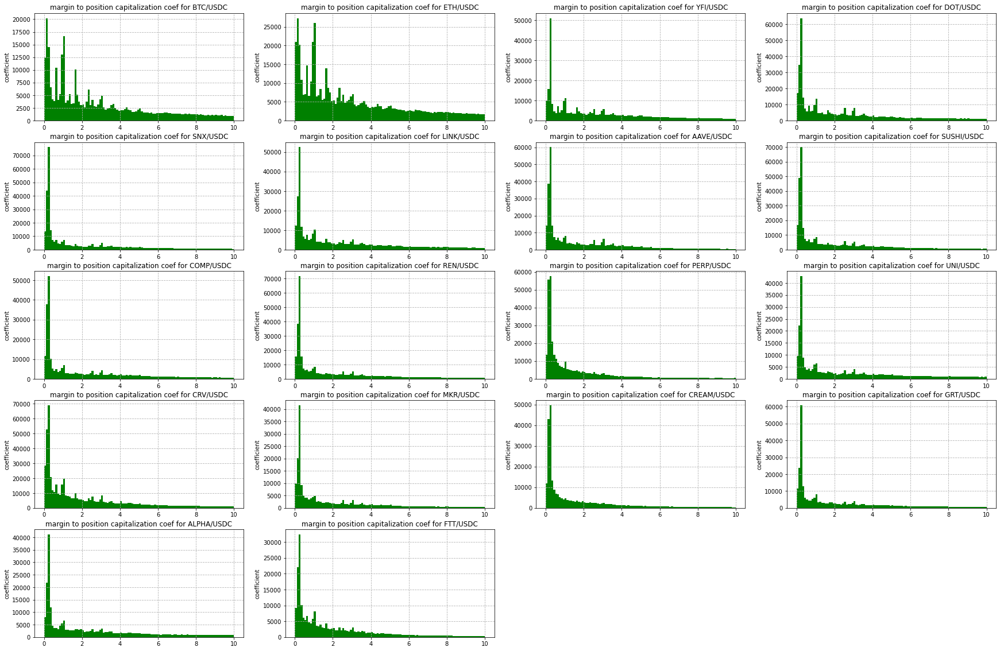

In [37]:
plt.figure(figsize=(30, 20))
index = 0

for amm_name in opens_closes_positions_df['amm_name'].unique():
    ax = plt.subplot(5, 4, index+1)
    reviewed_section = opens_closes_positions_df[(opens_closes_positions_df['amm_name'] == amm_name) &
                                              (opens_closes_positions_df['margin'] != 0) &
                                              (opens_closes_positions_df['position_notional'] != 0) &
                                              (opens_closes_positions_df['margin_to_cap_coef'] > -10) &
                                              (opens_closes_positions_df['margin_to_cap_coef'] < 10)]
    
    ax.hist(reviewed_section['margin_to_cap_coef'], 
            color='g', bins=100)
    ax.set_title('margin to position capitalization coef for ' + amm_name)
    ax.set_ylabel('coefficient')
    ax.grid(True, linestyle='--')
    index += 1
    
plt.show()

In [38]:
print("there are " + str(len(opens_closes_positions_df[opens_closes_positions_df['cap_to_margin_coef'] > 10])) +
     " records with strange leverage conform position notional and margin, while in recalculations case there are " +
     str(len(opens_closes_positions_df[opens_closes_positions_df['recalc_cap_to_margin_coef'] > 10])) + " values with strange" +
     " leverage")

there are 1515842 records with strange leverage conform position notional and margin, while in recalculations case there are 515339 values with strange leverage


In [39]:
last_opens_list = []

for amm in opens_closes_positions_df['amm_name'].unique():
    amm_position_changes_df = opens_closes_positions_df[opens_closes_positions_df['amm_name'] == amm]
    
    print('taken ' + amm)
    cur_iteration = 0
    amm_total_iterations = len(amm_position_changes_df['trader'].unique())
    for trader in amm_position_changes_df['trader'].unique():
        amm_trader_position_story = amm_position_changes_df[amm_position_changes_df['trader'] == trader]
        last_open_id = amm_trader_position_story['open_id'].max()
        last_opens_list.append(amm_trader_position_story[amm_trader_position_story['open_id'] == last_open_id])
        
        cur_iteration += 1
        print("finished iteration " + str(cur_iteration) + ' out of ' + str(amm_total_iterations))
        
last_opens_df = pd.concat(last_opens_list)
last_opens_df

taken BTC/USDC
finished iteration 1 out of 5023
finished iteration 2 out of 5023
finished iteration 3 out of 5023
finished iteration 4 out of 5023
finished iteration 5 out of 5023
finished iteration 6 out of 5023
finished iteration 7 out of 5023
finished iteration 8 out of 5023
finished iteration 9 out of 5023
finished iteration 10 out of 5023
finished iteration 11 out of 5023
finished iteration 12 out of 5023
finished iteration 13 out of 5023
finished iteration 14 out of 5023
finished iteration 15 out of 5023
finished iteration 16 out of 5023
finished iteration 17 out of 5023
finished iteration 18 out of 5023
finished iteration 19 out of 5023
finished iteration 20 out of 5023
finished iteration 21 out of 5023
finished iteration 22 out of 5023
finished iteration 23 out of 5023
finished iteration 24 out of 5023
finished iteration 25 out of 5023
finished iteration 26 out of 5023
finished iteration 27 out of 5023
finished iteration 28 out of 5023
finished iteration 29 out of 5023
finished

finished iteration 239 out of 5023
finished iteration 240 out of 5023
finished iteration 241 out of 5023
finished iteration 242 out of 5023
finished iteration 243 out of 5023
finished iteration 244 out of 5023
finished iteration 245 out of 5023
finished iteration 246 out of 5023
finished iteration 247 out of 5023
finished iteration 248 out of 5023
finished iteration 249 out of 5023
finished iteration 250 out of 5023
finished iteration 251 out of 5023
finished iteration 252 out of 5023
finished iteration 253 out of 5023
finished iteration 254 out of 5023
finished iteration 255 out of 5023
finished iteration 256 out of 5023
finished iteration 257 out of 5023
finished iteration 258 out of 5023
finished iteration 259 out of 5023
finished iteration 260 out of 5023
finished iteration 261 out of 5023
finished iteration 262 out of 5023
finished iteration 263 out of 5023
finished iteration 264 out of 5023
finished iteration 265 out of 5023
finished iteration 266 out of 5023
finished iteration 2

finished iteration 474 out of 5023
finished iteration 475 out of 5023
finished iteration 476 out of 5023
finished iteration 477 out of 5023
finished iteration 478 out of 5023
finished iteration 479 out of 5023
finished iteration 480 out of 5023
finished iteration 481 out of 5023
finished iteration 482 out of 5023
finished iteration 483 out of 5023
finished iteration 484 out of 5023
finished iteration 485 out of 5023
finished iteration 486 out of 5023
finished iteration 487 out of 5023
finished iteration 488 out of 5023
finished iteration 489 out of 5023
finished iteration 490 out of 5023
finished iteration 491 out of 5023
finished iteration 492 out of 5023
finished iteration 493 out of 5023
finished iteration 494 out of 5023
finished iteration 495 out of 5023
finished iteration 496 out of 5023
finished iteration 497 out of 5023
finished iteration 498 out of 5023
finished iteration 499 out of 5023
finished iteration 500 out of 5023
finished iteration 501 out of 5023
finished iteration 5

finished iteration 713 out of 5023
finished iteration 714 out of 5023
finished iteration 715 out of 5023
finished iteration 716 out of 5023
finished iteration 717 out of 5023
finished iteration 718 out of 5023
finished iteration 719 out of 5023
finished iteration 720 out of 5023
finished iteration 721 out of 5023
finished iteration 722 out of 5023
finished iteration 723 out of 5023
finished iteration 724 out of 5023
finished iteration 725 out of 5023
finished iteration 726 out of 5023
finished iteration 727 out of 5023
finished iteration 728 out of 5023
finished iteration 729 out of 5023
finished iteration 730 out of 5023
finished iteration 731 out of 5023
finished iteration 732 out of 5023
finished iteration 733 out of 5023
finished iteration 734 out of 5023
finished iteration 735 out of 5023
finished iteration 736 out of 5023
finished iteration 737 out of 5023
finished iteration 738 out of 5023
finished iteration 739 out of 5023
finished iteration 740 out of 5023
finished iteration 7

finished iteration 953 out of 5023
finished iteration 954 out of 5023
finished iteration 955 out of 5023
finished iteration 956 out of 5023
finished iteration 957 out of 5023
finished iteration 958 out of 5023
finished iteration 959 out of 5023
finished iteration 960 out of 5023
finished iteration 961 out of 5023
finished iteration 962 out of 5023
finished iteration 963 out of 5023
finished iteration 964 out of 5023
finished iteration 965 out of 5023
finished iteration 966 out of 5023
finished iteration 967 out of 5023
finished iteration 968 out of 5023
finished iteration 969 out of 5023
finished iteration 970 out of 5023
finished iteration 971 out of 5023
finished iteration 972 out of 5023
finished iteration 973 out of 5023
finished iteration 974 out of 5023
finished iteration 975 out of 5023
finished iteration 976 out of 5023
finished iteration 977 out of 5023
finished iteration 978 out of 5023
finished iteration 979 out of 5023
finished iteration 980 out of 5023
finished iteration 9

finished iteration 1188 out of 5023
finished iteration 1189 out of 5023
finished iteration 1190 out of 5023
finished iteration 1191 out of 5023
finished iteration 1192 out of 5023
finished iteration 1193 out of 5023
finished iteration 1194 out of 5023
finished iteration 1195 out of 5023
finished iteration 1196 out of 5023
finished iteration 1197 out of 5023
finished iteration 1198 out of 5023
finished iteration 1199 out of 5023
finished iteration 1200 out of 5023
finished iteration 1201 out of 5023
finished iteration 1202 out of 5023
finished iteration 1203 out of 5023
finished iteration 1204 out of 5023
finished iteration 1205 out of 5023
finished iteration 1206 out of 5023
finished iteration 1207 out of 5023
finished iteration 1208 out of 5023
finished iteration 1209 out of 5023
finished iteration 1210 out of 5023
finished iteration 1211 out of 5023
finished iteration 1212 out of 5023
finished iteration 1213 out of 5023
finished iteration 1214 out of 5023
finished iteration 1215 out 

finished iteration 1422 out of 5023
finished iteration 1423 out of 5023
finished iteration 1424 out of 5023
finished iteration 1425 out of 5023
finished iteration 1426 out of 5023
finished iteration 1427 out of 5023
finished iteration 1428 out of 5023
finished iteration 1429 out of 5023
finished iteration 1430 out of 5023
finished iteration 1431 out of 5023
finished iteration 1432 out of 5023
finished iteration 1433 out of 5023
finished iteration 1434 out of 5023
finished iteration 1435 out of 5023
finished iteration 1436 out of 5023
finished iteration 1437 out of 5023
finished iteration 1438 out of 5023
finished iteration 1439 out of 5023
finished iteration 1440 out of 5023
finished iteration 1441 out of 5023
finished iteration 1442 out of 5023
finished iteration 1443 out of 5023
finished iteration 1444 out of 5023
finished iteration 1445 out of 5023
finished iteration 1446 out of 5023
finished iteration 1447 out of 5023
finished iteration 1448 out of 5023
finished iteration 1449 out 

finished iteration 1650 out of 5023
finished iteration 1651 out of 5023
finished iteration 1652 out of 5023
finished iteration 1653 out of 5023
finished iteration 1654 out of 5023
finished iteration 1655 out of 5023
finished iteration 1656 out of 5023
finished iteration 1657 out of 5023
finished iteration 1658 out of 5023
finished iteration 1659 out of 5023
finished iteration 1660 out of 5023
finished iteration 1661 out of 5023
finished iteration 1662 out of 5023
finished iteration 1663 out of 5023
finished iteration 1664 out of 5023
finished iteration 1665 out of 5023
finished iteration 1666 out of 5023
finished iteration 1667 out of 5023
finished iteration 1668 out of 5023
finished iteration 1669 out of 5023
finished iteration 1670 out of 5023
finished iteration 1671 out of 5023
finished iteration 1672 out of 5023
finished iteration 1673 out of 5023
finished iteration 1674 out of 5023
finished iteration 1675 out of 5023
finished iteration 1676 out of 5023
finished iteration 1677 out 

finished iteration 1882 out of 5023
finished iteration 1883 out of 5023
finished iteration 1884 out of 5023
finished iteration 1885 out of 5023
finished iteration 1886 out of 5023
finished iteration 1887 out of 5023
finished iteration 1888 out of 5023
finished iteration 1889 out of 5023
finished iteration 1890 out of 5023
finished iteration 1891 out of 5023
finished iteration 1892 out of 5023
finished iteration 1893 out of 5023
finished iteration 1894 out of 5023
finished iteration 1895 out of 5023
finished iteration 1896 out of 5023
finished iteration 1897 out of 5023
finished iteration 1898 out of 5023
finished iteration 1899 out of 5023
finished iteration 1900 out of 5023
finished iteration 1901 out of 5023
finished iteration 1902 out of 5023
finished iteration 1903 out of 5023
finished iteration 1904 out of 5023
finished iteration 1905 out of 5023
finished iteration 1906 out of 5023
finished iteration 1907 out of 5023
finished iteration 1908 out of 5023
finished iteration 1909 out 

finished iteration 2114 out of 5023
finished iteration 2115 out of 5023
finished iteration 2116 out of 5023
finished iteration 2117 out of 5023
finished iteration 2118 out of 5023
finished iteration 2119 out of 5023
finished iteration 2120 out of 5023
finished iteration 2121 out of 5023
finished iteration 2122 out of 5023
finished iteration 2123 out of 5023
finished iteration 2124 out of 5023
finished iteration 2125 out of 5023
finished iteration 2126 out of 5023
finished iteration 2127 out of 5023
finished iteration 2128 out of 5023
finished iteration 2129 out of 5023
finished iteration 2130 out of 5023
finished iteration 2131 out of 5023
finished iteration 2132 out of 5023
finished iteration 2133 out of 5023
finished iteration 2134 out of 5023
finished iteration 2135 out of 5023
finished iteration 2136 out of 5023
finished iteration 2137 out of 5023
finished iteration 2138 out of 5023
finished iteration 2139 out of 5023
finished iteration 2140 out of 5023
finished iteration 2141 out 

finished iteration 2350 out of 5023
finished iteration 2351 out of 5023
finished iteration 2352 out of 5023
finished iteration 2353 out of 5023
finished iteration 2354 out of 5023
finished iteration 2355 out of 5023
finished iteration 2356 out of 5023
finished iteration 2357 out of 5023
finished iteration 2358 out of 5023
finished iteration 2359 out of 5023
finished iteration 2360 out of 5023
finished iteration 2361 out of 5023
finished iteration 2362 out of 5023
finished iteration 2363 out of 5023
finished iteration 2364 out of 5023
finished iteration 2365 out of 5023
finished iteration 2366 out of 5023
finished iteration 2367 out of 5023
finished iteration 2368 out of 5023
finished iteration 2369 out of 5023
finished iteration 2370 out of 5023
finished iteration 2371 out of 5023
finished iteration 2372 out of 5023
finished iteration 2373 out of 5023
finished iteration 2374 out of 5023
finished iteration 2375 out of 5023
finished iteration 2376 out of 5023
finished iteration 2377 out 

finished iteration 2583 out of 5023
finished iteration 2584 out of 5023
finished iteration 2585 out of 5023
finished iteration 2586 out of 5023
finished iteration 2587 out of 5023
finished iteration 2588 out of 5023
finished iteration 2589 out of 5023
finished iteration 2590 out of 5023
finished iteration 2591 out of 5023
finished iteration 2592 out of 5023
finished iteration 2593 out of 5023
finished iteration 2594 out of 5023
finished iteration 2595 out of 5023
finished iteration 2596 out of 5023
finished iteration 2597 out of 5023
finished iteration 2598 out of 5023
finished iteration 2599 out of 5023
finished iteration 2600 out of 5023
finished iteration 2601 out of 5023
finished iteration 2602 out of 5023
finished iteration 2603 out of 5023
finished iteration 2604 out of 5023
finished iteration 2605 out of 5023
finished iteration 2606 out of 5023
finished iteration 2607 out of 5023
finished iteration 2608 out of 5023
finished iteration 2609 out of 5023
finished iteration 2610 out 

finished iteration 2816 out of 5023
finished iteration 2817 out of 5023
finished iteration 2818 out of 5023
finished iteration 2819 out of 5023
finished iteration 2820 out of 5023
finished iteration 2821 out of 5023
finished iteration 2822 out of 5023
finished iteration 2823 out of 5023
finished iteration 2824 out of 5023
finished iteration 2825 out of 5023
finished iteration 2826 out of 5023
finished iteration 2827 out of 5023
finished iteration 2828 out of 5023
finished iteration 2829 out of 5023
finished iteration 2830 out of 5023
finished iteration 2831 out of 5023
finished iteration 2832 out of 5023
finished iteration 2833 out of 5023
finished iteration 2834 out of 5023
finished iteration 2835 out of 5023
finished iteration 2836 out of 5023
finished iteration 2837 out of 5023
finished iteration 2838 out of 5023
finished iteration 2839 out of 5023
finished iteration 2840 out of 5023
finished iteration 2841 out of 5023
finished iteration 2842 out of 5023
finished iteration 2843 out 

finished iteration 3048 out of 5023
finished iteration 3049 out of 5023
finished iteration 3050 out of 5023
finished iteration 3051 out of 5023
finished iteration 3052 out of 5023
finished iteration 3053 out of 5023
finished iteration 3054 out of 5023
finished iteration 3055 out of 5023
finished iteration 3056 out of 5023
finished iteration 3057 out of 5023
finished iteration 3058 out of 5023
finished iteration 3059 out of 5023
finished iteration 3060 out of 5023
finished iteration 3061 out of 5023
finished iteration 3062 out of 5023
finished iteration 3063 out of 5023
finished iteration 3064 out of 5023
finished iteration 3065 out of 5023
finished iteration 3066 out of 5023
finished iteration 3067 out of 5023
finished iteration 3068 out of 5023
finished iteration 3069 out of 5023
finished iteration 3070 out of 5023
finished iteration 3071 out of 5023
finished iteration 3072 out of 5023
finished iteration 3073 out of 5023
finished iteration 3074 out of 5023
finished iteration 3075 out 

finished iteration 3280 out of 5023
finished iteration 3281 out of 5023
finished iteration 3282 out of 5023
finished iteration 3283 out of 5023
finished iteration 3284 out of 5023
finished iteration 3285 out of 5023
finished iteration 3286 out of 5023
finished iteration 3287 out of 5023
finished iteration 3288 out of 5023
finished iteration 3289 out of 5023
finished iteration 3290 out of 5023
finished iteration 3291 out of 5023
finished iteration 3292 out of 5023
finished iteration 3293 out of 5023
finished iteration 3294 out of 5023
finished iteration 3295 out of 5023
finished iteration 3296 out of 5023
finished iteration 3297 out of 5023
finished iteration 3298 out of 5023
finished iteration 3299 out of 5023
finished iteration 3300 out of 5023
finished iteration 3301 out of 5023
finished iteration 3302 out of 5023
finished iteration 3303 out of 5023
finished iteration 3304 out of 5023
finished iteration 3305 out of 5023
finished iteration 3306 out of 5023
finished iteration 3307 out 

finished iteration 3510 out of 5023
finished iteration 3511 out of 5023
finished iteration 3512 out of 5023
finished iteration 3513 out of 5023
finished iteration 3514 out of 5023
finished iteration 3515 out of 5023
finished iteration 3516 out of 5023
finished iteration 3517 out of 5023
finished iteration 3518 out of 5023
finished iteration 3519 out of 5023
finished iteration 3520 out of 5023
finished iteration 3521 out of 5023
finished iteration 3522 out of 5023
finished iteration 3523 out of 5023
finished iteration 3524 out of 5023
finished iteration 3525 out of 5023
finished iteration 3526 out of 5023
finished iteration 3527 out of 5023
finished iteration 3528 out of 5023
finished iteration 3529 out of 5023
finished iteration 3530 out of 5023
finished iteration 3531 out of 5023
finished iteration 3532 out of 5023
finished iteration 3533 out of 5023
finished iteration 3534 out of 5023
finished iteration 3535 out of 5023
finished iteration 3536 out of 5023
finished iteration 3537 out 

finished iteration 3745 out of 5023
finished iteration 3746 out of 5023
finished iteration 3747 out of 5023
finished iteration 3748 out of 5023
finished iteration 3749 out of 5023
finished iteration 3750 out of 5023
finished iteration 3751 out of 5023
finished iteration 3752 out of 5023
finished iteration 3753 out of 5023
finished iteration 3754 out of 5023
finished iteration 3755 out of 5023
finished iteration 3756 out of 5023
finished iteration 3757 out of 5023
finished iteration 3758 out of 5023
finished iteration 3759 out of 5023
finished iteration 3760 out of 5023
finished iteration 3761 out of 5023
finished iteration 3762 out of 5023
finished iteration 3763 out of 5023
finished iteration 3764 out of 5023
finished iteration 3765 out of 5023
finished iteration 3766 out of 5023
finished iteration 3767 out of 5023
finished iteration 3768 out of 5023
finished iteration 3769 out of 5023
finished iteration 3770 out of 5023
finished iteration 3771 out of 5023
finished iteration 3772 out 

finished iteration 3977 out of 5023
finished iteration 3978 out of 5023
finished iteration 3979 out of 5023
finished iteration 3980 out of 5023
finished iteration 3981 out of 5023
finished iteration 3982 out of 5023
finished iteration 3983 out of 5023
finished iteration 3984 out of 5023
finished iteration 3985 out of 5023
finished iteration 3986 out of 5023
finished iteration 3987 out of 5023
finished iteration 3988 out of 5023
finished iteration 3989 out of 5023
finished iteration 3990 out of 5023
finished iteration 3991 out of 5023
finished iteration 3992 out of 5023
finished iteration 3993 out of 5023
finished iteration 3994 out of 5023
finished iteration 3995 out of 5023
finished iteration 3996 out of 5023
finished iteration 3997 out of 5023
finished iteration 3998 out of 5023
finished iteration 3999 out of 5023
finished iteration 4000 out of 5023
finished iteration 4001 out of 5023
finished iteration 4002 out of 5023
finished iteration 4003 out of 5023
finished iteration 4004 out 

finished iteration 4212 out of 5023
finished iteration 4213 out of 5023
finished iteration 4214 out of 5023
finished iteration 4215 out of 5023
finished iteration 4216 out of 5023
finished iteration 4217 out of 5023
finished iteration 4218 out of 5023
finished iteration 4219 out of 5023
finished iteration 4220 out of 5023
finished iteration 4221 out of 5023
finished iteration 4222 out of 5023
finished iteration 4223 out of 5023
finished iteration 4224 out of 5023
finished iteration 4225 out of 5023
finished iteration 4226 out of 5023
finished iteration 4227 out of 5023
finished iteration 4228 out of 5023
finished iteration 4229 out of 5023
finished iteration 4230 out of 5023
finished iteration 4231 out of 5023
finished iteration 4232 out of 5023
finished iteration 4233 out of 5023
finished iteration 4234 out of 5023
finished iteration 4235 out of 5023
finished iteration 4236 out of 5023
finished iteration 4237 out of 5023
finished iteration 4238 out of 5023
finished iteration 4239 out 

finished iteration 4443 out of 5023
finished iteration 4444 out of 5023
finished iteration 4445 out of 5023
finished iteration 4446 out of 5023
finished iteration 4447 out of 5023
finished iteration 4448 out of 5023
finished iteration 4449 out of 5023
finished iteration 4450 out of 5023
finished iteration 4451 out of 5023
finished iteration 4452 out of 5023
finished iteration 4453 out of 5023
finished iteration 4454 out of 5023
finished iteration 4455 out of 5023
finished iteration 4456 out of 5023
finished iteration 4457 out of 5023
finished iteration 4458 out of 5023
finished iteration 4459 out of 5023
finished iteration 4460 out of 5023
finished iteration 4461 out of 5023
finished iteration 4462 out of 5023
finished iteration 4463 out of 5023
finished iteration 4464 out of 5023
finished iteration 4465 out of 5023
finished iteration 4466 out of 5023
finished iteration 4467 out of 5023
finished iteration 4468 out of 5023
finished iteration 4469 out of 5023
finished iteration 4470 out 

finished iteration 4679 out of 5023
finished iteration 4680 out of 5023
finished iteration 4681 out of 5023
finished iteration 4682 out of 5023
finished iteration 4683 out of 5023
finished iteration 4684 out of 5023
finished iteration 4685 out of 5023
finished iteration 4686 out of 5023
finished iteration 4687 out of 5023
finished iteration 4688 out of 5023
finished iteration 4689 out of 5023
finished iteration 4690 out of 5023
finished iteration 4691 out of 5023
finished iteration 4692 out of 5023
finished iteration 4693 out of 5023
finished iteration 4694 out of 5023
finished iteration 4695 out of 5023
finished iteration 4696 out of 5023
finished iteration 4697 out of 5023
finished iteration 4698 out of 5023
finished iteration 4699 out of 5023
finished iteration 4700 out of 5023
finished iteration 4701 out of 5023
finished iteration 4702 out of 5023
finished iteration 4703 out of 5023
finished iteration 4704 out of 5023
finished iteration 4705 out of 5023
finished iteration 4706 out 

finished iteration 4909 out of 5023
finished iteration 4910 out of 5023
finished iteration 4911 out of 5023
finished iteration 4912 out of 5023
finished iteration 4913 out of 5023
finished iteration 4914 out of 5023
finished iteration 4915 out of 5023
finished iteration 4916 out of 5023
finished iteration 4917 out of 5023
finished iteration 4918 out of 5023
finished iteration 4919 out of 5023
finished iteration 4920 out of 5023
finished iteration 4921 out of 5023
finished iteration 4922 out of 5023
finished iteration 4923 out of 5023
finished iteration 4924 out of 5023
finished iteration 4925 out of 5023
finished iteration 4926 out of 5023
finished iteration 4927 out of 5023
finished iteration 4928 out of 5023
finished iteration 4929 out of 5023
finished iteration 4930 out of 5023
finished iteration 4931 out of 5023
finished iteration 4932 out of 5023
finished iteration 4933 out of 5023
finished iteration 4934 out of 5023
finished iteration 4935 out of 5023
finished iteration 4936 out 

finished iteration 120 out of 4154
finished iteration 121 out of 4154
finished iteration 122 out of 4154
finished iteration 123 out of 4154
finished iteration 124 out of 4154
finished iteration 125 out of 4154
finished iteration 126 out of 4154
finished iteration 127 out of 4154
finished iteration 128 out of 4154
finished iteration 129 out of 4154
finished iteration 130 out of 4154
finished iteration 131 out of 4154
finished iteration 132 out of 4154
finished iteration 133 out of 4154
finished iteration 134 out of 4154
finished iteration 135 out of 4154
finished iteration 136 out of 4154
finished iteration 137 out of 4154
finished iteration 138 out of 4154
finished iteration 139 out of 4154
finished iteration 140 out of 4154
finished iteration 141 out of 4154
finished iteration 142 out of 4154
finished iteration 143 out of 4154
finished iteration 144 out of 4154
finished iteration 145 out of 4154
finished iteration 146 out of 4154
finished iteration 147 out of 4154
finished iteration 1

finished iteration 355 out of 4154
finished iteration 356 out of 4154
finished iteration 357 out of 4154
finished iteration 358 out of 4154
finished iteration 359 out of 4154
finished iteration 360 out of 4154
finished iteration 361 out of 4154
finished iteration 362 out of 4154
finished iteration 363 out of 4154
finished iteration 364 out of 4154
finished iteration 365 out of 4154
finished iteration 366 out of 4154
finished iteration 367 out of 4154
finished iteration 368 out of 4154
finished iteration 369 out of 4154
finished iteration 370 out of 4154
finished iteration 371 out of 4154
finished iteration 372 out of 4154
finished iteration 373 out of 4154
finished iteration 374 out of 4154
finished iteration 375 out of 4154
finished iteration 376 out of 4154
finished iteration 377 out of 4154
finished iteration 378 out of 4154
finished iteration 379 out of 4154
finished iteration 380 out of 4154
finished iteration 381 out of 4154
finished iteration 382 out of 4154
finished iteration 3

finished iteration 590 out of 4154
finished iteration 591 out of 4154
finished iteration 592 out of 4154
finished iteration 593 out of 4154
finished iteration 594 out of 4154
finished iteration 595 out of 4154
finished iteration 596 out of 4154
finished iteration 597 out of 4154
finished iteration 598 out of 4154
finished iteration 599 out of 4154
finished iteration 600 out of 4154
finished iteration 601 out of 4154
finished iteration 602 out of 4154
finished iteration 603 out of 4154
finished iteration 604 out of 4154
finished iteration 605 out of 4154
finished iteration 606 out of 4154
finished iteration 607 out of 4154
finished iteration 608 out of 4154
finished iteration 609 out of 4154
finished iteration 610 out of 4154
finished iteration 611 out of 4154
finished iteration 612 out of 4154
finished iteration 613 out of 4154
finished iteration 614 out of 4154
finished iteration 615 out of 4154
finished iteration 616 out of 4154
finished iteration 617 out of 4154
finished iteration 6

finished iteration 825 out of 4154
finished iteration 826 out of 4154
finished iteration 827 out of 4154
finished iteration 828 out of 4154
finished iteration 829 out of 4154
finished iteration 830 out of 4154
finished iteration 831 out of 4154
finished iteration 832 out of 4154
finished iteration 833 out of 4154
finished iteration 834 out of 4154
finished iteration 835 out of 4154
finished iteration 836 out of 4154
finished iteration 837 out of 4154
finished iteration 838 out of 4154
finished iteration 839 out of 4154
finished iteration 840 out of 4154
finished iteration 841 out of 4154
finished iteration 842 out of 4154
finished iteration 843 out of 4154
finished iteration 844 out of 4154
finished iteration 845 out of 4154
finished iteration 846 out of 4154
finished iteration 847 out of 4154
finished iteration 848 out of 4154
finished iteration 849 out of 4154
finished iteration 850 out of 4154
finished iteration 851 out of 4154
finished iteration 852 out of 4154
finished iteration 8

finished iteration 1060 out of 4154
finished iteration 1061 out of 4154
finished iteration 1062 out of 4154
finished iteration 1063 out of 4154
finished iteration 1064 out of 4154
finished iteration 1065 out of 4154
finished iteration 1066 out of 4154
finished iteration 1067 out of 4154
finished iteration 1068 out of 4154
finished iteration 1069 out of 4154
finished iteration 1070 out of 4154
finished iteration 1071 out of 4154
finished iteration 1072 out of 4154
finished iteration 1073 out of 4154
finished iteration 1074 out of 4154
finished iteration 1075 out of 4154
finished iteration 1076 out of 4154
finished iteration 1077 out of 4154
finished iteration 1078 out of 4154
finished iteration 1079 out of 4154
finished iteration 1080 out of 4154
finished iteration 1081 out of 4154
finished iteration 1082 out of 4154
finished iteration 1083 out of 4154
finished iteration 1084 out of 4154
finished iteration 1085 out of 4154
finished iteration 1086 out of 4154
finished iteration 1087 out 

finished iteration 1288 out of 4154
finished iteration 1289 out of 4154
finished iteration 1290 out of 4154
finished iteration 1291 out of 4154
finished iteration 1292 out of 4154
finished iteration 1293 out of 4154
finished iteration 1294 out of 4154
finished iteration 1295 out of 4154
finished iteration 1296 out of 4154
finished iteration 1297 out of 4154
finished iteration 1298 out of 4154
finished iteration 1299 out of 4154
finished iteration 1300 out of 4154
finished iteration 1301 out of 4154
finished iteration 1302 out of 4154
finished iteration 1303 out of 4154
finished iteration 1304 out of 4154
finished iteration 1305 out of 4154
finished iteration 1306 out of 4154
finished iteration 1307 out of 4154
finished iteration 1308 out of 4154
finished iteration 1309 out of 4154
finished iteration 1310 out of 4154
finished iteration 1311 out of 4154
finished iteration 1312 out of 4154
finished iteration 1313 out of 4154
finished iteration 1314 out of 4154
finished iteration 1315 out 

finished iteration 1517 out of 4154
finished iteration 1518 out of 4154
finished iteration 1519 out of 4154
finished iteration 1520 out of 4154
finished iteration 1521 out of 4154
finished iteration 1522 out of 4154
finished iteration 1523 out of 4154
finished iteration 1524 out of 4154
finished iteration 1525 out of 4154
finished iteration 1526 out of 4154
finished iteration 1527 out of 4154
finished iteration 1528 out of 4154
finished iteration 1529 out of 4154
finished iteration 1530 out of 4154
finished iteration 1531 out of 4154
finished iteration 1532 out of 4154
finished iteration 1533 out of 4154
finished iteration 1534 out of 4154
finished iteration 1535 out of 4154
finished iteration 1536 out of 4154
finished iteration 1537 out of 4154
finished iteration 1538 out of 4154
finished iteration 1539 out of 4154
finished iteration 1540 out of 4154
finished iteration 1541 out of 4154
finished iteration 1542 out of 4154
finished iteration 1543 out of 4154
finished iteration 1544 out 

finished iteration 1746 out of 4154
finished iteration 1747 out of 4154
finished iteration 1748 out of 4154
finished iteration 1749 out of 4154
finished iteration 1750 out of 4154
finished iteration 1751 out of 4154
finished iteration 1752 out of 4154
finished iteration 1753 out of 4154
finished iteration 1754 out of 4154
finished iteration 1755 out of 4154
finished iteration 1756 out of 4154
finished iteration 1757 out of 4154
finished iteration 1758 out of 4154
finished iteration 1759 out of 4154
finished iteration 1760 out of 4154
finished iteration 1761 out of 4154
finished iteration 1762 out of 4154
finished iteration 1763 out of 4154
finished iteration 1764 out of 4154
finished iteration 1765 out of 4154
finished iteration 1766 out of 4154
finished iteration 1767 out of 4154
finished iteration 1768 out of 4154
finished iteration 1769 out of 4154
finished iteration 1770 out of 4154
finished iteration 1771 out of 4154
finished iteration 1772 out of 4154
finished iteration 1773 out 

finished iteration 1976 out of 4154
finished iteration 1977 out of 4154
finished iteration 1978 out of 4154
finished iteration 1979 out of 4154
finished iteration 1980 out of 4154
finished iteration 1981 out of 4154
finished iteration 1982 out of 4154
finished iteration 1983 out of 4154
finished iteration 1984 out of 4154
finished iteration 1985 out of 4154
finished iteration 1986 out of 4154
finished iteration 1987 out of 4154
finished iteration 1988 out of 4154
finished iteration 1989 out of 4154
finished iteration 1990 out of 4154
finished iteration 1991 out of 4154
finished iteration 1992 out of 4154
finished iteration 1993 out of 4154
finished iteration 1994 out of 4154
finished iteration 1995 out of 4154
finished iteration 1996 out of 4154
finished iteration 1997 out of 4154
finished iteration 1998 out of 4154
finished iteration 1999 out of 4154
finished iteration 2000 out of 4154
finished iteration 2001 out of 4154
finished iteration 2002 out of 4154
finished iteration 2003 out 

finished iteration 2204 out of 4154
finished iteration 2205 out of 4154
finished iteration 2206 out of 4154
finished iteration 2207 out of 4154
finished iteration 2208 out of 4154
finished iteration 2209 out of 4154
finished iteration 2210 out of 4154
finished iteration 2211 out of 4154
finished iteration 2212 out of 4154
finished iteration 2213 out of 4154
finished iteration 2214 out of 4154
finished iteration 2215 out of 4154
finished iteration 2216 out of 4154
finished iteration 2217 out of 4154
finished iteration 2218 out of 4154
finished iteration 2219 out of 4154
finished iteration 2220 out of 4154
finished iteration 2221 out of 4154
finished iteration 2222 out of 4154
finished iteration 2223 out of 4154
finished iteration 2224 out of 4154
finished iteration 2225 out of 4154
finished iteration 2226 out of 4154
finished iteration 2227 out of 4154
finished iteration 2228 out of 4154
finished iteration 2229 out of 4154
finished iteration 2230 out of 4154
finished iteration 2231 out 

finished iteration 2433 out of 4154
finished iteration 2434 out of 4154
finished iteration 2435 out of 4154
finished iteration 2436 out of 4154
finished iteration 2437 out of 4154
finished iteration 2438 out of 4154
finished iteration 2439 out of 4154
finished iteration 2440 out of 4154
finished iteration 2441 out of 4154
finished iteration 2442 out of 4154
finished iteration 2443 out of 4154
finished iteration 2444 out of 4154
finished iteration 2445 out of 4154
finished iteration 2446 out of 4154
finished iteration 2447 out of 4154
finished iteration 2448 out of 4154
finished iteration 2449 out of 4154
finished iteration 2450 out of 4154
finished iteration 2451 out of 4154
finished iteration 2452 out of 4154
finished iteration 2453 out of 4154
finished iteration 2454 out of 4154
finished iteration 2455 out of 4154
finished iteration 2456 out of 4154
finished iteration 2457 out of 4154
finished iteration 2458 out of 4154
finished iteration 2459 out of 4154
finished iteration 2460 out 

finished iteration 2662 out of 4154
finished iteration 2663 out of 4154
finished iteration 2664 out of 4154
finished iteration 2665 out of 4154
finished iteration 2666 out of 4154
finished iteration 2667 out of 4154
finished iteration 2668 out of 4154
finished iteration 2669 out of 4154
finished iteration 2670 out of 4154
finished iteration 2671 out of 4154
finished iteration 2672 out of 4154
finished iteration 2673 out of 4154
finished iteration 2674 out of 4154
finished iteration 2675 out of 4154
finished iteration 2676 out of 4154
finished iteration 2677 out of 4154
finished iteration 2678 out of 4154
finished iteration 2679 out of 4154
finished iteration 2680 out of 4154
finished iteration 2681 out of 4154
finished iteration 2682 out of 4154
finished iteration 2683 out of 4154
finished iteration 2684 out of 4154
finished iteration 2685 out of 4154
finished iteration 2686 out of 4154
finished iteration 2687 out of 4154
finished iteration 2688 out of 4154
finished iteration 2689 out 

finished iteration 2892 out of 4154
finished iteration 2893 out of 4154
finished iteration 2894 out of 4154
finished iteration 2895 out of 4154
finished iteration 2896 out of 4154
finished iteration 2897 out of 4154
finished iteration 2898 out of 4154
finished iteration 2899 out of 4154
finished iteration 2900 out of 4154
finished iteration 2901 out of 4154
finished iteration 2902 out of 4154
finished iteration 2903 out of 4154
finished iteration 2904 out of 4154
finished iteration 2905 out of 4154
finished iteration 2906 out of 4154
finished iteration 2907 out of 4154
finished iteration 2908 out of 4154
finished iteration 2909 out of 4154
finished iteration 2910 out of 4154
finished iteration 2911 out of 4154
finished iteration 2912 out of 4154
finished iteration 2913 out of 4154
finished iteration 2914 out of 4154
finished iteration 2915 out of 4154
finished iteration 2916 out of 4154
finished iteration 2917 out of 4154
finished iteration 2918 out of 4154
finished iteration 2919 out 

finished iteration 3122 out of 4154
finished iteration 3123 out of 4154
finished iteration 3124 out of 4154
finished iteration 3125 out of 4154
finished iteration 3126 out of 4154
finished iteration 3127 out of 4154
finished iteration 3128 out of 4154
finished iteration 3129 out of 4154
finished iteration 3130 out of 4154
finished iteration 3131 out of 4154
finished iteration 3132 out of 4154
finished iteration 3133 out of 4154
finished iteration 3134 out of 4154
finished iteration 3135 out of 4154
finished iteration 3136 out of 4154
finished iteration 3137 out of 4154
finished iteration 3138 out of 4154
finished iteration 3139 out of 4154
finished iteration 3140 out of 4154
finished iteration 3141 out of 4154
finished iteration 3142 out of 4154
finished iteration 3143 out of 4154
finished iteration 3144 out of 4154
finished iteration 3145 out of 4154
finished iteration 3146 out of 4154
finished iteration 3147 out of 4154
finished iteration 3148 out of 4154
finished iteration 3149 out 

finished iteration 3351 out of 4154
finished iteration 3352 out of 4154
finished iteration 3353 out of 4154
finished iteration 3354 out of 4154
finished iteration 3355 out of 4154
finished iteration 3356 out of 4154
finished iteration 3357 out of 4154
finished iteration 3358 out of 4154
finished iteration 3359 out of 4154
finished iteration 3360 out of 4154
finished iteration 3361 out of 4154
finished iteration 3362 out of 4154
finished iteration 3363 out of 4154
finished iteration 3364 out of 4154
finished iteration 3365 out of 4154
finished iteration 3366 out of 4154
finished iteration 3367 out of 4154
finished iteration 3368 out of 4154
finished iteration 3369 out of 4154
finished iteration 3370 out of 4154
finished iteration 3371 out of 4154
finished iteration 3372 out of 4154
finished iteration 3373 out of 4154
finished iteration 3374 out of 4154
finished iteration 3375 out of 4154
finished iteration 3376 out of 4154
finished iteration 3377 out of 4154
finished iteration 3378 out 

finished iteration 3580 out of 4154
finished iteration 3581 out of 4154
finished iteration 3582 out of 4154
finished iteration 3583 out of 4154
finished iteration 3584 out of 4154
finished iteration 3585 out of 4154
finished iteration 3586 out of 4154
finished iteration 3587 out of 4154
finished iteration 3588 out of 4154
finished iteration 3589 out of 4154
finished iteration 3590 out of 4154
finished iteration 3591 out of 4154
finished iteration 3592 out of 4154
finished iteration 3593 out of 4154
finished iteration 3594 out of 4154
finished iteration 3595 out of 4154
finished iteration 3596 out of 4154
finished iteration 3597 out of 4154
finished iteration 3598 out of 4154
finished iteration 3599 out of 4154
finished iteration 3600 out of 4154
finished iteration 3601 out of 4154
finished iteration 3602 out of 4154
finished iteration 3603 out of 4154
finished iteration 3604 out of 4154
finished iteration 3605 out of 4154
finished iteration 3606 out of 4154
finished iteration 3607 out 

finished iteration 3809 out of 4154
finished iteration 3810 out of 4154
finished iteration 3811 out of 4154
finished iteration 3812 out of 4154
finished iteration 3813 out of 4154
finished iteration 3814 out of 4154
finished iteration 3815 out of 4154
finished iteration 3816 out of 4154
finished iteration 3817 out of 4154
finished iteration 3818 out of 4154
finished iteration 3819 out of 4154
finished iteration 3820 out of 4154
finished iteration 3821 out of 4154
finished iteration 3822 out of 4154
finished iteration 3823 out of 4154
finished iteration 3824 out of 4154
finished iteration 3825 out of 4154
finished iteration 3826 out of 4154
finished iteration 3827 out of 4154
finished iteration 3828 out of 4154
finished iteration 3829 out of 4154
finished iteration 3830 out of 4154
finished iteration 3831 out of 4154
finished iteration 3832 out of 4154
finished iteration 3833 out of 4154
finished iteration 3834 out of 4154
finished iteration 3835 out of 4154
finished iteration 3836 out 

finished iteration 4039 out of 4154
finished iteration 4040 out of 4154
finished iteration 4041 out of 4154
finished iteration 4042 out of 4154
finished iteration 4043 out of 4154
finished iteration 4044 out of 4154
finished iteration 4045 out of 4154
finished iteration 4046 out of 4154
finished iteration 4047 out of 4154
finished iteration 4048 out of 4154
finished iteration 4049 out of 4154
finished iteration 4050 out of 4154
finished iteration 4051 out of 4154
finished iteration 4052 out of 4154
finished iteration 4053 out of 4154
finished iteration 4054 out of 4154
finished iteration 4055 out of 4154
finished iteration 4056 out of 4154
finished iteration 4057 out of 4154
finished iteration 4058 out of 4154
finished iteration 4059 out of 4154
finished iteration 4060 out of 4154
finished iteration 4061 out of 4154
finished iteration 4062 out of 4154
finished iteration 4063 out of 4154
finished iteration 4064 out of 4154
finished iteration 4065 out of 4154
finished iteration 4066 out 

finished iteration 127 out of 531
finished iteration 128 out of 531
finished iteration 129 out of 531
finished iteration 130 out of 531
finished iteration 131 out of 531
finished iteration 132 out of 531
finished iteration 133 out of 531
finished iteration 134 out of 531
finished iteration 135 out of 531
finished iteration 136 out of 531
finished iteration 137 out of 531
finished iteration 138 out of 531
finished iteration 139 out of 531
finished iteration 140 out of 531
finished iteration 141 out of 531
finished iteration 142 out of 531
finished iteration 143 out of 531
finished iteration 144 out of 531
finished iteration 145 out of 531
finished iteration 146 out of 531
finished iteration 147 out of 531
finished iteration 148 out of 531
finished iteration 149 out of 531
finished iteration 150 out of 531
finished iteration 151 out of 531
finished iteration 152 out of 531
finished iteration 153 out of 531
finished iteration 154 out of 531
finished iteration 155 out of 531
finished itera

finished iteration 371 out of 531
finished iteration 372 out of 531
finished iteration 373 out of 531
finished iteration 374 out of 531
finished iteration 375 out of 531
finished iteration 376 out of 531
finished iteration 377 out of 531
finished iteration 378 out of 531
finished iteration 379 out of 531
finished iteration 380 out of 531
finished iteration 381 out of 531
finished iteration 382 out of 531
finished iteration 383 out of 531
finished iteration 384 out of 531
finished iteration 385 out of 531
finished iteration 386 out of 531
finished iteration 387 out of 531
finished iteration 388 out of 531
finished iteration 389 out of 531
finished iteration 390 out of 531
finished iteration 391 out of 531
finished iteration 392 out of 531
finished iteration 393 out of 531
finished iteration 394 out of 531
finished iteration 395 out of 531
finished iteration 396 out of 531
finished iteration 397 out of 531
finished iteration 398 out of 531
finished iteration 399 out of 531
finished itera

finished iteration 85 out of 769
finished iteration 86 out of 769
finished iteration 87 out of 769
finished iteration 88 out of 769
finished iteration 89 out of 769
finished iteration 90 out of 769
finished iteration 91 out of 769
finished iteration 92 out of 769
finished iteration 93 out of 769
finished iteration 94 out of 769
finished iteration 95 out of 769
finished iteration 96 out of 769
finished iteration 97 out of 769
finished iteration 98 out of 769
finished iteration 99 out of 769
finished iteration 100 out of 769
finished iteration 101 out of 769
finished iteration 102 out of 769
finished iteration 103 out of 769
finished iteration 104 out of 769
finished iteration 105 out of 769
finished iteration 106 out of 769
finished iteration 107 out of 769
finished iteration 108 out of 769
finished iteration 109 out of 769
finished iteration 110 out of 769
finished iteration 111 out of 769
finished iteration 112 out of 769
finished iteration 113 out of 769
finished iteration 114 out of

finished iteration 328 out of 769
finished iteration 329 out of 769
finished iteration 330 out of 769
finished iteration 331 out of 769
finished iteration 332 out of 769
finished iteration 333 out of 769
finished iteration 334 out of 769
finished iteration 335 out of 769
finished iteration 336 out of 769
finished iteration 337 out of 769
finished iteration 338 out of 769
finished iteration 339 out of 769
finished iteration 340 out of 769
finished iteration 341 out of 769
finished iteration 342 out of 769
finished iteration 343 out of 769
finished iteration 344 out of 769
finished iteration 345 out of 769
finished iteration 346 out of 769
finished iteration 347 out of 769
finished iteration 348 out of 769
finished iteration 349 out of 769
finished iteration 350 out of 769
finished iteration 351 out of 769
finished iteration 352 out of 769
finished iteration 353 out of 769
finished iteration 354 out of 769
finished iteration 355 out of 769
finished iteration 356 out of 769
finished itera

finished iteration 571 out of 769
finished iteration 572 out of 769
finished iteration 573 out of 769
finished iteration 574 out of 769
finished iteration 575 out of 769
finished iteration 576 out of 769
finished iteration 577 out of 769
finished iteration 578 out of 769
finished iteration 579 out of 769
finished iteration 580 out of 769
finished iteration 581 out of 769
finished iteration 582 out of 769
finished iteration 583 out of 769
finished iteration 584 out of 769
finished iteration 585 out of 769
finished iteration 586 out of 769
finished iteration 587 out of 769
finished iteration 588 out of 769
finished iteration 589 out of 769
finished iteration 590 out of 769
finished iteration 591 out of 769
finished iteration 592 out of 769
finished iteration 593 out of 769
finished iteration 594 out of 769
finished iteration 595 out of 769
finished iteration 596 out of 769
finished iteration 597 out of 769
finished iteration 598 out of 769
finished iteration 599 out of 769
finished itera

finished iteration 50 out of 531
finished iteration 51 out of 531
finished iteration 52 out of 531
finished iteration 53 out of 531
finished iteration 54 out of 531
finished iteration 55 out of 531
finished iteration 56 out of 531
finished iteration 57 out of 531
finished iteration 58 out of 531
finished iteration 59 out of 531
finished iteration 60 out of 531
finished iteration 61 out of 531
finished iteration 62 out of 531
finished iteration 63 out of 531
finished iteration 64 out of 531
finished iteration 65 out of 531
finished iteration 66 out of 531
finished iteration 67 out of 531
finished iteration 68 out of 531
finished iteration 69 out of 531
finished iteration 70 out of 531
finished iteration 71 out of 531
finished iteration 72 out of 531
finished iteration 73 out of 531
finished iteration 74 out of 531
finished iteration 75 out of 531
finished iteration 76 out of 531
finished iteration 77 out of 531
finished iteration 78 out of 531
finished iteration 79 out of 531
finished i

finished iteration 293 out of 531
finished iteration 294 out of 531
finished iteration 295 out of 531
finished iteration 296 out of 531
finished iteration 297 out of 531
finished iteration 298 out of 531
finished iteration 299 out of 531
finished iteration 300 out of 531
finished iteration 301 out of 531
finished iteration 302 out of 531
finished iteration 303 out of 531
finished iteration 304 out of 531
finished iteration 305 out of 531
finished iteration 306 out of 531
finished iteration 307 out of 531
finished iteration 308 out of 531
finished iteration 309 out of 531
finished iteration 310 out of 531
finished iteration 311 out of 531
finished iteration 312 out of 531
finished iteration 313 out of 531
finished iteration 314 out of 531
finished iteration 315 out of 531
finished iteration 316 out of 531
finished iteration 317 out of 531
finished iteration 318 out of 531
finished iteration 319 out of 531
finished iteration 320 out of 531
finished iteration 321 out of 531
finished itera

finished iteration 3 out of 842
finished iteration 4 out of 842
finished iteration 5 out of 842
finished iteration 6 out of 842
finished iteration 7 out of 842
finished iteration 8 out of 842
finished iteration 9 out of 842
finished iteration 10 out of 842
finished iteration 11 out of 842
finished iteration 12 out of 842
finished iteration 13 out of 842
finished iteration 14 out of 842
finished iteration 15 out of 842
finished iteration 16 out of 842
finished iteration 17 out of 842
finished iteration 18 out of 842
finished iteration 19 out of 842
finished iteration 20 out of 842
finished iteration 21 out of 842
finished iteration 22 out of 842
finished iteration 23 out of 842
finished iteration 24 out of 842
finished iteration 25 out of 842
finished iteration 26 out of 842
finished iteration 27 out of 842
finished iteration 28 out of 842
finished iteration 29 out of 842
finished iteration 30 out of 842
finished iteration 31 out of 842
finished iteration 32 out of 842
finished iteratio

finished iteration 254 out of 842
finished iteration 255 out of 842
finished iteration 256 out of 842
finished iteration 257 out of 842
finished iteration 258 out of 842
finished iteration 259 out of 842
finished iteration 260 out of 842
finished iteration 261 out of 842
finished iteration 262 out of 842
finished iteration 263 out of 842
finished iteration 264 out of 842
finished iteration 265 out of 842
finished iteration 266 out of 842
finished iteration 267 out of 842
finished iteration 268 out of 842
finished iteration 269 out of 842
finished iteration 270 out of 842
finished iteration 271 out of 842
finished iteration 272 out of 842
finished iteration 273 out of 842
finished iteration 274 out of 842
finished iteration 275 out of 842
finished iteration 276 out of 842
finished iteration 277 out of 842
finished iteration 278 out of 842
finished iteration 279 out of 842
finished iteration 280 out of 842
finished iteration 281 out of 842
finished iteration 282 out of 842
finished itera

finished iteration 502 out of 842
finished iteration 503 out of 842
finished iteration 504 out of 842
finished iteration 505 out of 842
finished iteration 506 out of 842
finished iteration 507 out of 842
finished iteration 508 out of 842
finished iteration 509 out of 842
finished iteration 510 out of 842
finished iteration 511 out of 842
finished iteration 512 out of 842
finished iteration 513 out of 842
finished iteration 514 out of 842
finished iteration 515 out of 842
finished iteration 516 out of 842
finished iteration 517 out of 842
finished iteration 518 out of 842
finished iteration 519 out of 842
finished iteration 520 out of 842
finished iteration 521 out of 842
finished iteration 522 out of 842
finished iteration 523 out of 842
finished iteration 524 out of 842
finished iteration 525 out of 842
finished iteration 526 out of 842
finished iteration 527 out of 842
finished iteration 528 out of 842
finished iteration 529 out of 842
finished iteration 530 out of 842
finished itera

finished iteration 746 out of 842
finished iteration 747 out of 842
finished iteration 748 out of 842
finished iteration 749 out of 842
finished iteration 750 out of 842
finished iteration 751 out of 842
finished iteration 752 out of 842
finished iteration 753 out of 842
finished iteration 754 out of 842
finished iteration 755 out of 842
finished iteration 756 out of 842
finished iteration 757 out of 842
finished iteration 758 out of 842
finished iteration 759 out of 842
finished iteration 760 out of 842
finished iteration 761 out of 842
finished iteration 762 out of 842
finished iteration 763 out of 842
finished iteration 764 out of 842
finished iteration 765 out of 842
finished iteration 766 out of 842
finished iteration 767 out of 842
finished iteration 768 out of 842
finished iteration 769 out of 842
finished iteration 770 out of 842
finished iteration 771 out of 842
finished iteration 772 out of 842
finished iteration 773 out of 842
finished iteration 774 out of 842
finished itera

finished iteration 149 out of 560
finished iteration 150 out of 560
finished iteration 151 out of 560
finished iteration 152 out of 560
finished iteration 153 out of 560
finished iteration 154 out of 560
finished iteration 155 out of 560
finished iteration 156 out of 560
finished iteration 157 out of 560
finished iteration 158 out of 560
finished iteration 159 out of 560
finished iteration 160 out of 560
finished iteration 161 out of 560
finished iteration 162 out of 560
finished iteration 163 out of 560
finished iteration 164 out of 560
finished iteration 165 out of 560
finished iteration 166 out of 560
finished iteration 167 out of 560
finished iteration 168 out of 560
finished iteration 169 out of 560
finished iteration 170 out of 560
finished iteration 171 out of 560
finished iteration 172 out of 560
finished iteration 173 out of 560
finished iteration 174 out of 560
finished iteration 175 out of 560
finished iteration 176 out of 560
finished iteration 177 out of 560
finished itera

finished iteration 390 out of 560
finished iteration 391 out of 560
finished iteration 392 out of 560
finished iteration 393 out of 560
finished iteration 394 out of 560
finished iteration 395 out of 560
finished iteration 396 out of 560
finished iteration 397 out of 560
finished iteration 398 out of 560
finished iteration 399 out of 560
finished iteration 400 out of 560
finished iteration 401 out of 560
finished iteration 402 out of 560
finished iteration 403 out of 560
finished iteration 404 out of 560
finished iteration 405 out of 560
finished iteration 406 out of 560
finished iteration 407 out of 560
finished iteration 408 out of 560
finished iteration 409 out of 560
finished iteration 410 out of 560
finished iteration 411 out of 560
finished iteration 412 out of 560
finished iteration 413 out of 560
finished iteration 414 out of 560
finished iteration 415 out of 560
finished iteration 416 out of 560
finished iteration 417 out of 560
finished iteration 418 out of 560
finished itera

finished iteration 75 out of 703
finished iteration 76 out of 703
finished iteration 77 out of 703
finished iteration 78 out of 703
finished iteration 79 out of 703
finished iteration 80 out of 703
finished iteration 81 out of 703
finished iteration 82 out of 703
finished iteration 83 out of 703
finished iteration 84 out of 703
finished iteration 85 out of 703
finished iteration 86 out of 703
finished iteration 87 out of 703
finished iteration 88 out of 703
finished iteration 89 out of 703
finished iteration 90 out of 703
finished iteration 91 out of 703
finished iteration 92 out of 703
finished iteration 93 out of 703
finished iteration 94 out of 703
finished iteration 95 out of 703
finished iteration 96 out of 703
finished iteration 97 out of 703
finished iteration 98 out of 703
finished iteration 99 out of 703
finished iteration 100 out of 703
finished iteration 101 out of 703
finished iteration 102 out of 703
finished iteration 103 out of 703
finished iteration 104 out of 703
finis

finished iteration 322 out of 703
finished iteration 323 out of 703
finished iteration 324 out of 703
finished iteration 325 out of 703
finished iteration 326 out of 703
finished iteration 327 out of 703
finished iteration 328 out of 703
finished iteration 329 out of 703
finished iteration 330 out of 703
finished iteration 331 out of 703
finished iteration 332 out of 703
finished iteration 333 out of 703
finished iteration 334 out of 703
finished iteration 335 out of 703
finished iteration 336 out of 703
finished iteration 337 out of 703
finished iteration 338 out of 703
finished iteration 339 out of 703
finished iteration 340 out of 703
finished iteration 341 out of 703
finished iteration 342 out of 703
finished iteration 343 out of 703
finished iteration 344 out of 703
finished iteration 345 out of 703
finished iteration 346 out of 703
finished iteration 347 out of 703
finished iteration 348 out of 703
finished iteration 349 out of 703
finished iteration 350 out of 703
finished itera

finished iteration 567 out of 703
finished iteration 568 out of 703
finished iteration 569 out of 703
finished iteration 570 out of 703
finished iteration 571 out of 703
finished iteration 572 out of 703
finished iteration 573 out of 703
finished iteration 574 out of 703
finished iteration 575 out of 703
finished iteration 576 out of 703
finished iteration 577 out of 703
finished iteration 578 out of 703
finished iteration 579 out of 703
finished iteration 580 out of 703
finished iteration 581 out of 703
finished iteration 582 out of 703
finished iteration 583 out of 703
finished iteration 584 out of 703
finished iteration 585 out of 703
finished iteration 586 out of 703
finished iteration 587 out of 703
finished iteration 588 out of 703
finished iteration 589 out of 703
finished iteration 590 out of 703
finished iteration 591 out of 703
finished iteration 592 out of 703
finished iteration 593 out of 703
finished iteration 594 out of 703
finished iteration 595 out of 703
finished itera

finished iteration 108 out of 398
finished iteration 109 out of 398
finished iteration 110 out of 398
finished iteration 111 out of 398
finished iteration 112 out of 398
finished iteration 113 out of 398
finished iteration 114 out of 398
finished iteration 115 out of 398
finished iteration 116 out of 398
finished iteration 117 out of 398
finished iteration 118 out of 398
finished iteration 119 out of 398
finished iteration 120 out of 398
finished iteration 121 out of 398
finished iteration 122 out of 398
finished iteration 123 out of 398
finished iteration 124 out of 398
finished iteration 125 out of 398
finished iteration 126 out of 398
finished iteration 127 out of 398
finished iteration 128 out of 398
finished iteration 129 out of 398
finished iteration 130 out of 398
finished iteration 131 out of 398
finished iteration 132 out of 398
finished iteration 133 out of 398
finished iteration 134 out of 398
finished iteration 135 out of 398
finished iteration 136 out of 398
finished itera

finished iteration 357 out of 398
finished iteration 358 out of 398
finished iteration 359 out of 398
finished iteration 360 out of 398
finished iteration 361 out of 398
finished iteration 362 out of 398
finished iteration 363 out of 398
finished iteration 364 out of 398
finished iteration 365 out of 398
finished iteration 366 out of 398
finished iteration 367 out of 398
finished iteration 368 out of 398
finished iteration 369 out of 398
finished iteration 370 out of 398
finished iteration 371 out of 398
finished iteration 372 out of 398
finished iteration 373 out of 398
finished iteration 374 out of 398
finished iteration 375 out of 398
finished iteration 376 out of 398
finished iteration 377 out of 398
finished iteration 378 out of 398
finished iteration 379 out of 398
finished iteration 380 out of 398
finished iteration 381 out of 398
finished iteration 382 out of 398
finished iteration 383 out of 398
finished iteration 384 out of 398
finished iteration 385 out of 398
finished itera

finished iteration 209 out of 396
finished iteration 210 out of 396
finished iteration 211 out of 396
finished iteration 212 out of 396
finished iteration 213 out of 396
finished iteration 214 out of 396
finished iteration 215 out of 396
finished iteration 216 out of 396
finished iteration 217 out of 396
finished iteration 218 out of 396
finished iteration 219 out of 396
finished iteration 220 out of 396
finished iteration 221 out of 396
finished iteration 222 out of 396
finished iteration 223 out of 396
finished iteration 224 out of 396
finished iteration 225 out of 396
finished iteration 226 out of 396
finished iteration 227 out of 396
finished iteration 228 out of 396
finished iteration 229 out of 396
finished iteration 230 out of 396
finished iteration 231 out of 396
finished iteration 232 out of 396
finished iteration 233 out of 396
finished iteration 234 out of 396
finished iteration 235 out of 396
finished iteration 236 out of 396
finished iteration 237 out of 396
finished itera

finished iteration 59 out of 959
finished iteration 60 out of 959
finished iteration 61 out of 959
finished iteration 62 out of 959
finished iteration 63 out of 959
finished iteration 64 out of 959
finished iteration 65 out of 959
finished iteration 66 out of 959
finished iteration 67 out of 959
finished iteration 68 out of 959
finished iteration 69 out of 959
finished iteration 70 out of 959
finished iteration 71 out of 959
finished iteration 72 out of 959
finished iteration 73 out of 959
finished iteration 74 out of 959
finished iteration 75 out of 959
finished iteration 76 out of 959
finished iteration 77 out of 959
finished iteration 78 out of 959
finished iteration 79 out of 959
finished iteration 80 out of 959
finished iteration 81 out of 959
finished iteration 82 out of 959
finished iteration 83 out of 959
finished iteration 84 out of 959
finished iteration 85 out of 959
finished iteration 86 out of 959
finished iteration 87 out of 959
finished iteration 88 out of 959
finished i

finished iteration 309 out of 959
finished iteration 310 out of 959
finished iteration 311 out of 959
finished iteration 312 out of 959
finished iteration 313 out of 959
finished iteration 314 out of 959
finished iteration 315 out of 959
finished iteration 316 out of 959
finished iteration 317 out of 959
finished iteration 318 out of 959
finished iteration 319 out of 959
finished iteration 320 out of 959
finished iteration 321 out of 959
finished iteration 322 out of 959
finished iteration 323 out of 959
finished iteration 324 out of 959
finished iteration 325 out of 959
finished iteration 326 out of 959
finished iteration 327 out of 959
finished iteration 328 out of 959
finished iteration 329 out of 959
finished iteration 330 out of 959
finished iteration 331 out of 959
finished iteration 332 out of 959
finished iteration 333 out of 959
finished iteration 334 out of 959
finished iteration 335 out of 959
finished iteration 336 out of 959
finished iteration 337 out of 959
finished itera

finished iteration 550 out of 959
finished iteration 551 out of 959
finished iteration 552 out of 959
finished iteration 553 out of 959
finished iteration 554 out of 959
finished iteration 555 out of 959
finished iteration 556 out of 959
finished iteration 557 out of 959
finished iteration 558 out of 959
finished iteration 559 out of 959
finished iteration 560 out of 959
finished iteration 561 out of 959
finished iteration 562 out of 959
finished iteration 563 out of 959
finished iteration 564 out of 959
finished iteration 565 out of 959
finished iteration 566 out of 959
finished iteration 567 out of 959
finished iteration 568 out of 959
finished iteration 569 out of 959
finished iteration 570 out of 959
finished iteration 571 out of 959
finished iteration 572 out of 959
finished iteration 573 out of 959
finished iteration 574 out of 959
finished iteration 575 out of 959
finished iteration 576 out of 959
finished iteration 577 out of 959
finished iteration 578 out of 959
finished itera

finished iteration 794 out of 959
finished iteration 795 out of 959
finished iteration 796 out of 959
finished iteration 797 out of 959
finished iteration 798 out of 959
finished iteration 799 out of 959
finished iteration 800 out of 959
finished iteration 801 out of 959
finished iteration 802 out of 959
finished iteration 803 out of 959
finished iteration 804 out of 959
finished iteration 805 out of 959
finished iteration 806 out of 959
finished iteration 807 out of 959
finished iteration 808 out of 959
finished iteration 809 out of 959
finished iteration 810 out of 959
finished iteration 811 out of 959
finished iteration 812 out of 959
finished iteration 813 out of 959
finished iteration 814 out of 959
finished iteration 815 out of 959
finished iteration 816 out of 959
finished iteration 817 out of 959
finished iteration 818 out of 959
finished iteration 819 out of 959
finished iteration 820 out of 959
finished iteration 821 out of 959
finished iteration 822 out of 959
finished itera

finished iteration 87 out of 491
finished iteration 88 out of 491
finished iteration 89 out of 491
finished iteration 90 out of 491
finished iteration 91 out of 491
finished iteration 92 out of 491
finished iteration 93 out of 491
finished iteration 94 out of 491
finished iteration 95 out of 491
finished iteration 96 out of 491
finished iteration 97 out of 491
finished iteration 98 out of 491
finished iteration 99 out of 491
finished iteration 100 out of 491
finished iteration 101 out of 491
finished iteration 102 out of 491
finished iteration 103 out of 491
finished iteration 104 out of 491
finished iteration 105 out of 491
finished iteration 106 out of 491
finished iteration 107 out of 491
finished iteration 108 out of 491
finished iteration 109 out of 491
finished iteration 110 out of 491
finished iteration 111 out of 491
finished iteration 112 out of 491
finished iteration 113 out of 491
finished iteration 114 out of 491
finished iteration 115 out of 491
finished iteration 116 out 

finished iteration 329 out of 491
finished iteration 330 out of 491
finished iteration 331 out of 491
finished iteration 332 out of 491
finished iteration 333 out of 491
finished iteration 334 out of 491
finished iteration 335 out of 491
finished iteration 336 out of 491
finished iteration 337 out of 491
finished iteration 338 out of 491
finished iteration 339 out of 491
finished iteration 340 out of 491
finished iteration 341 out of 491
finished iteration 342 out of 491
finished iteration 343 out of 491
finished iteration 344 out of 491
finished iteration 345 out of 491
finished iteration 346 out of 491
finished iteration 347 out of 491
finished iteration 348 out of 491
finished iteration 349 out of 491
finished iteration 350 out of 491
finished iteration 351 out of 491
finished iteration 352 out of 491
finished iteration 353 out of 491
finished iteration 354 out of 491
finished iteration 355 out of 491
finished iteration 356 out of 491
finished iteration 357 out of 491
finished itera

finished iteration 84 out of 717
finished iteration 85 out of 717
finished iteration 86 out of 717
finished iteration 87 out of 717
finished iteration 88 out of 717
finished iteration 89 out of 717
finished iteration 90 out of 717
finished iteration 91 out of 717
finished iteration 92 out of 717
finished iteration 93 out of 717
finished iteration 94 out of 717
finished iteration 95 out of 717
finished iteration 96 out of 717
finished iteration 97 out of 717
finished iteration 98 out of 717
finished iteration 99 out of 717
finished iteration 100 out of 717
finished iteration 101 out of 717
finished iteration 102 out of 717
finished iteration 103 out of 717
finished iteration 104 out of 717
finished iteration 105 out of 717
finished iteration 106 out of 717
finished iteration 107 out of 717
finished iteration 108 out of 717
finished iteration 109 out of 717
finished iteration 110 out of 717
finished iteration 111 out of 717
finished iteration 112 out of 717
finished iteration 113 out of 

finished iteration 331 out of 717
finished iteration 332 out of 717
finished iteration 333 out of 717
finished iteration 334 out of 717
finished iteration 335 out of 717
finished iteration 336 out of 717
finished iteration 337 out of 717
finished iteration 338 out of 717
finished iteration 339 out of 717
finished iteration 340 out of 717
finished iteration 341 out of 717
finished iteration 342 out of 717
finished iteration 343 out of 717
finished iteration 344 out of 717
finished iteration 345 out of 717
finished iteration 346 out of 717
finished iteration 347 out of 717
finished iteration 348 out of 717
finished iteration 349 out of 717
finished iteration 350 out of 717
finished iteration 351 out of 717
finished iteration 352 out of 717
finished iteration 353 out of 717
finished iteration 354 out of 717
finished iteration 355 out of 717
finished iteration 356 out of 717
finished iteration 357 out of 717
finished iteration 358 out of 717
finished iteration 359 out of 717
finished itera

finished iteration 576 out of 717
finished iteration 577 out of 717
finished iteration 578 out of 717
finished iteration 579 out of 717
finished iteration 580 out of 717
finished iteration 581 out of 717
finished iteration 582 out of 717
finished iteration 583 out of 717
finished iteration 584 out of 717
finished iteration 585 out of 717
finished iteration 586 out of 717
finished iteration 587 out of 717
finished iteration 588 out of 717
finished iteration 589 out of 717
finished iteration 590 out of 717
finished iteration 591 out of 717
finished iteration 592 out of 717
finished iteration 593 out of 717
finished iteration 594 out of 717
finished iteration 595 out of 717
finished iteration 596 out of 717
finished iteration 597 out of 717
finished iteration 598 out of 717
finished iteration 599 out of 717
finished iteration 600 out of 717
finished iteration 601 out of 717
finished iteration 602 out of 717
finished iteration 603 out of 717
finished iteration 604 out of 717
finished itera

finished iteration 104 out of 327
finished iteration 105 out of 327
finished iteration 106 out of 327
finished iteration 107 out of 327
finished iteration 108 out of 327
finished iteration 109 out of 327
finished iteration 110 out of 327
finished iteration 111 out of 327
finished iteration 112 out of 327
finished iteration 113 out of 327
finished iteration 114 out of 327
finished iteration 115 out of 327
finished iteration 116 out of 327
finished iteration 117 out of 327
finished iteration 118 out of 327
finished iteration 119 out of 327
finished iteration 120 out of 327
finished iteration 121 out of 327
finished iteration 122 out of 327
finished iteration 123 out of 327
finished iteration 124 out of 327
finished iteration 125 out of 327
finished iteration 126 out of 327
finished iteration 127 out of 327
finished iteration 128 out of 327
finished iteration 129 out of 327
finished iteration 130 out of 327
finished iteration 131 out of 327
finished iteration 132 out of 327
finished itera

finished iteration 21 out of 347
finished iteration 22 out of 347
finished iteration 23 out of 347
finished iteration 24 out of 347
finished iteration 25 out of 347
finished iteration 26 out of 347
finished iteration 27 out of 347
finished iteration 28 out of 347
finished iteration 29 out of 347
finished iteration 30 out of 347
finished iteration 31 out of 347
finished iteration 32 out of 347
finished iteration 33 out of 347
finished iteration 34 out of 347
finished iteration 35 out of 347
finished iteration 36 out of 347
finished iteration 37 out of 347
finished iteration 38 out of 347
finished iteration 39 out of 347
finished iteration 40 out of 347
finished iteration 41 out of 347
finished iteration 42 out of 347
finished iteration 43 out of 347
finished iteration 44 out of 347
finished iteration 45 out of 347
finished iteration 46 out of 347
finished iteration 47 out of 347
finished iteration 48 out of 347
finished iteration 49 out of 347
finished iteration 50 out of 347
finished i

finished iteration 266 out of 347
finished iteration 267 out of 347
finished iteration 268 out of 347
finished iteration 269 out of 347
finished iteration 270 out of 347
finished iteration 271 out of 347
finished iteration 272 out of 347
finished iteration 273 out of 347
finished iteration 274 out of 347
finished iteration 275 out of 347
finished iteration 276 out of 347
finished iteration 277 out of 347
finished iteration 278 out of 347
finished iteration 279 out of 347
finished iteration 280 out of 347
finished iteration 281 out of 347
finished iteration 282 out of 347
finished iteration 283 out of 347
finished iteration 284 out of 347
finished iteration 285 out of 347
finished iteration 286 out of 347
finished iteration 287 out of 347
finished iteration 288 out of 347
finished iteration 289 out of 347
finished iteration 290 out of 347
finished iteration 291 out of 347
finished iteration 292 out of 347
finished iteration 293 out of 347
finished iteration 294 out of 347
finished itera

finished iteration 166 out of 359
finished iteration 167 out of 359
finished iteration 168 out of 359
finished iteration 169 out of 359
finished iteration 170 out of 359
finished iteration 171 out of 359
finished iteration 172 out of 359
finished iteration 173 out of 359
finished iteration 174 out of 359
finished iteration 175 out of 359
finished iteration 176 out of 359
finished iteration 177 out of 359
finished iteration 178 out of 359
finished iteration 179 out of 359
finished iteration 180 out of 359
finished iteration 181 out of 359
finished iteration 182 out of 359
finished iteration 183 out of 359
finished iteration 184 out of 359
finished iteration 185 out of 359
finished iteration 186 out of 359
finished iteration 187 out of 359
finished iteration 188 out of 359
finished iteration 189 out of 359
finished iteration 190 out of 359
finished iteration 191 out of 359
finished iteration 192 out of 359
finished iteration 193 out of 359
finished iteration 194 out of 359
finished itera

finished iteration 56 out of 572
finished iteration 57 out of 572
finished iteration 58 out of 572
finished iteration 59 out of 572
finished iteration 60 out of 572
finished iteration 61 out of 572
finished iteration 62 out of 572
finished iteration 63 out of 572
finished iteration 64 out of 572
finished iteration 65 out of 572
finished iteration 66 out of 572
finished iteration 67 out of 572
finished iteration 68 out of 572
finished iteration 69 out of 572
finished iteration 70 out of 572
finished iteration 71 out of 572
finished iteration 72 out of 572
finished iteration 73 out of 572
finished iteration 74 out of 572
finished iteration 75 out of 572
finished iteration 76 out of 572
finished iteration 77 out of 572
finished iteration 78 out of 572
finished iteration 79 out of 572
finished iteration 80 out of 572
finished iteration 81 out of 572
finished iteration 82 out of 572
finished iteration 83 out of 572
finished iteration 84 out of 572
finished iteration 85 out of 572
finished i

finished iteration 299 out of 572
finished iteration 300 out of 572
finished iteration 301 out of 572
finished iteration 302 out of 572
finished iteration 303 out of 572
finished iteration 304 out of 572
finished iteration 305 out of 572
finished iteration 306 out of 572
finished iteration 307 out of 572
finished iteration 308 out of 572
finished iteration 309 out of 572
finished iteration 310 out of 572
finished iteration 311 out of 572
finished iteration 312 out of 572
finished iteration 313 out of 572
finished iteration 314 out of 572
finished iteration 315 out of 572
finished iteration 316 out of 572
finished iteration 317 out of 572
finished iteration 318 out of 572
finished iteration 319 out of 572
finished iteration 320 out of 572
finished iteration 321 out of 572
finished iteration 322 out of 572
finished iteration 323 out of 572
finished iteration 324 out of 572
finished iteration 325 out of 572
finished iteration 326 out of 572
finished iteration 327 out of 572
finished itera

finished iteration 540 out of 572
finished iteration 541 out of 572
finished iteration 542 out of 572
finished iteration 543 out of 572
finished iteration 544 out of 572
finished iteration 545 out of 572
finished iteration 546 out of 572
finished iteration 547 out of 572
finished iteration 548 out of 572
finished iteration 549 out of 572
finished iteration 550 out of 572
finished iteration 551 out of 572
finished iteration 552 out of 572
finished iteration 553 out of 572
finished iteration 554 out of 572
finished iteration 555 out of 572
finished iteration 556 out of 572
finished iteration 557 out of 572
finished iteration 558 out of 572
finished iteration 559 out of 572
finished iteration 560 out of 572
finished iteration 561 out of 572
finished iteration 562 out of 572
finished iteration 563 out of 572
finished iteration 564 out of 572
finished iteration 565 out of 572
finished iteration 566 out of 572
finished iteration 567 out of 572
finished iteration 568 out of 572
finished itera

finished iteration 212 out of 566
finished iteration 213 out of 566
finished iteration 214 out of 566
finished iteration 215 out of 566
finished iteration 216 out of 566
finished iteration 217 out of 566
finished iteration 218 out of 566
finished iteration 219 out of 566
finished iteration 220 out of 566
finished iteration 221 out of 566
finished iteration 222 out of 566
finished iteration 223 out of 566
finished iteration 224 out of 566
finished iteration 225 out of 566
finished iteration 226 out of 566
finished iteration 227 out of 566
finished iteration 228 out of 566
finished iteration 229 out of 566
finished iteration 230 out of 566
finished iteration 231 out of 566
finished iteration 232 out of 566
finished iteration 233 out of 566
finished iteration 234 out of 566
finished iteration 235 out of 566
finished iteration 236 out of 566
finished iteration 237 out of 566
finished iteration 238 out of 566
finished iteration 239 out of 566
finished iteration 240 out of 566
finished itera

finished iteration 457 out of 566
finished iteration 458 out of 566
finished iteration 459 out of 566
finished iteration 460 out of 566
finished iteration 461 out of 566
finished iteration 462 out of 566
finished iteration 463 out of 566
finished iteration 464 out of 566
finished iteration 465 out of 566
finished iteration 466 out of 566
finished iteration 467 out of 566
finished iteration 468 out of 566
finished iteration 469 out of 566
finished iteration 470 out of 566
finished iteration 471 out of 566
finished iteration 472 out of 566
finished iteration 473 out of 566
finished iteration 474 out of 566
finished iteration 475 out of 566
finished iteration 476 out of 566
finished iteration 477 out of 566
finished iteration 478 out of 566
finished iteration 479 out of 566
finished iteration 480 out of 566
finished iteration 481 out of 566
finished iteration 482 out of 566
finished iteration 483 out of 566
finished iteration 484 out of 566
finished iteration 485 out of 566
finished itera

,Unnamed: 0,id,trader,amm,margin,position_notional,exchanged_position_size,fee,position_size_after,realized_pnl,unrealized_pnl_after,bad_debt,liquidation_penalty,spot_price,funding_payment,block_number,timestamp,amm_name,open_close_id,open_id,margin_to_cap_coef,cap_to_margin_coef,recalc_cap_to_margin_coef
98859,9103344,0x7bd626f149698d9d584776f35e213d09dc90c3ffba422b2da98d5ee16b41b254-155,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0x0f346e19f01471c02485df1758cfd3d624e399b4,9.639499e+02,6.747649e+03,-1.570152e-01,6.747649,-1.570152e-01,0.000000e+00,0.000000,0.0,0.0,42954.237241,0.000000,20875695,2022-02-28 22:34:40,BTC/USDC,1190986.0,242,1.428571e-01,7.000000e+00,-6.996699
98860,9103409,0x7c36b600b64f0870e4b469509570c096f9807d4f1f78553a0b4ac0eb59ea1d83-127,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0x0f346e19f01471c02485df1758cfd3d624e399b4,1.738538e+03,5.504131e+03,-1.269482e-01,5.504131,-2.839634e-01,0.000000e+00,-60.724124,0.0,0.0,43340.703569,0.000000,20875701,2022-02-28 22:35:10,BTC/USDC,0.0,242,3.158607e-01,3.165953e+00,-7.079034
98861,9103799,0xc502eb2f4e89578cfe6b0892142bdc811fb28841269dfd777aaddf1baef9b71a-154,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0x0f346e19f01471c02485df1758cfd3d624e399b4,2.697836e+03,6.715082e+03,-1.528397e-01,6.715082,-4.368031e-01,0.000000e+00,-229.247917,0.0,0.0,43915.055352,0.000000,20875738,2022-02-28 22:38:15,BTC/USDC,0.0,242,4.017577e-01,2.489063e+00,-7.110230
98862,9107675,0x94b94e3b3611c9a8d5bcc0ce17c41deb6c1b8af63eeb601c5ed3ff2b5247f80f-25,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0x0f346e19f01471c02485df1758cfd3d624e399b4,1.135285e+04,8.652478e+03,-2.000000e-01,8.652478,-6.368031e-01,0.000000e+00,56.216419,0.0,0.0,43236.321562,-2.534886,20877641,2022-03-01 01:21:55,BTC/USDC,0.0,242,1.312092e+00,7.621416e-01,-2.425208
98863,9107697,0x8bc89e34e2a18a4711323ee16d4971c2d44bc77ae3424bb771b836591358aa06-55,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0x0f346e19f01471c02485df1758cfd3d624e399b4,3.905064e+03,1.300073e+04,3.000000e-01,13.000728,-3.368031e-01,-2.394412e+00,-2.688152,0.0,0.0,43374.991472,0.000000,20877649,2022-03-01 01:22:35,BTC/USDC,0.0,242,3.003727e-01,3.329197e+00,-3.740997
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
301908,9271512,0x46558498bb5962a524f0b63d724d92777bb17b504e44441415f66ecdd6b4fa3f-12,0xb39885f302643a5f96f743c3621d628dc3f72ce6,0x838b322610bd99a449091d3bf3fba60d794909a9,3.690119e+03,2.154072e+03,5.000000e+01,2.154072,3.000000e+02,0.000000e+00,-0.785120,0.0,0.0,43.091241,0.000000,21019327,2022-03-09 11:41:00,FTT/USDC,0.0,1,1.713090e+00,5.837404e-01,3.503240
301909,9274150,0x3ddf503cacc2125a68cc17a9b84e2971d6242423eea0175b6a7a93bd2bd82b80-13,0xb39885f302643a5f96f743c3621d628dc3f72ce6,0x838b322610bd99a449091d3bf3fba60d794909a9,1.100000e-17,1.286891e+04,-3.000000e+02,12.868911,-1.000000e-18,-4.650566e+01,0.000000,0.0,0.0,42.837940,-1.905190,21021513,2022-03-09 14:54:15,FTT/USDC,0.0,1,8.547732e-22,1.169901e+21,-3.894358
301910,9274155,0x4215d5f56936f1604171ada50922c0e5af609369ea109981b0f9cd8d925662bc-25,0xb39885f302643a5f96f743c3621d628dc3f72ce6,0x838b322610bd99a449091d3bf3fba60d794909a9,0.000000e+00,4.300000e-17,1.000000e-18,0.000000,0.000000e+00,-2.000000e-18,0.000000,0.0,0.0,42.869642,0.000000,21021523,2022-03-09 14:55:10,FTT/USDC,0.0,1,0.000000e+00,inf,NaN
301911,9318436,0x507dae82675d33cc29766b5792ef6c527149ac4ddae469e5a9ead2e606ec9c80-8,0xa84daa76815f6d2cf99e406bd693e8588bc36dbe,0x838b322610bd99a449091d3bf3fba60d794909a9,1.000000e+00,1.500000e+00,3.664475e-02,0.001500,3.664475e-02,0.000000e+00,0.000000,0.0,0.0,40.933570,0.000000,21061399,2022-03-12 00:22:55,FTT/USDC,1231736.0,1,6.666667e-01,1.500000e+00,1.500000


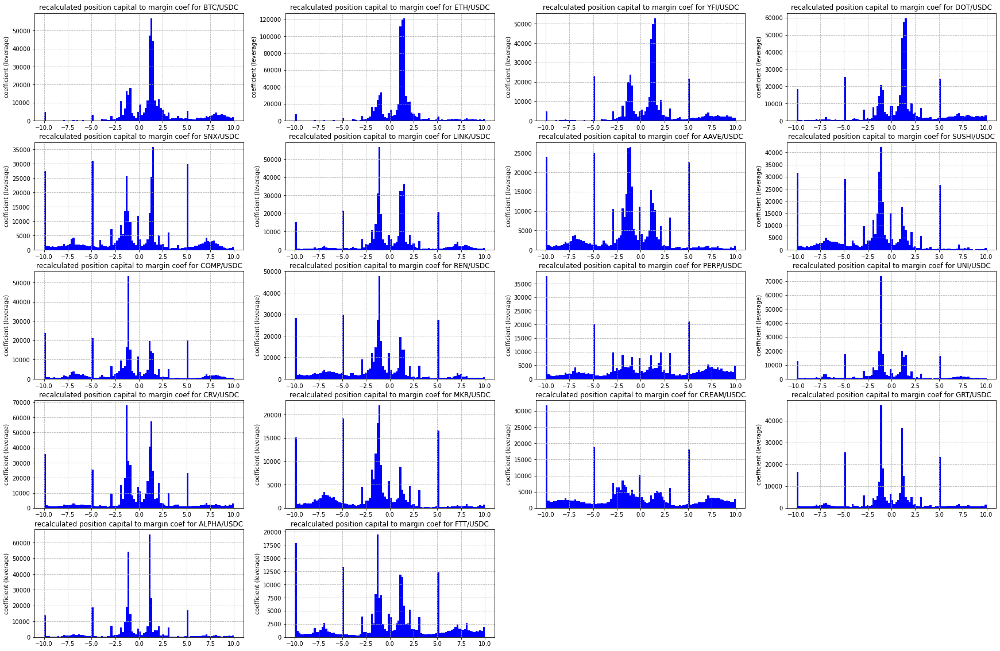

In [40]:
plt.figure(figsize=(30, 20))
index = 0

for amm_name in last_opens_df['amm_name'].unique():
    ax = plt.subplot(5, 4, index+1)
    reviewed_section = opens_closes_positions_df[(opens_closes_positions_df['amm_name'] == amm_name) &
                                    (opens_closes_positions_df['recalc_cap_to_margin_coef'] <= 10) &
                                    (opens_closes_positions_df['recalc_cap_to_margin_coef'] >= -10)]
    
    ax.hist(reviewed_section['recalc_cap_to_margin_coef'], 
            color='b', bins=100)
    ax.set_title('recalculated position capital to margin coef for ' + amm_name)
    ax.set_ylabel('coefficient (leverage)')
    ax.grid(True, linestyle='--')
    index += 1
    
plt.show()

# Analysis of the last opened positions

In [41]:
last_opens_df.sort_values(by=['Unnamed: 0'], inplace=True)

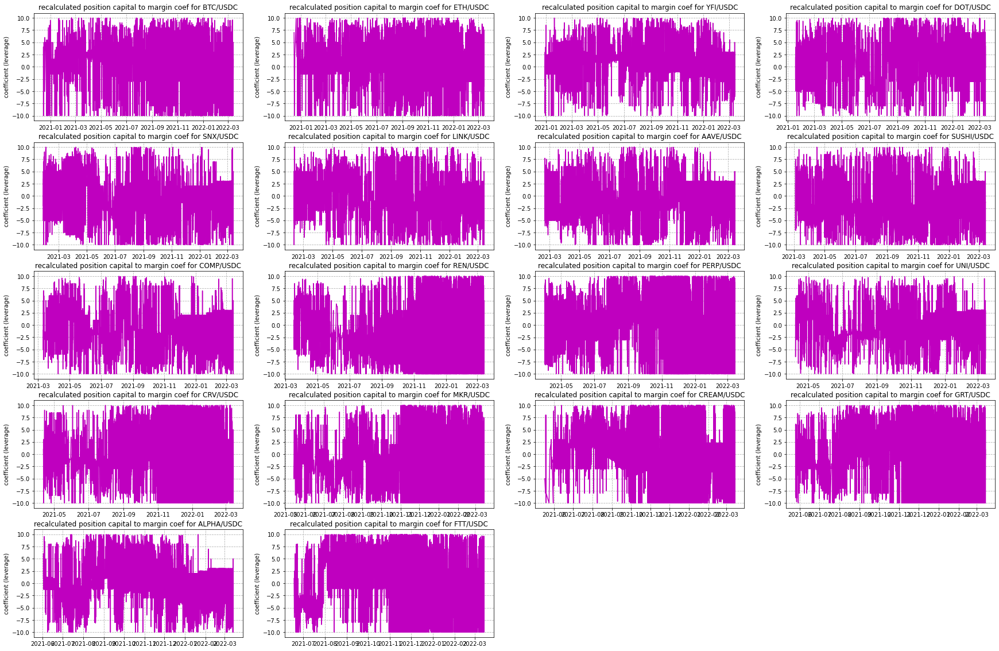

In [42]:
plt.figure(figsize=(30, 20))
index = 0

for amm_name in last_opens_df['amm_name'].unique():
    ax = plt.subplot(5, 4, index+1)
    reviewed_section = last_opens_df[(last_opens_df['amm_name'] == amm_name) &
                                      (last_opens_df['recalc_cap_to_margin_coef'] < 10) &
                                    (last_opens_df['recalc_cap_to_margin_coef'] > -10)]
    
    ax.plot(reviewed_section['timestamp'],
            reviewed_section['recalc_cap_to_margin_coef'], 
            color='m')
    ax.set_title('recalculated position capital to margin coef for ' + amm_name)
    ax.set_ylabel('coefficient (leverage)')
    ax.grid(True, linestyle='--')
    index += 1
    
plt.show()

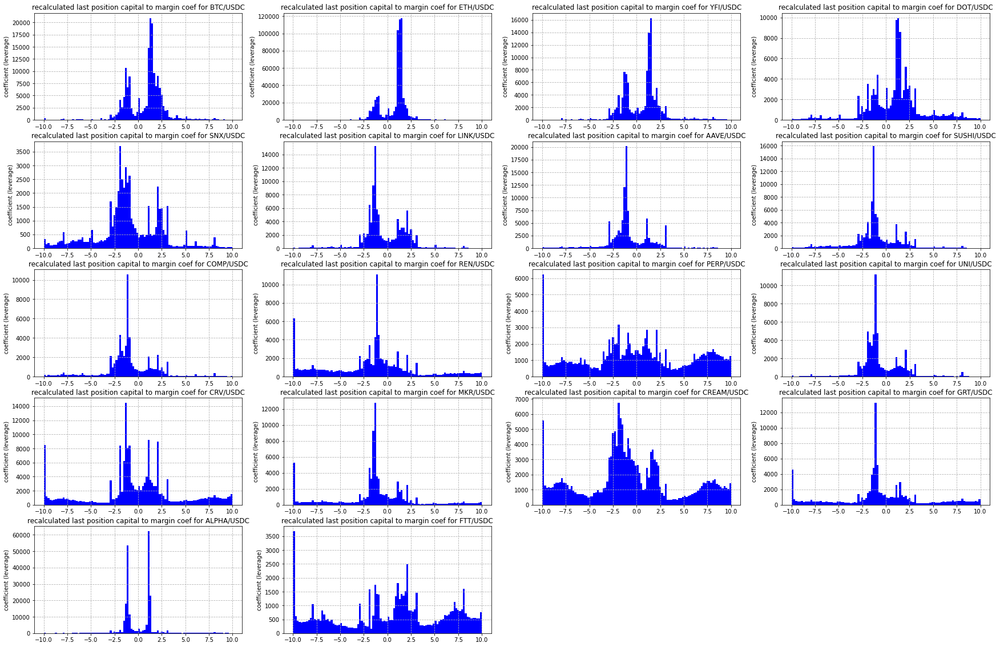

In [43]:
plt.figure(figsize=(30, 20))
index = 0

for amm_name in last_opens_df['amm_name'].unique():
    ax = plt.subplot(5, 4, index+1)
    reviewed_section = last_opens_df[(last_opens_df['amm_name'] == amm_name) &
                                    (last_opens_df['recalc_cap_to_margin_coef'] < 10) &
                                    (last_opens_df['recalc_cap_to_margin_coef'] > -10)]
    
    ax.hist(reviewed_section['recalc_cap_to_margin_coef'], 
            color='b', bins=100)
    ax.set_title('recalculated last position capital to margin coef for ' + amm_name)
    ax.set_ylabel('coefficient (leverage)')
    ax.grid(True, linestyle='--')
    index += 1
    
plt.show()

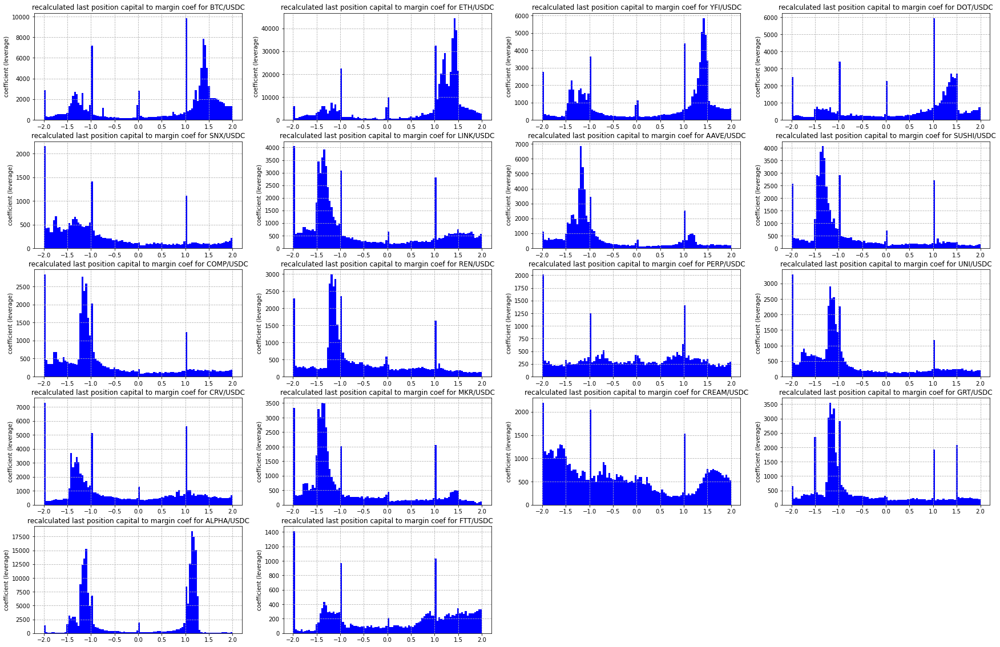

In [44]:
plt.figure(figsize=(30, 20))
index = 0

for amm_name in last_opens_df['amm_name'].unique():
    ax = plt.subplot(5, 4, index+1)
    reviewed_section = last_opens_df[(last_opens_df['amm_name'] == amm_name) &
                                    (last_opens_df['recalc_cap_to_margin_coef'] < 2) &
                                    (last_opens_df['recalc_cap_to_margin_coef'] > -2)]
    
    ax.hist(reviewed_section['recalc_cap_to_margin_coef'], 
            color='b', bins=100)
    ax.set_title('recalculated last position capital to margin coef for ' + amm_name)
    ax.set_ylabel('coefficient (leverage)')
    ax.grid(True, linestyle='--')
    index += 1
    
plt.show()

In [45]:
opens_closes_positions_df[opens_closes_positions_df['recalc_cap_to_margin_coef'] > 10]

,Unnamed: 0,id,trader,amm,margin,position_notional,exchanged_position_size,fee,position_size_after,realized_pnl,unrealized_pnl_after,bad_debt,liquidation_penalty,spot_price,funding_payment,block_number,timestamp,amm_name,open_close_id,open_id,margin_to_cap_coef,cap_to_margin_coef,recalc_cap_to_margin_coef
113657,6,0x7a26308fc414ace63350fa320b61c6bfd1321a1cc64c9a653810b944b2a38c6c-6,0x9602686bf53a17baed60c48ba34ed4219a532381,0x8d22f1a9dce724d8c1b4c688d75f17a2fe2d32df,292.443111,2924.431108,5.000000,2.924431,5.000000,0.0,0.000000,0.0,0.0,585.032480,0.000000,13510672,2020-12-14 06:35:40,ETH/USDC,2.0,1,0.100000,10.000000,10.002501
113658,7,0x3073ca99194a8f16e4565aea94785bda61d368c90b7a3fc8ecec94bf6fa9a589-6,0x9602686bf53a17baed60c48ba34ed4219a532381,0x8d22f1a9dce724d8c1b4c688d75f17a2fe2d32df,305.021444,125.783336,0.215000,0.125783,5.215000,0.0,0.062884,0.0,0.0,585.045061,0.000000,13510682,2020-12-14 06:36:30,ETH/USDC,0.0,1,2.424975,0.412375,10.002608
98865,8,0x42afbde94de9d330f1aca627f58cb42be12b4c87a30f7d9a95b7030bff25000f-6,0x9602686bf53a17baed60c48ba34ed4219a532381,0x0f346e19f01471c02485df1758cfd3d624e399b4,170.209060,1702.090596,0.089316,1.702091,0.089316,0.0,0.000000,0.0,0.0,19060.408971,0.000000,13510698,2020-12-14 06:37:55,BTC/USDC,3.0,1,0.100000,10.000000,10.001787
113730,15,0xc8f59ddcc8109da9ef08e53b7eb7a0b0a35f4e0f6150fd223387899cf0890ca6-6,0xa7f43e1ae864f3fee6d95e9990b9bbdb043dae27,0x8d22f1a9dce724d8c1b4c688d75f17a2fe2d32df,292.683531,2926.835310,5.000000,2.926835,5.000000,0.0,0.000000,0.0,0.0,585.513500,0.000000,13510825,2020-12-14 06:48:35,ETH/USDC,9.0,1,0.100000,10.000000,10.002502
98866,19,0x31fdfa56b032e17256360590e84083176a5d5e2c2c93b1a34a905a9ec489eb9f-6,0x9602686bf53a17baed60c48ba34ed4219a532381,0x0f346e19f01471c02485df1758cfd3d624e399b4,471.767965,3014.464523,0.158034,3.014465,0.247349,0.0,1.826502,0.0,0.0,19080.864393,-0.112453,13510999,2020-12-14 07:03:20,BTC/USDC,0.0,1,0.156501,6.389719,10.004155
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
501704,9341559,0x384dc6d35a16f6c0c2dd6177e922ebc06628cbb1ae1efdf84f14418adac3aee0-15,0x906631082fd940e83412751b446e57109bae55ce,0xfcae57db10356fcf76b6476b21ac14c504a45128,263.221413,2632.214132,642.993798,2.632214,642.993798,0.0,0.000000,0.0,0.0,4.095359,0.000000,21101664,2022-03-14 08:27:55,PERP/USDC,1235422.0,692,0.100000,10.000000,10.004089
494927,9341570,0x644c9cd611e3b8a5316bd05db287293f3457bce3b524036df3ead71ac2e34fd4-6,0xd7de65b79d01a94f8e0acc2c82c5520cc31bc927,0xfcae57db10356fcf76b6476b21ac14c504a45128,399.999641,3999.996411,971.500978,3.999996,971.500978,0.0,0.000000,0.0,0.0,4.119888,0.000000,21101693,2022-03-14 08:30:20,PERP/USDC,1235424.0,471,0.100000,10.000000,10.006197
501986,9341632,0x89c9b4813e2dca10002f7a4dadf132c615eed54c78009e1d8c6b0ebb884ea952-8,0x34027cd0980abebb07529e4b32de5e23b39caf16,0x0f346e19f01471c02485df1758cfd3d624e399b4,17.772647,177.726473,0.004553,0.177726,0.004553,0.0,0.000000,0.0,0.0,39031.346488,0.000000,21101826,2022-03-14 08:41:25,BTC/USDC,1235439.0,83,0.100000,10.000000,10.000130
419670,9341677,0x73301e1be9db166a48769408fdd53f00af5abc59df5eb14b100ad492e3375409-6,0xff1daa851e915f34e0f1e4c4687d04e3de52bde1,0x7b479a0a816ca33f8eb5a3312d1705a34d2d4c82,300.000000,3000.000000,70.603001,3.000000,70.603001,0.0,0.000000,0.0,0.0,42.519324,0.000000,21101938,2022-03-14 08:50:45,CREAM/USDC,1235441.0,444,0.100000,10.000000,10.006639


# Margin values for anomalous coefficients

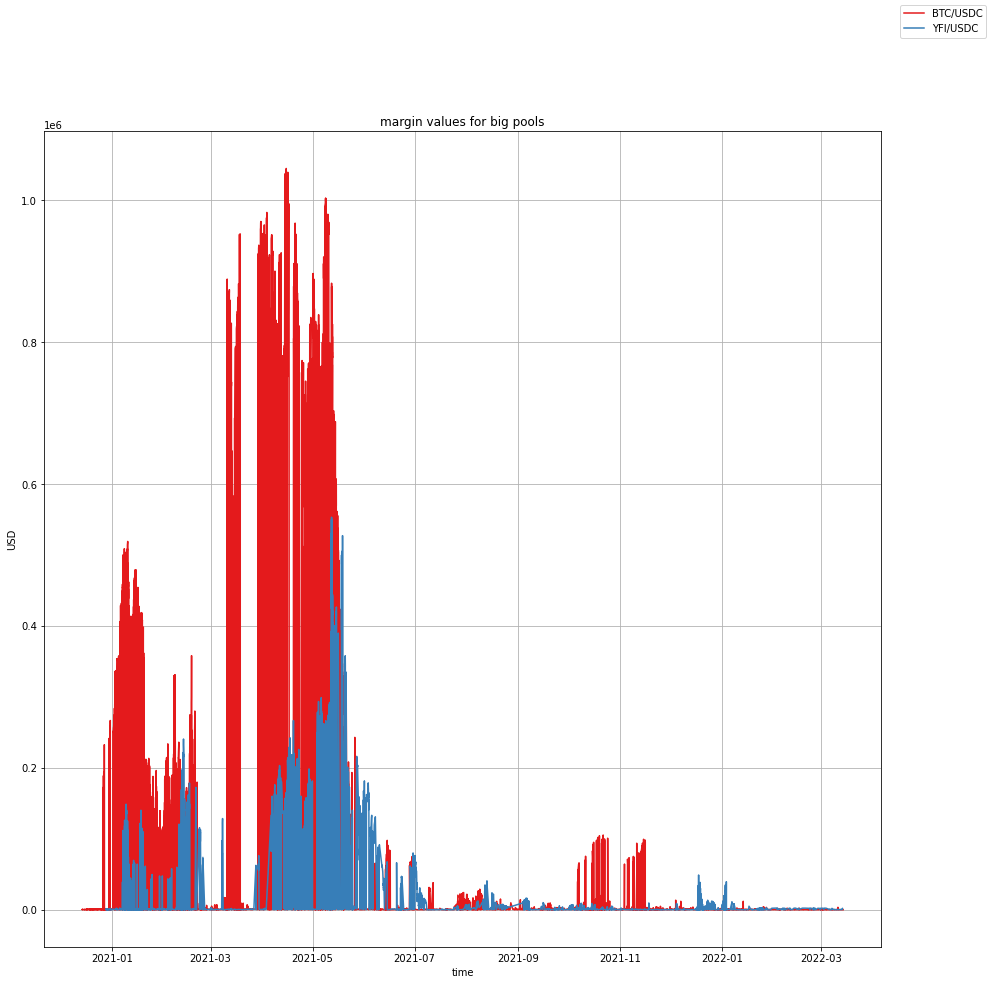

In [46]:
hued_lineplot(opens_closes_positions_df[opens_closes_positions_df['recalc_cap_to_margin_coef'] > 10],
             'timestamp', 'margin', 'amm_name', big_pools, xlabel='time', ylabel='USD', 
              title='margin values for big pools', xsize=15, ysize=15, is_grid_required=True)

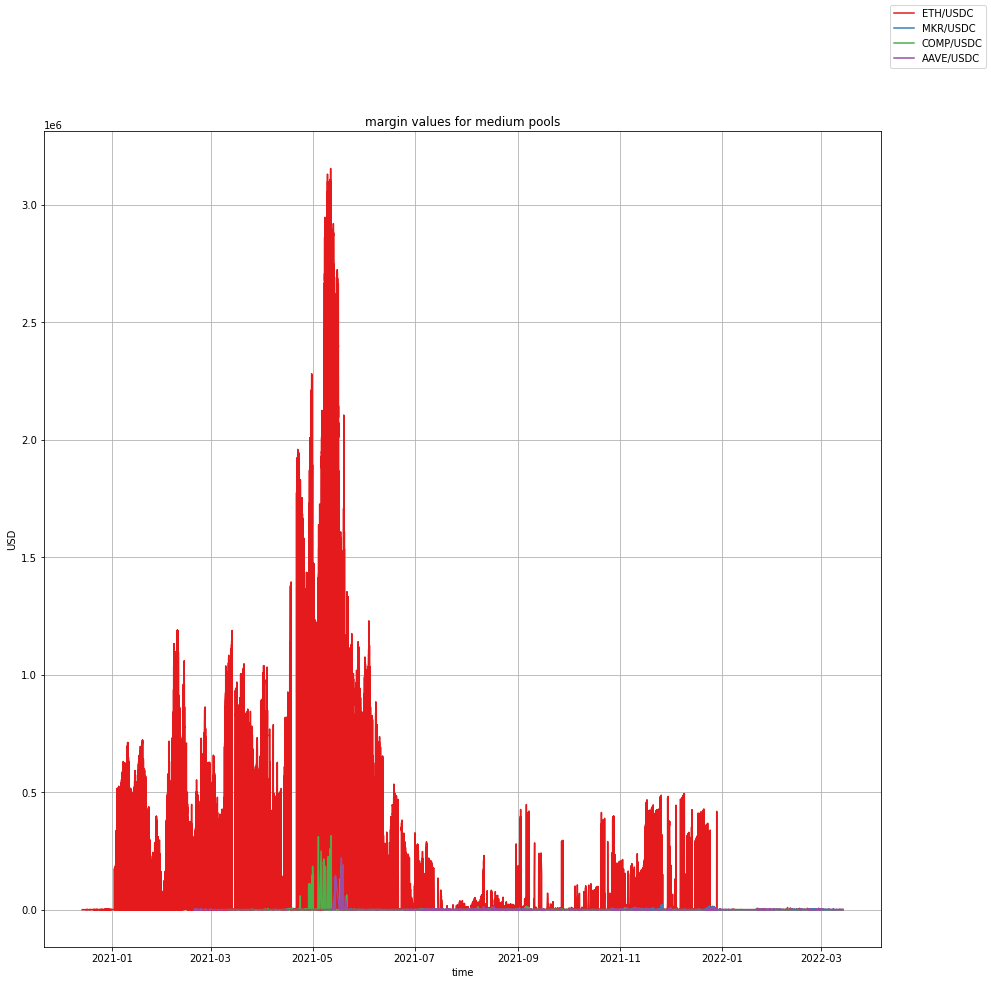

In [47]:
hued_lineplot(opens_closes_positions_df[opens_closes_positions_df['recalc_cap_to_margin_coef'] > 10],
             'timestamp', 'margin', 'amm_name', medium_pools, xlabel='time', ylabel='USD', 
              title='margin values for medium pools', xsize=15, ysize=15, is_grid_required=True)

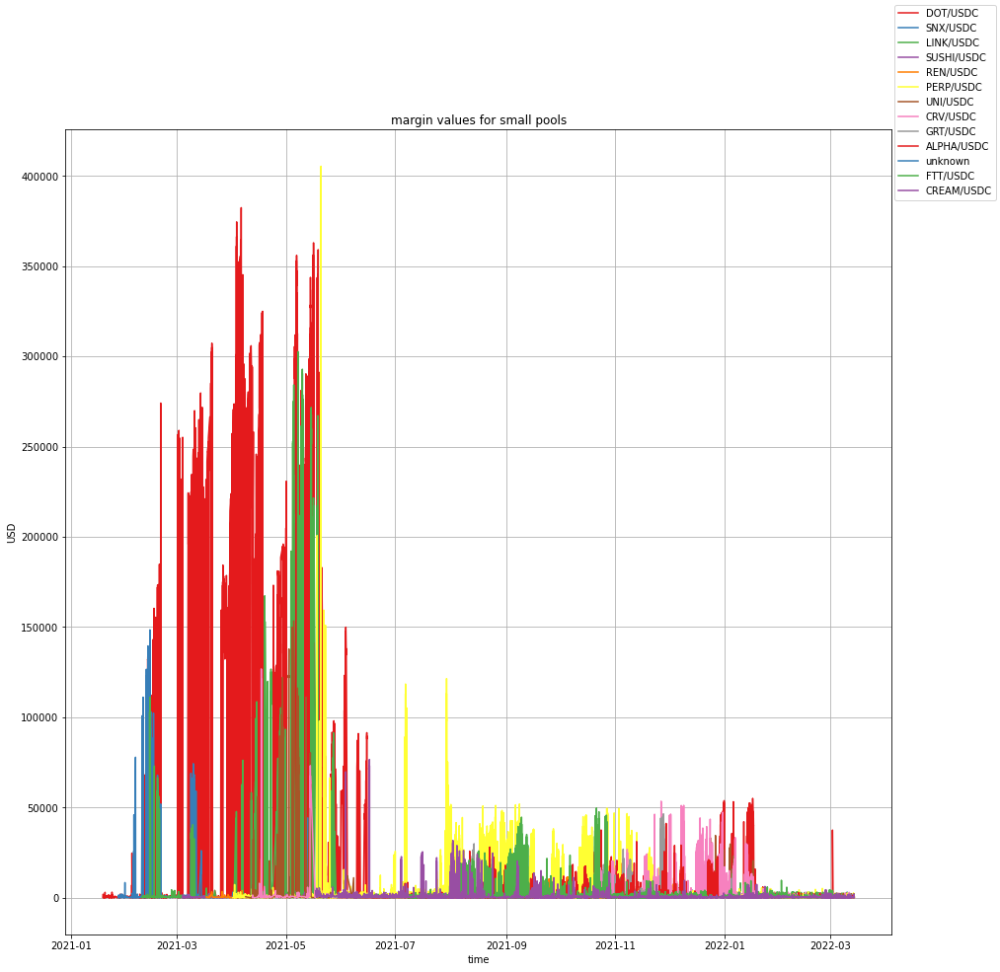

In [48]:
hued_lineplot(opens_closes_positions_df[opens_closes_positions_df['recalc_cap_to_margin_coef'] > 10],
             'timestamp', 'margin', 'amm_name', small_pools, xlabel='time', ylabel='USD', 
              title='margin values for small pools', xsize=15, ysize=15, is_grid_required=True)

# Position capitalization for anomalous coefficients

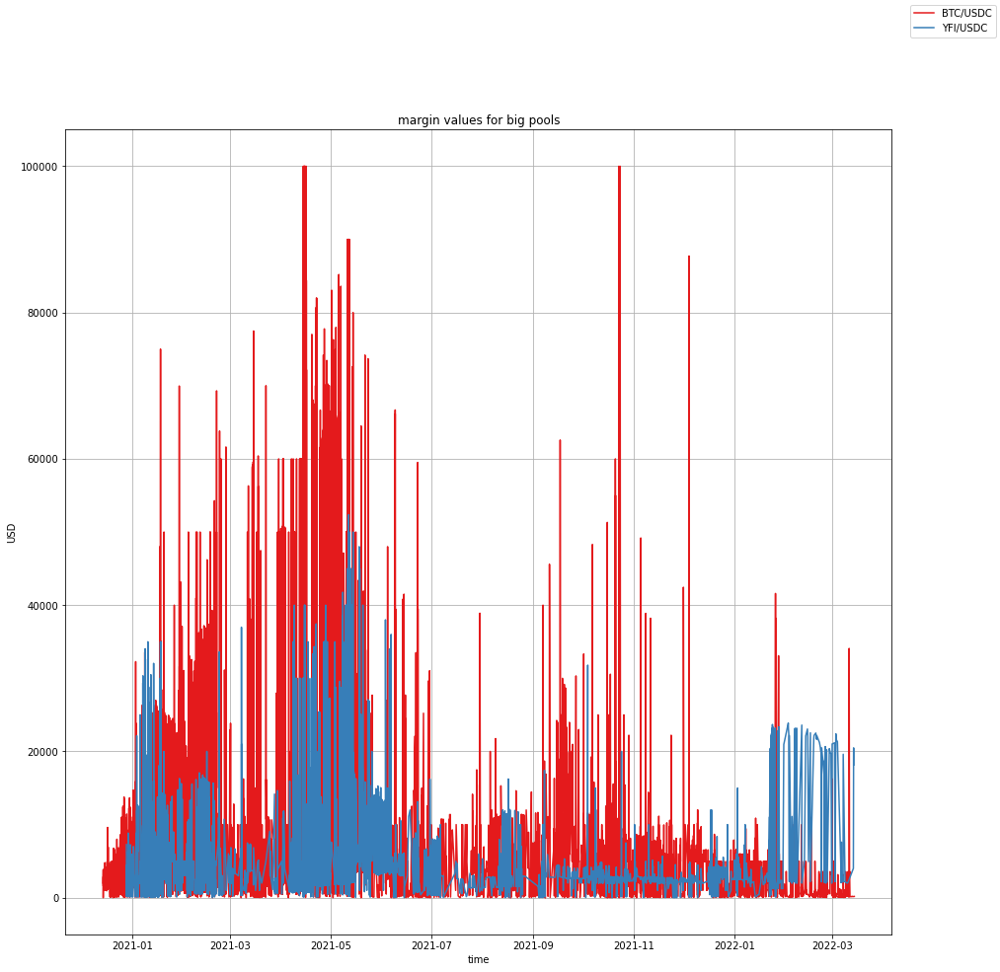

In [49]:
hued_lineplot(opens_closes_positions_df[opens_closes_positions_df['recalc_cap_to_margin_coef'] > 10],
             'timestamp', 'position_notional', 'amm_name', big_pools, xlabel='time', ylabel='USD', 
              title='margin values for big pools', xsize=15, ysize=15, is_grid_required=True)

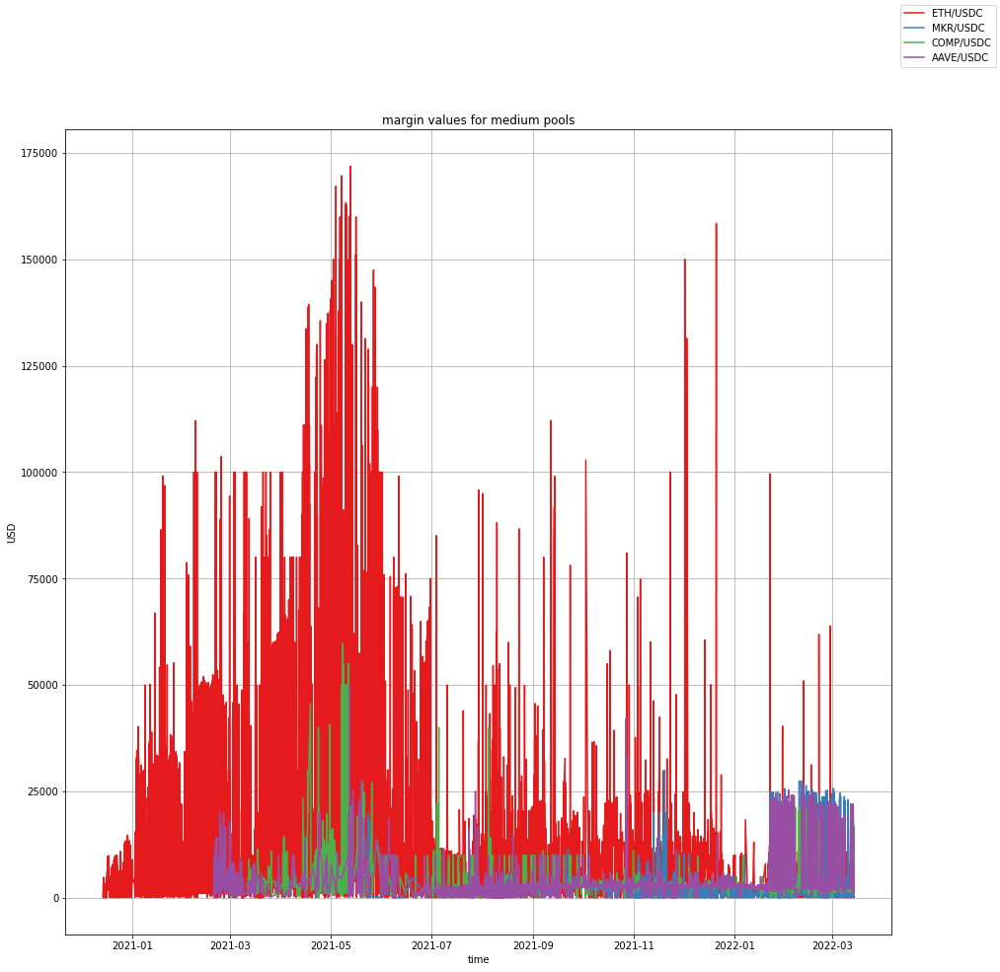

In [50]:
hued_lineplot(opens_closes_positions_df[opens_closes_positions_df['recalc_cap_to_margin_coef'] > 10],
             'timestamp', 'position_notional', 'amm_name', medium_pools, xlabel='time', ylabel='USD', 
              title='margin values for medium pools', xsize=15, ysize=15, is_grid_required=True)

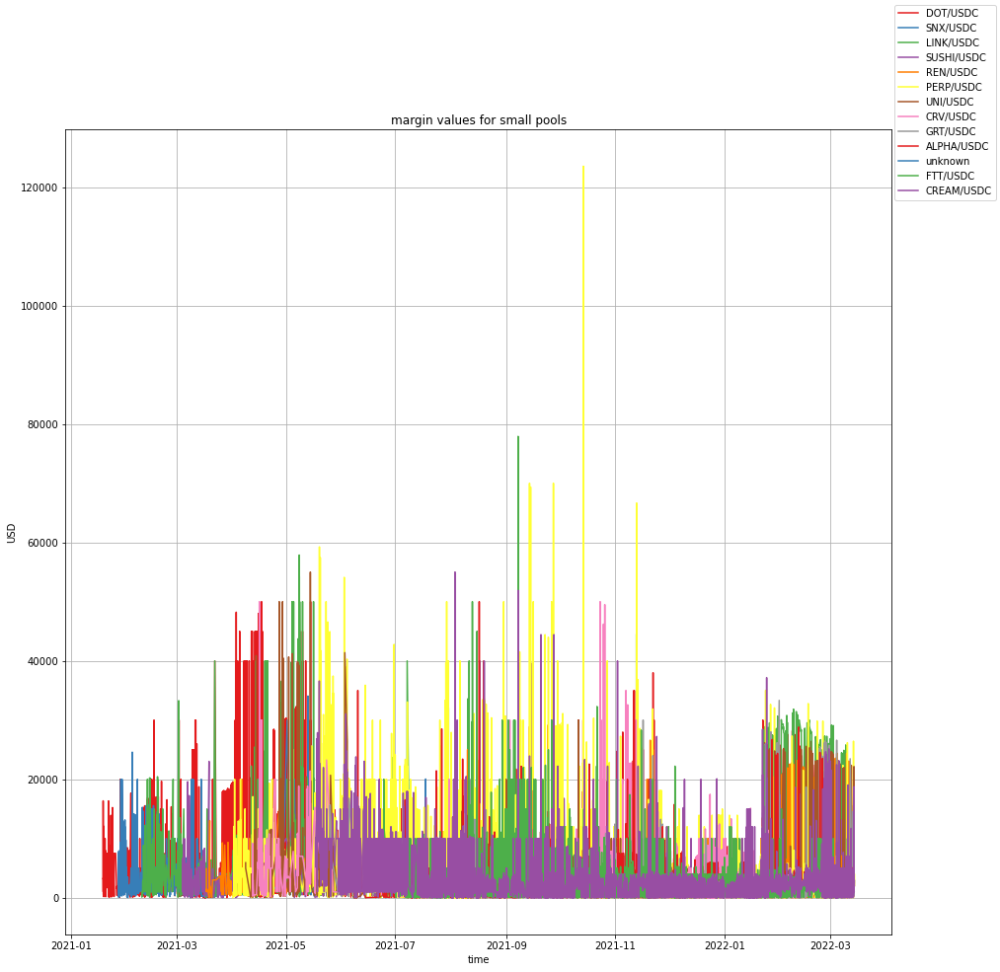

In [51]:
hued_lineplot(opens_closes_positions_df[opens_closes_positions_df['recalc_cap_to_margin_coef'] > 10],
             'timestamp', 'position_notional', 'amm_name', small_pools, xlabel='time', ylabel='USD', 
              title='margin values for small pools', xsize=15, ysize=15, is_grid_required=True)

### BTC/USDC

In [52]:
opens_closes_positions_df[opens_closes_positions_df['amm_name'] == "BTC/USDC"]['trader'].value_counts().head(10).keys()

Index(['0x09e728ce1a6933e7d2837e6b94f56c798ebf3ce1',
       '0x1a48776f436bcdaa16845a378666cf4ba131eb0f',
       '0x000000ea89990a17ec07a35ac2bbb02214c50152',
       '0x97f64e76e7444afba3781a362cf2661b417eb4f3',
       '0x940c3b8772fdfed66ea165c2c0011c65c57bea01',
       '0xaaf2cf2a9c8a8f3b02f2c0a9d19b37722e8b7305',
       '0x1fff09ff1ce7c78bea4f46b1a4b2fa1d50439ee8',
       '0xe7218b2cacb8001a93334c6734da4781d90bc37a',
       '0xcca621839eaeae1c02d08749513b75262a1cec67',
       '0x94d065b56e9360ac7e7340fd91481720b19bd262'],
      dtype='object')

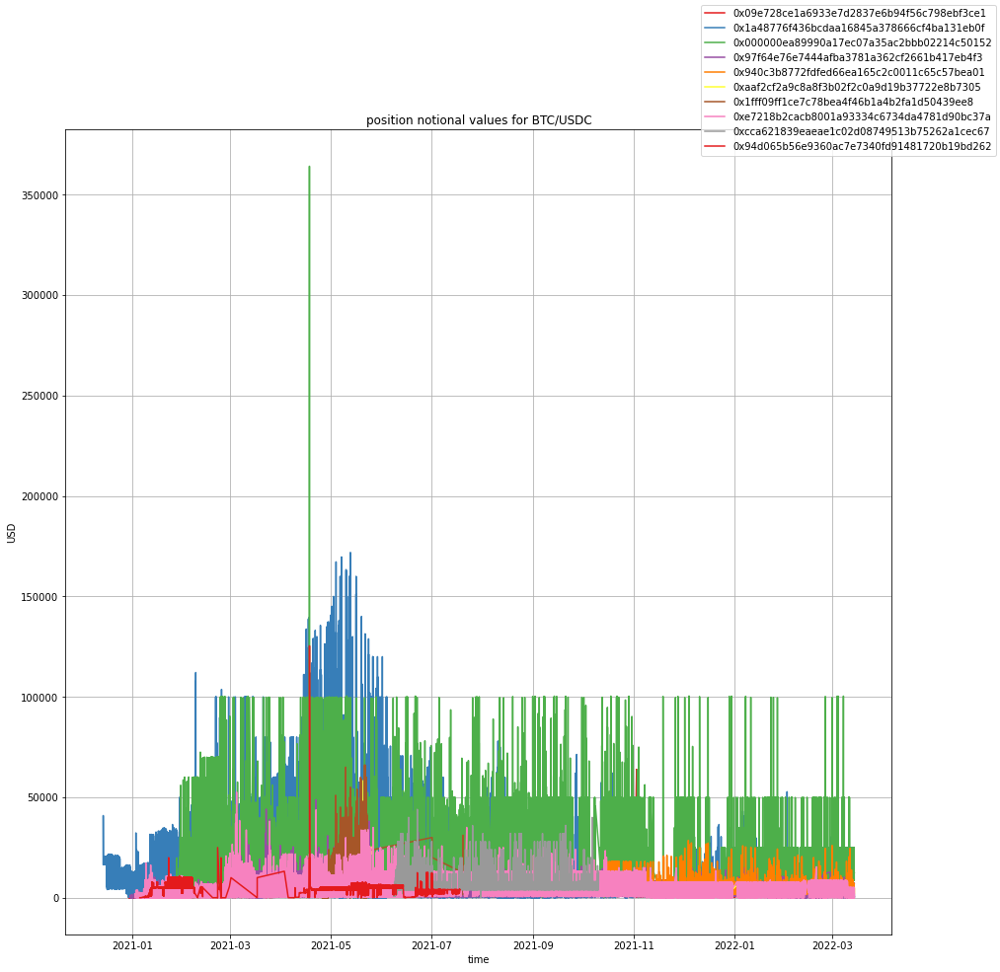

In [53]:
top_20_traders = ['0x09e728ce1a6933e7d2837e6b94f56c798ebf3ce1',
       '0x1a48776f436bcdaa16845a378666cf4ba131eb0f',
       '0x000000ea89990a17ec07a35ac2bbb02214c50152',
       '0x97f64e76e7444afba3781a362cf2661b417eb4f3',
       '0x940c3b8772fdfed66ea165c2c0011c65c57bea01',
       '0xaaf2cf2a9c8a8f3b02f2c0a9d19b37722e8b7305',
       '0x1fff09ff1ce7c78bea4f46b1a4b2fa1d50439ee8',
       '0xe7218b2cacb8001a93334c6734da4781d90bc37a',
       '0xcca621839eaeae1c02d08749513b75262a1cec67',
       '0x94d065b56e9360ac7e7340fd91481720b19bd262']

hued_lineplot(opens_closes_positions_df, 'timestamp', 'position_notional', 'trader', top_20_traders, 
              xlabel='time', ylabel='USD', title='position notional values for BTC/USDC', xsize=15, ysize=15, 
              is_grid_required=True)

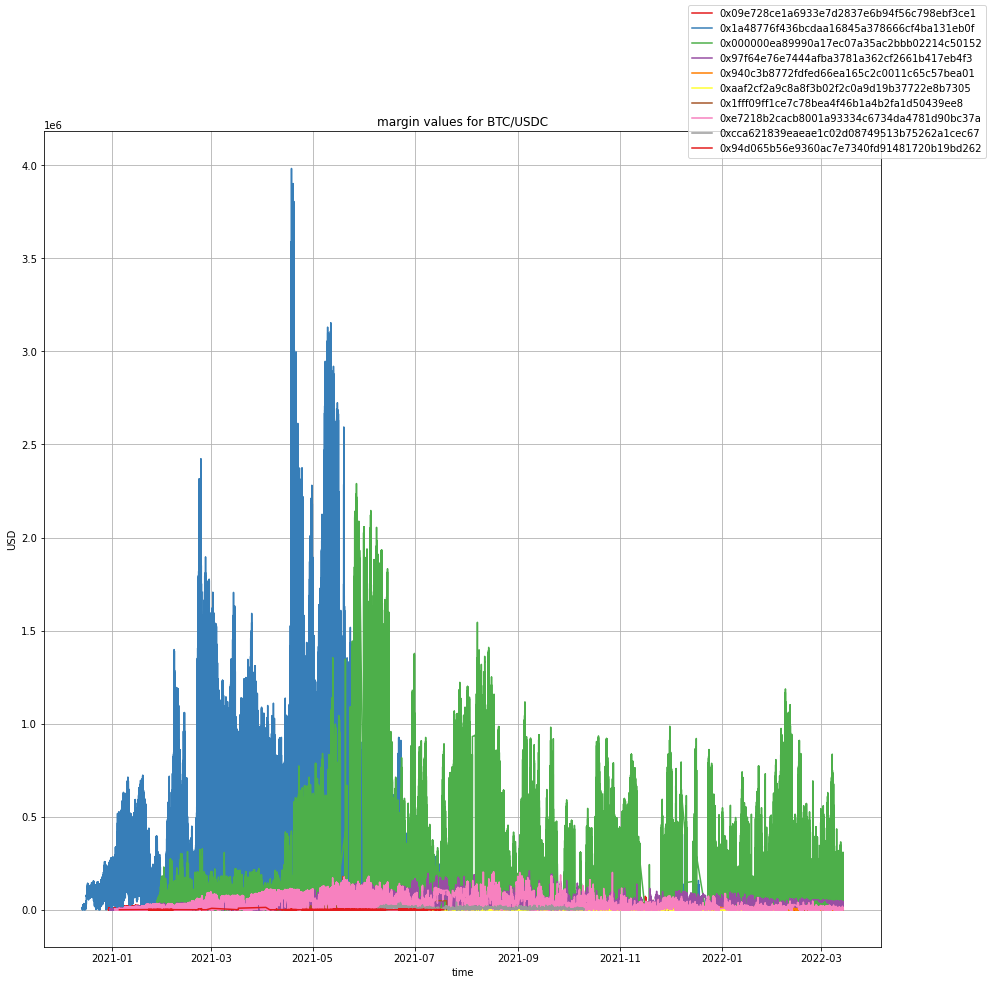

In [54]:
hued_lineplot(opens_closes_positions_df, 'timestamp', 'margin', 'trader', top_20_traders, 
              xlabel='time', ylabel='USD', title='margin values for BTC/USDC', xsize=15, ysize=15, 
              is_grid_required=True)

### ETH/USDC

In [55]:
opens_closes_positions_df[opens_closes_positions_df['amm_name'] == "ETH/USDC"]['trader'].value_counts().head(10).keys()

Index(['0xce7e86725fa9ef1f5cd0f266bf5d48af1686f445',
       '0x000000ea89990a17ec07a35ac2bbb02214c50152',
       '0xe0d4c98c9f777c7113a984cb48df3e6c2d9047c5',
       '0x1a48776f436bcdaa16845a378666cf4ba131eb0f',
       '0x77489751932c34d54fea28016408a44f147b6ae8',
       '0x7b02e7ceefeccd0dec1051adf23a361e9849858a',
       '0xf1d27707324a58bf332a367705d221c3b47ef00a',
       '0x1fff09ff1ce7c78bea4f46b1a4b2fa1d50439ee8',
       '0xe448a6101262d51034a2fa210f1a9ae11b24f947',
       '0x5af1c0ecf3b22af19fddb967537a1b7c8344f727'],
      dtype='object')

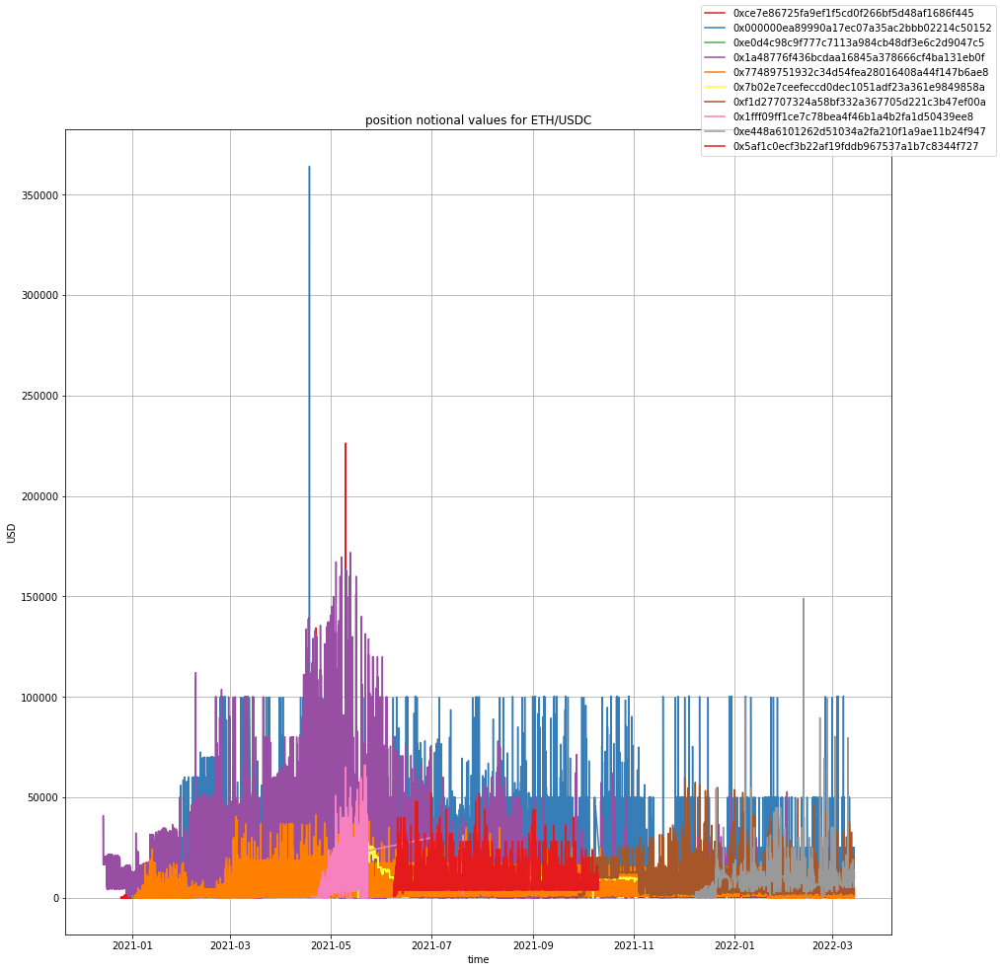

In [56]:
top_20_traders = ['0xce7e86725fa9ef1f5cd0f266bf5d48af1686f445',
       '0x000000ea89990a17ec07a35ac2bbb02214c50152',
       '0xe0d4c98c9f777c7113a984cb48df3e6c2d9047c5',
       '0x1a48776f436bcdaa16845a378666cf4ba131eb0f',
       '0x77489751932c34d54fea28016408a44f147b6ae8',
       '0x7b02e7ceefeccd0dec1051adf23a361e9849858a',
       '0xf1d27707324a58bf332a367705d221c3b47ef00a',
       '0x1fff09ff1ce7c78bea4f46b1a4b2fa1d50439ee8',
       '0xe448a6101262d51034a2fa210f1a9ae11b24f947',
       '0x5af1c0ecf3b22af19fddb967537a1b7c8344f727']

hued_lineplot(opens_closes_positions_df, 'timestamp', 'position_notional', 'trader', top_20_traders, 
              xlabel='time', ylabel='USD', title='position notional values for ETH/USDC', xsize=15, ysize=15, 
              is_grid_required=True)

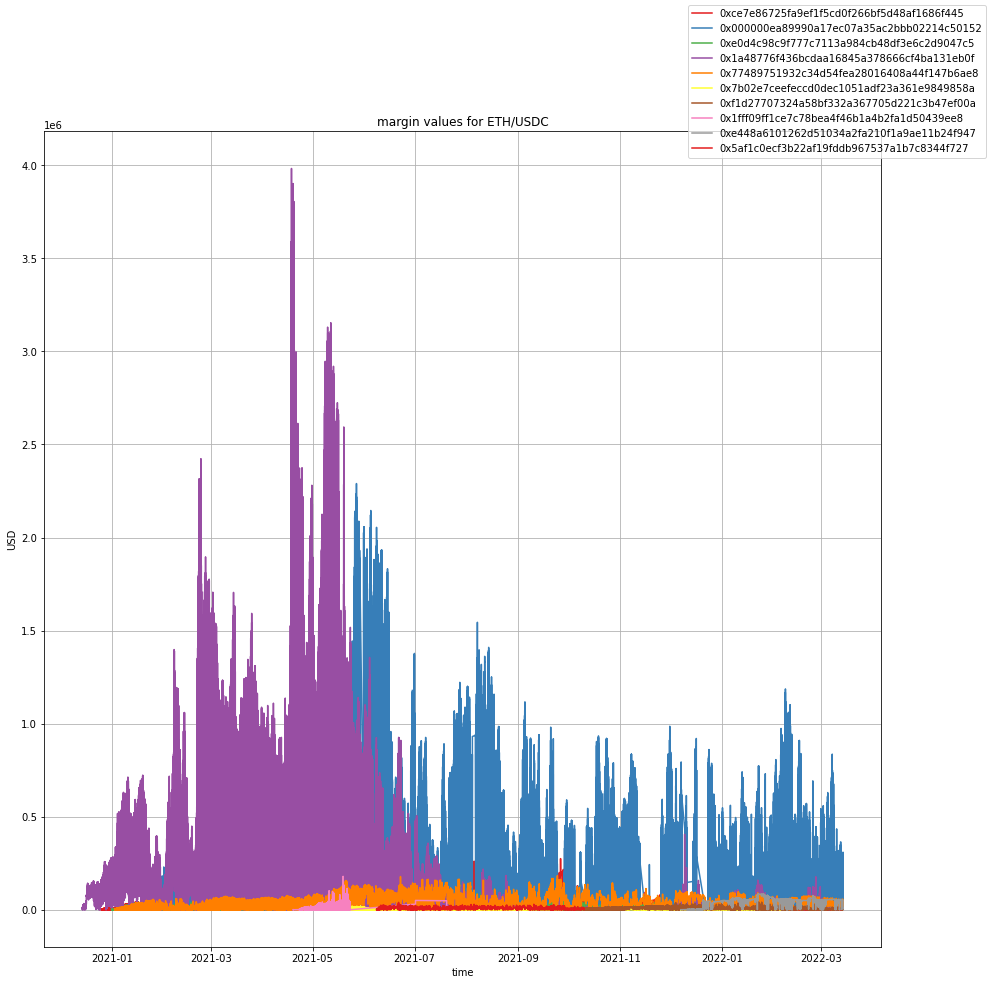

In [57]:
hued_lineplot(opens_closes_positions_df, 'timestamp', 'margin', 'trader', top_20_traders, 
              xlabel='time', ylabel='USD', title='margin values for ETH/USDC', xsize=15, ysize=15, 
              is_grid_required=True)

### YFI/USDC

In [58]:
opens_closes_positions_df[opens_closes_positions_df['amm_name'] == "YFI/USDC"]['trader'].value_counts().head(10).keys()

Index(['0x2fba973a545f44baf0d391c1e419c203253de7d0',
       '0x1a48776f436bcdaa16845a378666cf4ba131eb0f',
       '0x7a4ee543471f91ed1f8b33a476af4adbd15da4db',
       '0x000000ea89990a17ec07a35ac2bbb02214c50152',
       '0x1fff09ff1ce7c78bea4f46b1a4b2fa1d50439ee8',
       '0xbb63ce5242186728bb0ebc5b62c6a76eef647c35',
       '0xa46261c04043ff0cd57c7f9dda3db9f353d2d6f2',
       '0xb35ba7ddb1f5b09bffb2955fe843b5d15b8d7a25',
       '0x1e28e5e6901c835a86e9652d9da88a23d623562c',
       '0x4700381c4ee01d026dc91a6d4549b77036e5ea9b'],
      dtype='object')

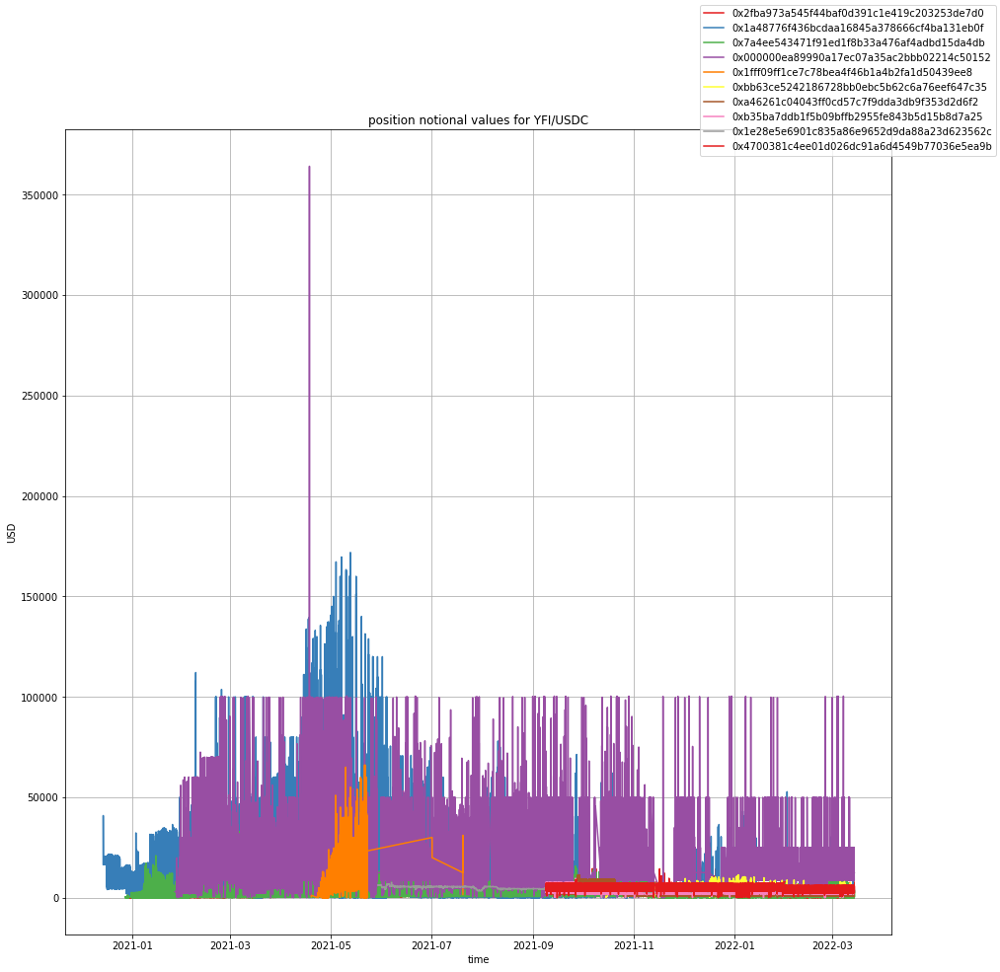

In [59]:
top_20_traders = ['0x2fba973a545f44baf0d391c1e419c203253de7d0',
       '0x1a48776f436bcdaa16845a378666cf4ba131eb0f',
       '0x7a4ee543471f91ed1f8b33a476af4adbd15da4db',
       '0x000000ea89990a17ec07a35ac2bbb02214c50152',
       '0x1fff09ff1ce7c78bea4f46b1a4b2fa1d50439ee8',
       '0xbb63ce5242186728bb0ebc5b62c6a76eef647c35',
       '0xa46261c04043ff0cd57c7f9dda3db9f353d2d6f2',
       '0xb35ba7ddb1f5b09bffb2955fe843b5d15b8d7a25',
       '0x1e28e5e6901c835a86e9652d9da88a23d623562c',
       '0x4700381c4ee01d026dc91a6d4549b77036e5ea9b']

hued_lineplot(opens_closes_positions_df, 'timestamp', 'position_notional', 'trader', top_20_traders, 
              xlabel='time', ylabel='USD', title='position notional values for YFI/USDC', xsize=15, ysize=15, 
              is_grid_required=True)

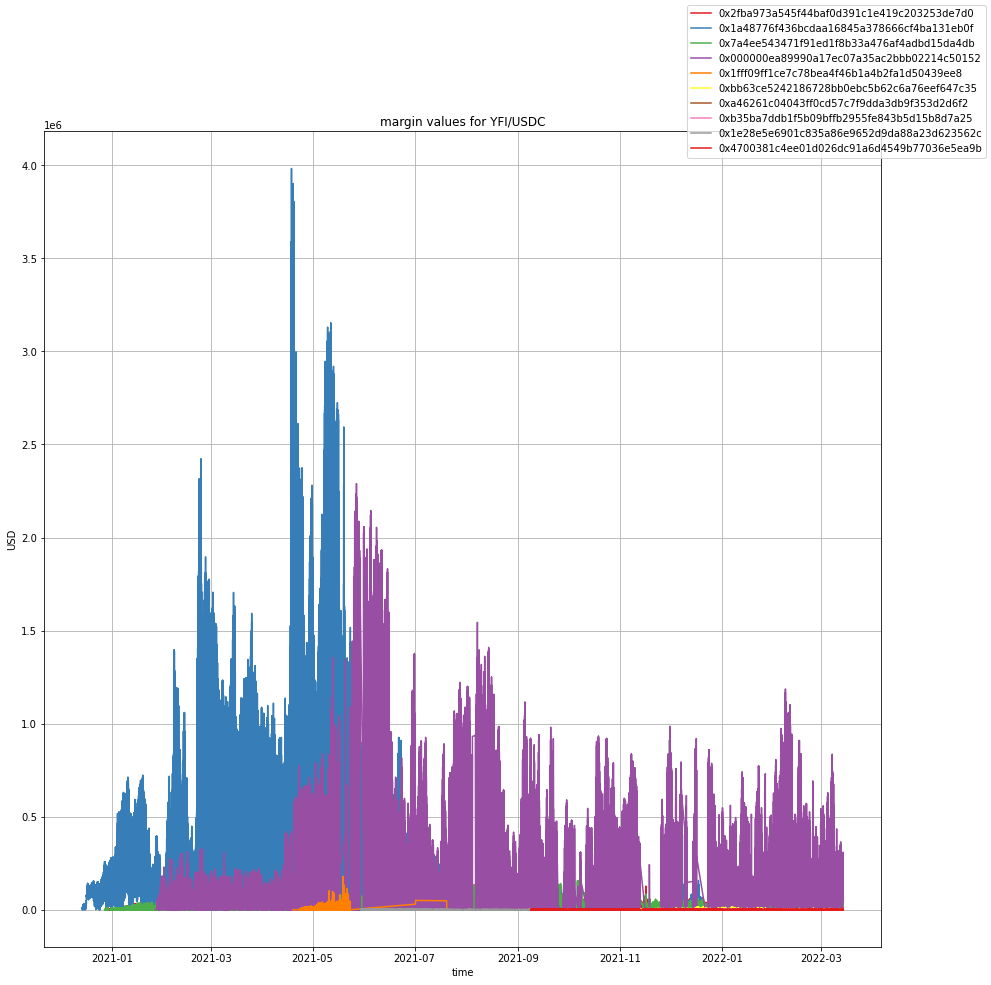

In [60]:
hued_lineplot(opens_closes_positions_df, 'timestamp', 'margin', 'trader', top_20_traders, 
              xlabel='time', ylabel='USD', title='margin values for YFI/USDC', xsize=15, ysize=15, 
              is_grid_required=True)

### AAVE/USDC

In [61]:
opens_closes_positions_df[opens_closes_positions_df['amm_name'] == "AAVE/USDC"]['trader'].value_counts().head(10).keys()

Index(['0x77489751932c34d54fea28016408a44f147b6ae8',
       '0x1a48776f436bcdaa16845a378666cf4ba131eb0f',
       '0x000000ea89990a17ec07a35ac2bbb02214c50152',
       '0xd94606128b20680539a719b07bca6cbc30786a28',
       '0x1fff09ff1ce7c78bea4f46b1a4b2fa1d50439ee8',
       '0x234aa61d403d1fd9908490116bd145400d890415',
       '0x52e45796c9b6320b3a014141bfcc06302262cae8',
       '0x8fb5c6f3c336033deeedbb54ad95e96453c9eaa4',
       '0x1b11659201f2b339b14acbdf975719b2c677fc2d',
       '0x17574e5d87932224b665f7d03b86847fd27345bc'],
      dtype='object')

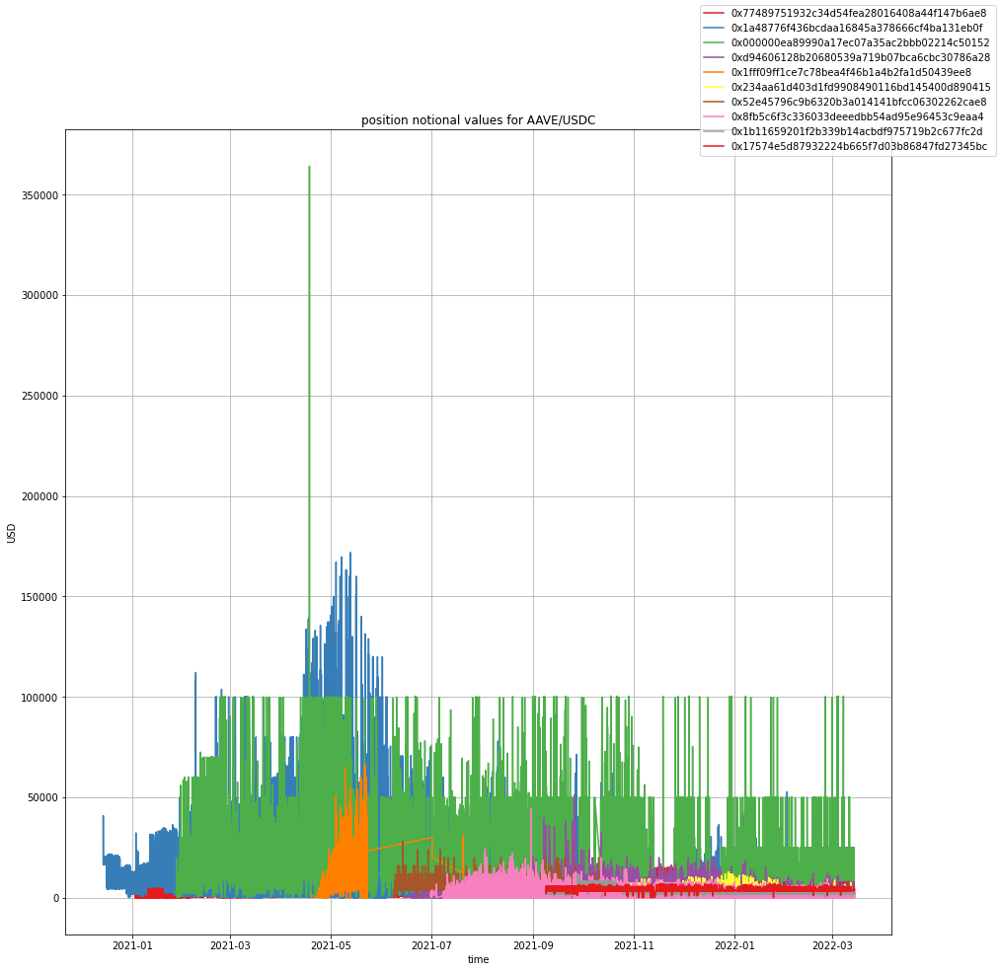

In [62]:
top_20_traders = ['0x77489751932c34d54fea28016408a44f147b6ae8',
       '0x1a48776f436bcdaa16845a378666cf4ba131eb0f',
       '0x000000ea89990a17ec07a35ac2bbb02214c50152',
       '0xd94606128b20680539a719b07bca6cbc30786a28',
       '0x1fff09ff1ce7c78bea4f46b1a4b2fa1d50439ee8',
       '0x234aa61d403d1fd9908490116bd145400d890415',
       '0x52e45796c9b6320b3a014141bfcc06302262cae8',
       '0x8fb5c6f3c336033deeedbb54ad95e96453c9eaa4',
       '0x1b11659201f2b339b14acbdf975719b2c677fc2d',
       '0x17574e5d87932224b665f7d03b86847fd27345bc']

hued_lineplot(opens_closes_positions_df, 'timestamp', 'position_notional', 'trader', top_20_traders, 
              xlabel='time', ylabel='USD', title='position notional values for AAVE/USDC', xsize=15, ysize=15, 
              is_grid_required=True)

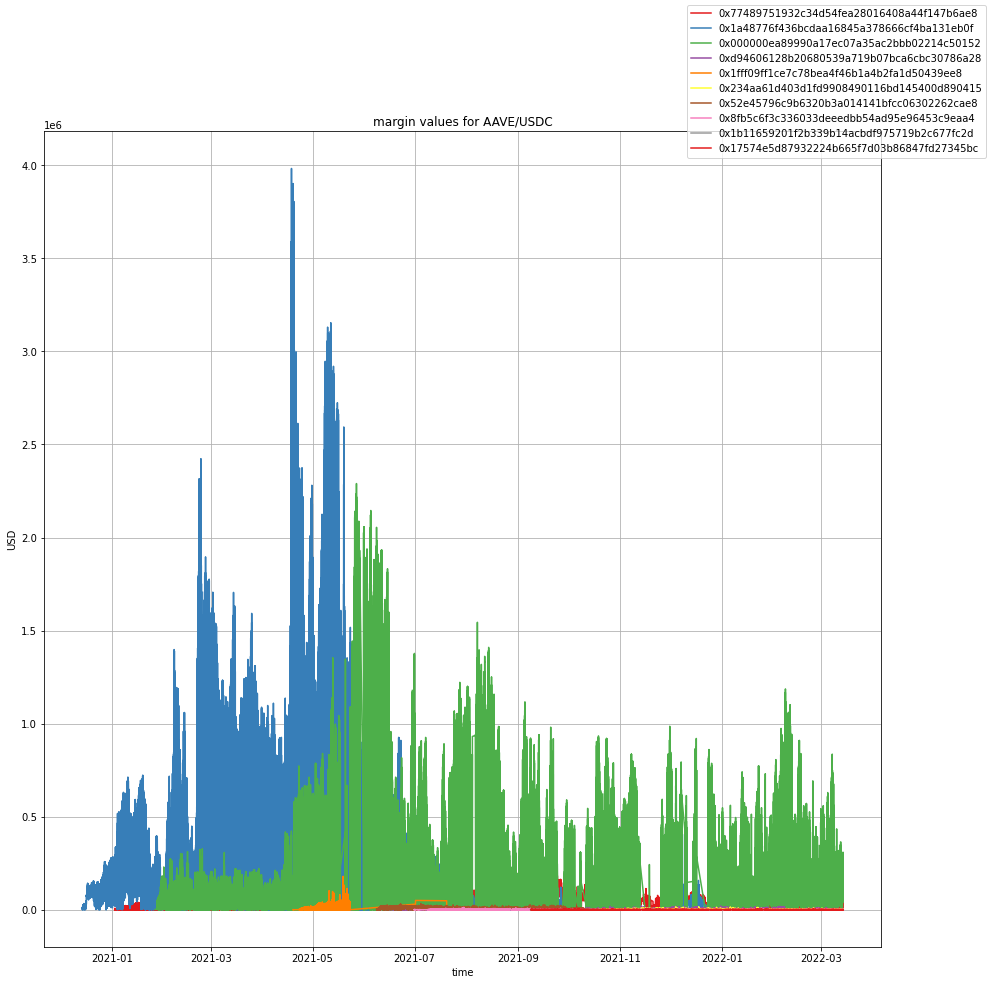

In [63]:
hued_lineplot(opens_closes_positions_df, 'timestamp', 'margin', 'trader', top_20_traders, 
              xlabel='time', ylabel='USD', title='margin values for AAVE/USDC', xsize=15, ysize=15, 
              is_grid_required=True)

# Getting transaction version out of the ID

In [64]:
def tx_version_separate(record):
    splitted_id = record['id'].split('-')
    if len(splitted_id) > 1:
        record['id'] = splitted_id[0]
        record['tx_change_version'] = splitted_id[1]
    
    return record

In [65]:
%%time
opens_closes_positions_df['tx_change_version'] = np.zeros(len(opens_closes_positions_df))
opens_closes_positions_df = opens_closes_positions_df.apply(lambda record: tx_version_separate(record), axis=1)

Wall time: 11min 36s


In [66]:
opens_closes_positions_df.iloc[2000011]['block_number']

16123428

In [67]:
opens_closes_positions_df[opens_closes_positions_df['block_number'] == 
                          opens_closes_positions_df.iloc[2000011]['block_number']]

,Unnamed: 0,id,trader,amm,margin,position_notional,exchanged_position_size,fee,position_size_after,realized_pnl,unrealized_pnl_after,bad_debt,liquidation_penalty,spot_price,funding_payment,block_number,timestamp,amm_name,open_close_id,open_id,margin_to_cap_coef,cap_to_margin_coef,recalc_cap_to_margin_coef,tx_change_version
24918,2000007,0x2204ea4c49354d829f8c0129237897ac6f8fa727a2858d7dfe7837bd5237b636,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0xf559668108ff57745d5e3077b0a7dd92ffc6300c,3.366916e+03,2954.064135,135.747762,2.954064,1086.081614,0.000000,21.079217,0.0,0.0,21.768524,0.0,16123428,2021-05-19 00:29:20,SUSHI/USDC,0.0,257,1.139757,0.877380,7.021974,33
190294,2000008,0x2b80cecace40782486c07eb924a926094438a98f726816083bb0b48edcde83f5,0x1fff09ff1ce7c78bea4f46b1a4b2fa1d50439ee8,0x16a7ecf2c27cb367df36d39e389e66b42000e0df,1.494445e+04,6003.419406,9.226306,6.003419,-13.627124,-55.005619,-81.242519,0.0,0.0,651.055190,0.0,16123428,2021-05-19 00:29:20,AAVE/USDC,0.0,2,2.489323,0.401716,-0.593666,12
77680,2000009,0x6dbbfcc76b11e3c4ee5b0dc4505a9d48d0d58c28a6625394b98d6c4fe03e75ac,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0x8d22f1a9dce724d8c1b4c688d75f17a2fe2d32df,1.179298e+06,7893.792687,2.320820,7.893793,8430.906095,0.000000,839409.700613,0.0,0.0,3402.247003,0.0,16123428,2021-05-19 00:29:20,ETH/USDC,0.0,2,149.395655,0.006694,24.322959,19
40038,2000010,0x9c3a4249e3aacde2e815bb99f8e74af1a8e84cc959de8b46ff473d14fb3786a1,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0x6de775aabeeede8efdb1a257198d56a3ac18c2fd,3.566152e+05,5756.634186,140.168900,5.756634,87718.983952,0.000000,-2496.751185,0.0,0.0,41.098633,0.0,16123428,2021-05-19 00:29:20,DOT/USDC,0.0,1,61.948555,0.016142,10.109302,26
122517,2000011,0xdcb2b064dbd563e40fafd4bebba6986c98314bc3d48558173d499e0cfa2167ed,0x77489751932c34d54fea28016408a44f147b6ae8,0x16a7ecf2c27cb367df36d39e389e66b42000e0df,4.164769e+00,22195.000000,34.201539,22.195000,0.006404,-86.023446,0.000000,0.0,0.0,650.315098,0.0,16123428,2021-05-19 00:29:20,AAVE/USDC,0.0,2,0.000188,5329.227358,1.000000,7


# Margin updates verification of transaction sequence

In [68]:
margin_updates_df = pd.read_csv('margin_changed_events_pure.csv')
margin_updates_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3240767 entries, 0 to 3240766
Data columns (total 7 columns):
 #   Column           Dtype 
---  ------           ----- 
 0   id               object
 1   sender           object
 2   amm              object
 3   amount           object
 4   funding_payment  object
 5   block_number     int64 
 6   timestamp        int64 
dtypes: int64(2), object(5)
memory usage: 173.1+ MB


In [69]:
replacement_map = {'0x0f346e19f01471c02485df1758cfd3d624e399b4': 'BTC/USDC',
                      '0x8d22f1a9dce724d8c1b4c688d75f17a2fe2d32df': 'ETH/USDC',
                      '0xd41025350582674144102b74b8248550580bb869': 'YFI/USDC',
                      '0x6de775aabeeede8efdb1a257198d56a3ac18c2fd': 'DOT/USDC',
                      '0xb397389b61cbf3920d297b4ea1847996eb2ac8e8': 'SNX/USDC',
                      '0x80daf8abd5a6ba182033b6464e3e39a0155dcc10': 'LINK/USDC',
                      '0x16a7ecf2c27cb367df36d39e389e66b42000e0df': 'AAVE/USDC',
                      '0xf559668108ff57745d5e3077b0a7dd92ffc6300c': 'SUSHI/USDC',
                      '0x33fbaefb2dcc3b7e0b80afbb4377c2eb64af0a3a': 'COMP/USDC',
                      '0x922f28072babe6ea0c0c25ccd367fda0748a5ec7': 'REN/USDC',
                      '0xfcae57db10356fcf76b6476b21ac14c504a45128': 'PERP/USDC',
                      '0xeac6cee594edd353351babc145c624849bb70b11': 'UNI/USDC',
                      '0xab08ff2c726f2f333802630ee19f4146385cc343': 'CRV/USDC',
                      '0xb48f7accc03a3c64114170291f352b37eea26c0b': 'MKR/USDC',
                      '0x7b479a0a816ca33f8eb5a3312d1705a34d2d4c82': 'CREAM/USDC',
                      '0x187c938543f2bde09fe39034fe3ff797a3d35ca0': 'GRT/USDC',
                      '0x26789518695b56e16f14008c35dc1b281bd5fc0e': 'ALPHA/USDC',
                      '0xf9e30f08a738620bc2331f728de4dac7937888d3': 'unknown',
                      '0x838b322610bd99a449091d3bf3fba60d794909a9': 'FTT/USDC'}

margin_updates_df['amm_name'] = margin_updates_df['amm']
margin_updates_df['amm_name'].replace(replacement_map, inplace=True)
margin_updates_df

,id,sender,amm,amount,funding_payment,block_number,timestamp,amm_name
0,0xb359abc9906d7ba2e72fc0339557bc816c722740647dc6e31563b02be819d088-2,0x3f84e391ea8dc12946e17d1d85cdf0b35d4fe650,0x8d22f1a9dce724d8c1b4c688d75f17a2fe2d32df,10000000000000000000,0,13510771,1607928240,ETH/USDC
1,0x2064d36e819daa34a372e5433ef81dde733d740a79529cf9c2d2df2f4e9d449b-1,0x3f84e391ea8dc12946e17d1d85cdf0b35d4fe650,0x8d22f1a9dce724d8c1b4c688d75f17a2fe2d32df,-20000000000000000000,0,13510776,1607928265,ETH/USDC
2,0x72cc2a320945e33eddbb46b25a892c2be69698f10e838e95990b6ebeab6c3e90-1,0x5bea7caa02142ba59885466757e1112819731f09,0x8d22f1a9dce724d8c1b4c688d75f17a2fe2d32df,-34040000000000000000,0,13510801,1607928390,ETH/USDC
3,0x6d177d58cfce6bd165e9f52960e5635f48ae3e5eb42f5496402fe748c7807e2e-2,0x5bea7caa02142ba59885466757e1112819731f09,0x0f346e19f01471c02485df1758cfd3d624e399b4,35810000000000000000,0,13510808,1607928425,BTC/USDC
4,0xdbc9e3d258653d7afa8a3e7cfd865095dabdc04827e6da6b3812a8d8bfb91966-1,0x069a67b8f965d02d095be12ae55e31e769692df4,0x8d22f1a9dce724d8c1b4c688d75f17a2fe2d32df,-1000000000000000000,0,13510998,1607929395,ETH/USDC
...,...,...,...,...,...,...,...,...
3240762,0xc1ef8d0f917c0cc3d4d00d9a991269991a5deaef80fc7d2c9cbd6d515c0564d3-5,0xa7b6679232241b3a8cb819faeed876f3fe10d50b,0x922f28072babe6ea0c0c25ccd367fda0748a5ec7,-132792719000000000000,0,21335175,1648429365,REN/USDC
3240763,0xe68178f00f6aa74bc83270083b279d8c8529ac2cd08f50c4d13e2e72f0138694-3,0x72dd2ce1b88f2cbcee606ec2ede14cf03563e08d,0x26789518695b56e16f14008c35dc1b281bd5fc0e,-1365964154416574081707,0,21335175,1648429365,ALPHA/USDC
3240764,0x1fd7c3f2fd11d5a7b7c923c406a802329b7e72c0b7002e17c7f3f1f4150aa8c3-1,0xce7e86725fa9ef1f5cd0f266bf5d48af1686f445,0x8d22f1a9dce724d8c1b4c688d75f17a2fe2d32df,-1971047353340394121898,0,21335179,1648429385,ETH/USDC
3240765,0x698f3398ca9e5f5c083f1ffd1aacc03cc23f860f863339bc4a4156e5402a1e0f-1,0xce7e86725fa9ef1f5cd0f266bf5d48af1686f445,0x8d22f1a9dce724d8c1b4c688d75f17a2fe2d32df,-1971888372803269121366,0,21335185,1648429415,ETH/USDC


In [70]:
%%time
margin_updates_df['tx_change_version'] = np.zeros(len(margin_updates_df))
margin_updates_df = margin_updates_df.apply(lambda record: tx_version_separate(record), axis=1)

Wall time: 3min 9s


In [71]:
len(margin_updates_df)

3240767

In [72]:
margin_updates_df[margin_updates_df['block_number'].isin(opens_closes_positions_df['block_number'])]

,id,sender,amm,amount,funding_payment,block_number,timestamp,amm_name,tx_change_version
26,0x1da4a9613ec94fe1ee2862713f53ad64c374449320ec297f2bac97cf8b187e5a,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0x0f346e19f01471c02485df1758cfd3d624e399b4,-4223182769627837733820,0,13525958,1608008125,BTC/USDC,6
27,0x7ff58d62e00f775873f1b033e20309511ffa8462f9a682c66007671fefa88bc0,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0x8d22f1a9dce724d8c1b4c688d75f17a2fe2d32df,-5106974588546942687085,0,13525971,1608008190,ETH/USDC,9
30,0x628ac762fe7484f487ae8f7536310e262218d6d9bae6ca502ca0aaba10b65156,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0x0f346e19f01471c02485df1758cfd3d624e399b4,-3994628687708905559829,0,13526231,1608009505,BTC/USDC,1
38,0xa06a206b5e58bebefa0fb3a147d4f553e50158e961e3bb162d1f7f09b3450a2d,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0x8d22f1a9dce724d8c1b4c688d75f17a2fe2d32df,-5102792314222711203438,0,13529969,1608028345,ETH/USDC,1
39,0xbdb2d8d648a9a73fcd22bbfe6f24733bb03fee2515d9d7daf4cc35e3fae5335a,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0x8d22f1a9dce724d8c1b4c688d75f17a2fe2d32df,-5161510382138918212785,0,13530686,1608031945,ETH/USDC,1
...,...,...,...,...,...,...,...,...,...
3181874,0xc882c2769da75534712a7cef0ad21ee82408f47594ffa71b944124ba04f93bd8,0xce7e86725fa9ef1f5cd0f266bf5d48af1686f445,0x8d22f1a9dce724d8c1b4c688d75f17a2fe2d32df,-1989579560348071668394,0,21102576,1647251040,ETH/USDC,28
3181875,0x69fa5075e8c1dde4277b1c26cc3a1249900c70533199ebf2cfefcc8532508fda,0xea80390824194b164b8d5e1fe9938f33bb83cbd0,0x80daf8abd5a6ba182033b6464e3e39a0155dcc10,-2524085288670130307992,0,21102577,1647251045,LINK/USDC,9
3181876,0x900db8bad0067d97122c5eff5c8251add995282d8fbaaa0fd066bfdf8b21ae88,0x7a4ee543471f91ed1f8b33a476af4adbd15da4db,0xf559668108ff57745d5e3077b0a7dd92ffc6300c,-2923557170352294993188,0,21102577,1647251045,SUSHI/USDC,11
3181877,0x2e60a42343666e3b0da67c7d08900fa4b079126030043ae16fe2369e198f6628,0x000000ea89990a17ec07a35ac2bbb02214c50152,0x0f346e19f01471c02485df1758cfd3d624e399b4,-26447763521649153933312,0,21102579,1647251055,BTC/USDC,1


In [73]:
opens_closes_positions_df[opens_closes_positions_df['block_number'] == 21102576]

,Unnamed: 0,id,trader,amm,margin,position_notional,exchanged_position_size,fee,position_size_after,realized_pnl,unrealized_pnl_after,bad_debt,liquidation_penalty,spot_price,funding_payment,block_number,timestamp,amm_name,open_close_id,open_id,margin_to_cap_coef,cap_to_margin_coef,recalc_cap_to_margin_coef,tx_change_version
182788,9341941,0x51c23cf985511c0d4411cf23e9034ede1e493c1a93cfa26f9016bf5ed80d11f8,0x7a4ee543471f91ed1f8b33a476af4adbd15da4db,0xf559668108ff57745d5e3077b0a7dd92ffc6300c,23678.477359,3220.186527,1115.000057,3.220187,-10685.735847,-5.303147,-50.823341,0.0,0.0,2.890881,0.000000,21102576,2022-03-14 09:44:00,SUSHI/USDC,0.0,3,7.353138,0.135996,-1.304611,21
378901,9341942,0x85a7ee29e91ad289e9bc0897142885227d406e9d42e9bcfd062665aeb2562b71,0x000000ea89990a17ec07a35ac2bbb02214c50152,0x0f346e19f01471c02485df1758cfd3d624e399b4,79220.906794,12495.370146,0.319386,12.495370,-2.433250,0.129890,0.989572,0.0,0.0,39158.954551,0.000000,21102576,2022-03-14 09:44:00,BTC/USDC,0.0,1,6.340021,0.157728,-1.202758,11
192585,9341943,0xa27c0a7aabf65a551ee0a9a3d67fb7a61cb5d7c0318482cd1edc57b965e7d51e,0xa7b6679232241b3a8cb819faeed876f3fe10d50b,0x7b479a0a816ca33f8eb5a3312d1705a34d2d4c82,2363.367700,1422.114509,33.349524,1.422115,379.586850,0.000000,16.555793,0.0,0.0,42.656118,0.565023,21102576,2022-03-14 09:44:00,CREAM/USDC,0.0,2,1.661869,0.601732,6.851114,35
481088,9341944,0xabb6147da24b6bd4ef1673390be203ba8d9c10f7cb5b1999f144266ad3d98ff2,0x940c3b8772fdfed66ea165c2c0011c65c57bea01,0x0f346e19f01471c02485df1758cfd3d624e399b4,4165.368057,2246.062376,0.057472,2.246062,0.167559,0.000000,51.305135,0.0,0.0,39087.334039,0.000000,21102576,2022-03-14 09:44:00,BTC/USDC,0.0,858,1.854520,0.539223,1.572355,6
213210,9341945,0xb399271db68dc939d937a582d3558f3e0d6631e583cbd74338de055f1049bd12,0x72dd2ce1b88f2cbcee606ec2ede14cf03563e08d,0x26789518695b56e16f14008c35dc1b281bd5fc0e,19452.548543,203.154974,779.473981,0.203155,-100092.352789,1.860893,238.957485,0.0,0.0,0.260642,0.000000,21102576,2022-03-14 09:44:00,ALPHA/USDC,0.0,1,95.752263,0.010444,-1.341125,16
294087,9341946,0xd5dfb1811ce3e9c0fb65ca1aa6e1bb952855eccbbbdf1adee559e0163e688577,0xea80390824194b164b8d5e1fe9938f33bb83cbd0,0x80daf8abd5a6ba182033b6464e3e39a0155dcc10,18933.152953,849.493869,64.020600,0.849494,-1846.952286,-0.201254,-5.806036,0.0,0.0,13.271094,0.000000,21102576,2022-03-14 09:44:00,LINK/USDC,0.0,3,22.287569,0.044868,-1.294612,26


In [74]:
margin_updates_df[margin_updates_df['block_number'] == 21102576]

,id,sender,amm,amount,funding_payment,block_number,timestamp,amm_name,tx_change_version
3181874,0xc882c2769da75534712a7cef0ad21ee82408f47594ffa71b944124ba04f93bd8,0xce7e86725fa9ef1f5cd0f266bf5d48af1686f445,0x8d22f1a9dce724d8c1b4c688d75f17a2fe2d32df,-1989579560348071668394,0,21102576,1647251040,ETH/USDC,28


In [75]:
%%time
opens_closes_positions_df.groupby(['trader','amm', 'block_number', 'tx_change_version']
                                 ).size().sort_values(ascending=False)

Wall time: 7.19 s


trader                                      amm                                         block_number  tx_change_version
0x000000003b0371b33aba8b6b58154a98d54695ad  0xfcae57db10356fcf76b6476b21ac14c504a45128  17225308      12                   1
0xa7b6679232241b3a8cb819faeed876f3fe10d50b  0xab08ff2c726f2f333802630ee19f4146385cc343  19551940      11                   1
                                                                                        19551745      23                   1
                                                                                        19551751      11                   1
                                                                                        19551752      15                   1
                                                                                                                          ..
0x4700381c4ee01d026dc91a6d4549b77036e5ea9b  0x187c938543f2bde09fe39034fe3ff797a3d35ca0  18945421      6                    1
     